In [1]:

from src.blinddeconv import processing as pr
from src.blinddeconv.filters.blur import *
from src.blinddeconv.filters.distributions import *
from src.blinddeconv.filters.noise import *
from src.blinddeconv.filters.denoise import *

import cv2 as cv
import numpy as np
from pathlib import Path

#загружаем изображения
frame = pr.Processing(Path('images/new_datasete/originals'),Path('images/new_datasete/tmp'),Path('images/new_datasete/ground_truth_filters'),)
frame.changescale(False)

# frame.read_one('boy.png')
# frame.read_one('cameraman.png')
# frame.read_one('childs.png')
# frame.read_one('drawing.png')

#создаем фильтры

fl_motion = MotionBlur(gaussian_distribution, param=50.0,angle=45,kernel_length=11)
fl_motion4 = MotionBlur(gaussian_distribution, param=5.0,angle=45,kernel_length=11)
fl_defocus = DefocusBlur(gaussian_distribution, param=2,kernel_size = 61)
fl_defocus2 = DefocusBlur(gaussian_distribution, param=5,kernel_size = 61)
fl_defocus3 = DefocusBlur(linear_decay_distribution, param=15,kernel_size = 61)
fl_custom = Kernel_convolution('images\\kernel_data\\convolved_kernel.npy')

fl_gauss = GaussianNoise(5.0)
fl_colored_1 = Pink_Noise(noise_level=0.05)
fl_colored_2 = ColoredNoise(beta=2.0)
fl_colored_3 = Brown_Noise(noise_level=0.1)
fl_poisson = PoissonNoise(param=0.4)

fl_denoise = NonLocalMeans()
fl_motion2 = MotionBlur(gaussian_distribution, param=150.0,angle=120,kernel_length=21)
fl_custom2 = Kernel_convolution('images\\kernel_data\\motionbsplinesimplecurve.npy')
fl_motion3 = MotionBlur(gaussian_distribution, param=50.0,angle=100,kernel_length=11)
fl_custom_png = 'images\\ground_truth_filters\\convolved_kernel.png'
fl_custom_npy = 'images\\kernel_data\\convolved_kernel.npy'
fl_I = Identical_kernel()

shape_points = np.column_stack([[-5.0,-3.0,0.0,3.0,5.0],[5.0,3.0,0.0,3.0,5.0]])
intensity_points = np.column_stack([[0.0,0.5,1.0],[0.3,0.4,0.3]])
fl_bspline = BSpline_blur(shape_points=shape_points,intensity_points=intensity_points , output_size=(21,21),)

shape_points = np.column_stack([[7.0, 3.0, -3.0, 0.0, 3.0, -2.0, -10.0],[8.0, 5.0, -0.0, 0.0, -1.0, -3.0, -3.0]])
intensity_points = np.column_stack([[0.0, 1.0/6.0, 2.0/6.0 , 3.0/6.0 , 4.0/6.0 , 5.0/6.0, 0.95], [0.2,0.05,0.2,0.1,0.2, 0.05 , 0.2]])
fl_bspline1 = BSpline_blur(shape_points=shape_points,intensity_points=intensity_points , output_size=(21,21),)

shape_points = np.column_stack([[-14.0, -7.0, 0.0, 7.0, 14.0, 0.0, -3.0, 0.0],[-3.0, 8.0, 0.0, 9.0, 1.0, -10.0, 0.0, 14.0]])
intensity_points = np.column_stack([[0.0, 0.1, 0.2, 0.3, 0.4,0.5,0.6, 0.7, 0.8, 0.9, 1.0],[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]])
fl_bspline2 = BSpline_blur(shape_points=shape_points,intensity_points=intensity_points , output_size=(31,31),)

shape_points = np.column_stack([[-14.0, -7.0, 0.0, 7.0, 14.0, 0.0, -3.0, 0.0],[-3.0, 8.0, 0.0, 9.0, 1.0, -10.0, 0.0, 14.0]])
intensity_points = np.column_stack([[0.0, 0.1, 0.2, 0.3, 0.4,0.5,0.6, 0.7, 0.8, 0.9, 1.0],[1.0, 2.0, 2.0, 1.0, 1.0, 2.0, 1.0, 2.0, 2.0, 1.0, 2.0]])
fl_bspline3 = BSpline_blur(shape_points=shape_points,intensity_points=intensity_points , output_size=(31,31),)

shape_points = np.column_stack([[3.0, -3.0,-2.0, -7.0,  -10.0, -6.0, -6.5, -7.0, 0.0, 0.0],[5.0, 4.0, 3.7, 1.0, -4.0, -7.0, -6.5, -7.5, 0.0, -10.0]])
intensity_points = np.column_stack([[0.0, 0.1, 0.2, 0.3, 0.4,0.5,0.6, 0.7, 0.8, 0.9, 1.0],[5.0, 3.0, 2.0, 5.0, 1.0, 7.0, 1.0, 4.0, 4.0, 3.0, 1.0]])
fl_bspline4 = BSpline_blur(shape_points=shape_points,intensity_points=intensity_points , output_size=(31,31),)

shape_points = np.column_stack([[3.0, -3.0,-2.0, -7.0,  -10.0, -6.0, -6.5, -7.0, 0.0, 0.0],[5.0, 4.0, 3.7, 1.0, -4.0, -7.0, -6.5, -7.5, 0.0, -10.0]])
intensity_points = np.column_stack([[0.0, 0.1, 0.2, 0.3, 0.4,0.5,0.6, 0.7, 0.8, 0.9, 1.0],[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]])
fl_bspline5 = BSpline_blur(shape_points=shape_points,intensity_points=intensity_points , output_size=(31,31),)

shape_points = np.column_stack([[0.0,4.0, 8.0, 6.0, 2.0],[0.0, -4.0, 0.0, 5.0, 3.0]])
intensity_points = np.column_stack([[0.0, 0.1, 0.2, 0.3, 0.4,0.5,0.6, 0.7, 0.8, 0.9, 1.0],[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]])
fl_bspline6 = BSpline_blur(shape_points=shape_points,intensity_points=intensity_points , output_size=(31,31),)

shape_points = np.column_stack([[0.0,4.0, 8.0, 6.0, 2.0, 1.9, 1.8, 0.0, -1.8, -1.9, -2.0, -6.0, -8.0, -4.0, 0.0],[0.0, -4.0, 0.0, 5.0, 3.0, 12.0, 18.0, 20.0, 18.0, 12.0, 3.0, 5.0, 0.0, -4.0, 0.0]])
intensity_points = np.column_stack([[0.0, 0.1, 0.2, 0.3, 0.4,0.5,0.6, 0.7, 0.8, 0.9, 1.0],[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]])
fl_bspline69 = BSpline_blur(shape_points=shape_points,intensity_points=intensity_points , output_size=(31,31),)

shape_points = np.column_stack([[0.0,4.0, 8.0, 6.0, 2.0, 1.0, 4.0, 6.0, 4.0, 3.0, 4.0],[0.0, -4.0, 0.0, 5.0, 4.0, 0.0, -2.0, 0.0, 2.0, 1.0, 0.0]])
intensity_points = np.column_stack([[0.0, 0.1, 0.2, 0.3, 0.4,0.5,0.6, 0.7, 0.8, 0.9, 1.0],[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]])
fl_bspline7 = BSpline_blur(shape_points=shape_points,intensity_points=intensity_points , output_size=(31,31),)

shape_points = np.column_stack([[-5.0, -3.0, 0.0,1.0, 1.2, 1.0,0.8, 1.0, 0.1, -0.1,-2.0, -6.0, -8.0, -8.5,-9.0,-8.5, -8.0,-6.1,-2.1,0.0],[-8.0, -5.0, 0.0,7.0,7.5,8.0,7.5,7.0, 6.8, 0.1,-0.5, -2.0, -3.0, -3.0,-3.5,-4.0,-3.5, -2.5, -0.8,-0.3]])
intensity_points = np.column_stack([[0.0, 0.1, 0.2, 0.3, 0.4,0.5,0.6, 0.7, 0.8, 0.9, 1.0],[2.0, 2.0, 2.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]])
fl_bspline8 = BSpline_blur(shape_points=shape_points,intensity_points=intensity_points , output_size=(31,31),)

shape_points = np.column_stack([[-5.0, -3.0, 0.0,1.0, 1.2, 1.0,0.8, 1.0, 0.1, -0.1,-2.0, -6.0, -8.0, -8.5,-9.0,-8.5, -8.0,-6.1,-2.1,0.0],[-8.0, -5.0, 0.0,7.0,7.5,8.0,7.5,7.0, 6.8, 0.1,-0.5, -2.0, -3.0, -3.0,-3.5,-4.0,-3.5, -2.5, -0.8,-0.3]])
intensity_points = np.column_stack([[0.0, 0.1, 0.2, 0.3, 0.4,0.5,0.6, 0.7, 0.8, 0.9, 1.0],[2.0, 2.0, 2.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]])
fl_bspline9 = BSpline_blur(shape_points=shape_points,intensity_points=intensity_points , output_size=(15,15),)

shape_points = np.column_stack([[-0.5,0.5,0.0,-2.0, 0.0, 6.0, 6.5, 6.0, 2.0, -7.0,],[-0.5, -0.5,0.0,-2.0, -9.0, -3.0,-3.0, -3.5, 5.0, 10.0]])
intensity_points = np.column_stack([[0.0, 0.1, 0.2, 0.3, 0.4,0.5,0.6, 0.7, 0.8, 0.9, 1.0],[1.0, 2.0, 2.0, 2.0, 1.0, 1.0, 2.0, 2.0,2.0, 4.0, 4.0]])
fl_bspline10 = BSpline_blur(shape_points=shape_points,intensity_points=intensity_points , output_size=(15,15),)

shape_points = np.column_stack([[ 6.0, 2.0, 1.0, 4.0, 6.0, 4.0, 3.0, 4.0],[ 5.0, 4.0, 0.0, -2.0, 0.0, 2.0, 1.0, 0.0]])
intensity_points = np.column_stack([[0.0, 0.1, 0.2, 0.3, 0.4,0.5,0.6, 0.7, 0.8, 0.9, 1.0],[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]])
fl_bspline11 = BSpline_blur(shape_points=shape_points,intensity_points=intensity_points , output_size=(31,31),)

shape_points = np.column_stack([[-5.0, 0.0, 5.0, 10.0],[-5.0, 0.0, 5.0, 10.0]])
intensity_points = np.column_stack([[0.0, 0.001, 0.999, 1.0],[1.0, 1.0, 1.0, 1.0]])
fl_bspline12 = BSpline_blur(shape_points=shape_points,intensity_points=intensity_points , output_size=(11,11),)





In [2]:
import numpy as np
import cv2
import os

def get_kernel_from_filter(filters, size=101, threshold=1e-6):
    """
    Получает ядро фильтра через delta-импульс
    """
    # 1. delta image
    img = np.zeros((size, size), dtype=np.float32)
    center = size // 2
    img[center, center] = 1.0

    # 2. применяем фильтр
    blurred = apply_filters(img, filters)

    # 3. находим ненулевую область
    ys, xs = np.where(np.abs(blurred) > threshold)
    y1, y2 = ys.min(), ys.max()
    x1, x2 = xs.min(), xs.max()

    kernel = blurred[y1:y2+1, x1:x2+1]

    # 4. нормализация
    kernel = kernel / kernel.sum()

    return kernel


def save_kernel(kernel, folder, name):
    os.makedirs(folder, exist_ok=True)
    path = os.path.join(folder, name)

    # сохранить как изображение
    k = kernel - kernel.min()
    k = k / k.max()
    k = (k * 255).astype(np.uint8)

    cv2.imwrite(path, k)

def apply_filters(image, filters):
    result = image
    for f in filters:
        result = f.filter(result)
    return result

In [3]:
import os
import re
import shutil


def rename_files(folder_in, folder_out, kernel, noise):
    os.makedirs(folder_out, exist_ok=True)

    files = [f for f in os.listdir(folder_in) if f.lower().endswith('.png')]

    grouped = {}

    # группируем по базовому имени (boy, cat и т.д.)
    for f in files:
        if f.startswith("kernel_"):
            continue

        name = os.path.splitext(f)[0]

        match = re.match(r"(.+?)_(\d+)$", name)
        if match:
            base = match.group(1)
            idx = int(match.group(2))
        else:
            base = name
            idx = 0

        if base not in grouped:
            grouped[base] = []

        grouped[base].append((idx, f))

    # обрабатываем каждую группу
    for base, items in grouped.items():
        # берём файл с максимальным индексом
        items.sort(key=lambda x: x[0])
        _, latest_file = items[-1]

        # удаляем всё остальное
        for _, f in items[:-1]:
            os.remove(os.path.join(folder_in, f))

        # удаляем kernel_* файлы
        for f in files:
            if f.startswith("kernel_"):
                try:
                    os.remove(os.path.join(folder_in, f))
                except:
                    pass

        # формируем новое имя
        new_name = f"{base}_{kernel}_{noise}.png"
        dst_path = os.path.join(folder_out, new_name)

        # защита от перезаписи
        counter = 1
        while os.path.exists(dst_path):
            new_name = f"{base}_{kernel}_{noise}_{counter}.png"
            dst_path = os.path.join(folder_out, new_name)
            counter += 1

        # перемещаем
        shutil.move(os.path.join(folder_in, latest_file), dst_path)

    print("Готово.")
    return dst_path

In [4]:
def extract_ssim_value(ssim_dict):
    # гарантированно один элемент
    return float(list(ssim_dict.values())[0])

In [5]:
import matplotlib.pyplot as plt

def show_current_point(ssim_blurred, ssim_noised, final_points):
    x = extract_ssim_value(ssim_blurred)
    y = x - extract_ssim_value(ssim_noised)

    plt.figure()

    # финальные точки
    if final_points:
        xs = [p[0] for p in final_points]
        ys = [p[1] for p in final_points]
        plt.scatter(xs, ys, label="Final dataset")

    # текущая точка
    plt.scatter([x], [y], marker='x', s=100, label="Current")

    plt.xlabel("Blur quality")
    plt.ylabel("Noise level")
    plt.title("Dataset distribution")
    plt.legend()
    plt.grid()
    plt.show()

    return x, y

In [6]:
def save_point(final_points, x, y):
    final_points.append((x, y))

In [7]:
import json

def save_points_to_file(points, filename="points.json"):
    with open(filename, "w") as f:
        json.dump(points, f)


def load_points_from_file(filename="points.json"):
    try:
        with open(filename, "r") as f:
            return json.load(f)
    except:
        return []

In [8]:
import numpy as np

def plot_heatmap(points):
    if len(points) == 0:
        return

    xs = [p[0] for p in points]
    ys = [p[1] for p in points]

    plt.figure()
    plt.hist2d(xs, ys, bins=20)
    plt.colorbar(label="Number of images")

    plt.xlabel("Blur quality")
    plt.ylabel("Noise level")
    plt.title("Dataset density heatmap")

    plt.show()

In [9]:
final_points = []

In [10]:
# final_points = load_points_from_file("points.json")

In [11]:
dataset_points = []

In [12]:
def save_image_record(dataset_points, image_path, x, y):
    record = {
        "image_path": image_path,
        "x": x,
        "y": y
    }
    dataset_points.append(record)

In [13]:
def save_all(final_points, dataset_points, image_path, x, y):
    # старое поведение
    final_points.append((x, y))

    # новое поведение
    dataset_points.append({
        "image_path": image_path,
        "x": x,
        "y": y
    })

In [14]:
import json
import os

def save_all_to_files(final_points, dataset_points,
                      points_file="points.json",
                      dataset_file="dataset_points.json"):

    with open(points_file, "w") as f:
        json.dump(final_points, f)

    with open(dataset_file, "w") as f:
        json.dump(dataset_points, f, indent=4)


def load_all_from_files(points_file="points.json",
                        dataset_file="dataset_points.json"):

    if os.path.exists(points_file):
        with open(points_file, "r") as f:
            final_points = json.load(f)
    else:
        final_points = []

    if os.path.exists(dataset_file):
        with open(dataset_file, "r") as f:
            dataset_points = json.load(f)
    else:
        dataset_points = []

    return final_points, dataset_points

In [15]:
final_points, dataset_points = load_all_from_files()

In [16]:
import numpy as np

def find_closest_point(ssim_final, final_points, threshold=0.01):
    """
    final_points: [(x, y), ...]
    ssim_final = SSIM(original, blur+noise)
    """

    best_idx = None
    best_dist = 1e9

    for i, (x, y) in enumerate(final_points):
        predicted_ssim_final = x + y
        dist = abs(predicted_ssim_final - ssim_final)
        print(dist)
        if dist < best_dist:
            best_dist = dist
            best_idx = i

    if best_dist < threshold:
        return best_idx
    else:
        return None

In [17]:
import os
from skimage.io import imread
from skimage.metrics import structural_similarity as ssim


def match_images_to_points(final_points, dataset_points,
                           blurred_dir, original_dir,
                           threshold=0.01):
    """
    final_points  -> [(x, y), ...]
    dataset_points -> [{"image_path":..., "x":..., "y":...}, ...]
    """

    for file in os.listdir(blurred_dir):
        blurred_path = os.path.join(blurred_dir, file)

        # имя оригинала: boy_motion_gaussian.png -> boy.png
        base_name = file.split("_")[0] + ".png"
        original_path = os.path.join(original_dir, base_name)

        if not os.path.exists(original_path):
            print("Original not found:", base_name)
            continue

        # загружаем ЧБ изображения
        img_blur_noise = cv.imread(blurred_path, cv.IMREAD_GRAYSCALE)
        img_original = cv.imread(original_path, cv.IMREAD_GRAYSCALE)

        # считаем SSIM
        ssim_final = ssim(img_original, img_blur_noise, data_range=1.0)

        # ищем ближайшую точку
        idx = find_closest_point(ssim_final, final_points, threshold)

        if idx is not None:
            x, y = final_points[idx]

            dataset_points.append({
                "image_path": blurred_path,
                "original_path": original_path,
                "x": x,
                "y": y
            })

            print("Matched:", file, "-> point", idx)
        else:
            print("No match for:", file)

In [ ]:
# from skimage.metrics import structural_similarity

# match_images_to_points(
#     final_points,
#     dataset_points,
#     blurred_dir="images/new_datasete/distorted",
#     original_dir="images/new_datasete/originals",
# )

0.6147821312894801
0.6147821312894801
0.351606144335937
0.3768828099065857
0.29794580242555846
0.256118002190254
0.13225899957700493
0.13225899957700493
0.25630018198711524
0.7815844864444335
0.4975605050111224
0.6195093801124196
0.5719239233260376
No match for: airplane_heliod_poisson.png
0.6237475076808574
0.6237475076808574
0.3605715207273144
0.3858481862979631
0.30691117881693586
0.2650833785816314
0.14122437596838233
0.14122437596838233
0.26526555837849264
0.7905498628358107
0.5065258814024998
0.6284747565037971
0.5808892997174149
No match for: boy_libra_pink.png
0.536731503748981
0.536731503748981
0.27355551679543805
0.2988321823660867
0.2198951748850595
0.17806737464975503
0.05420837203650597
0.05420837203650597
0.17824955444661628
0.7035338589039344
0.41950987747062346
0.5414587525719208
0.49387329578553857
No match for: boy_spiral_gaussian.png
0.5588564442690184
0.5588564442690184
0.2956804573154753
0.320957122886124
0.24202011540509677
0.2001923151697923
0.07633331255654324
0

In [18]:
final_points

[[0.6484202088366722, 0.13343662575742032],
 [0.5102236115173437, 0.009892990761999343],
 [0.5102236115173437, 0.03418582939595477],
 [0.4410822399715344, 0.025811262987275374],
 [0.39767233626258186, 0.024553864385237156],
 [0.29951333419027953, 0.0],
 [0.8855307365158887, 0.06273027896424188],
 [0.6238202970597831, 0.0053297414822566225],
 [0.7791724959916966, 0.007386241506210478],
 [0.7075008921356557, 0.03143548923666073],
 [0.8115326414617839, 0.031662461050221746],
 [0.6576681792438007, 0.06496956961894718],
 [0.48344925449276294, 0.08910944131881127],
 [0.6000701486822313, 0.0882259107707829],
 [0.7145828500442541, 0.049229929653893945],
 [0.5408416947937, 0.06133937147603452],
 [0.3849327227092736, 0.03378089474194945],
 [0.3849327227092736, 0.033123012986513045],
 [0.9035455044771338, 0.11098896601349895],
 [0.5368984898600538, 0.022006955232248715],
 [0.6384340944381485, 0.0330729874275959],
 [0.5380679869561511, 0.10577363150791375],
 [0.552565595509001, 0.13453761785754398

In [19]:
dataset_points

[{'image_path': 'images\\new_datasete\\distorted\\cameraman_linear_gaussian.png',
  'x': 0.6484202088366722,
  'y': 0.13343662575742032},
 {'image_path': 'images\\new_datasete\\distorted\\boy_spiral_gaussian.png',
  'x': 0.5102236115173437,
  'y': 0.009892990761999343},
 {'image_path': 'images\\new_datasete\\distorted\\boy_spiral_poisson.png',
  'x': 0.5102236115173437,
  'y': 0.03418582939595477},
 {'image_path': 'images\\new_datasete\\distorted\\boy_libra_pink.png',
  'x': 0.4410822399715344,
  'y': 0.025811262987275374},
 {'image_path': 'images\\new_datasete\\distorted\\childs_w_spiral_gauss.png',
  'x': 0.39767233626258186,
  'y': 0.024553864385237156},
 {'image_path': 'images\\new_datasete\\distorted\\drawing_s_spiral_.png',
  'x': 0.29951333419027953,
  'y': 0.0},
 {'image_path': 'images\\new_datasete\\distorted\\airplane_heliod_poisson.png',
  'x': 0.8855307365158887,
  'y': 0.06273027896424188},
 {'image_path': 'images\\new_datasete\\distorted\\clock_defocus_gauss.png',
  'x': 

In [31]:
img_orig = cv.imread('images/new_datasete/originals/street.png', cv.IMREAD_GRAYSCALE)
img_blur_noised = cv.imread('images/new_datasete/tmp/street_1.png', cv.IMREAD_GRAYSCALE)

In [32]:
ssim_blurred = ssim(img_orig, img_blur_noised)
ssim_blurred

np.float64(0.716000706463589)

In [28]:
img_orig = cv.imread('images/new_datasete/originals/street.png', cv.IMREAD_GRAYSCALE)
img_blur = cv.imread('images/new_datasete/tmp/street.png', cv.IMREAD_GRAYSCALE)

In [29]:
ssim_blurred = ssim(img_orig, img_blur)
ssim_blurred

np.float64(0.7896940253388888)

In [20]:
shape_points = np.column_stack([[-5.0, 0.0, 5.0, 10.0],[-5.0, 0.0, 5.0, 10.0]])
intensity_points = np.column_stack([[0.0, 0.001, 0.999, 1.0],[0.1, 0.3, 0.5, 1.0]])
fl_bspline14 = BSpline_blur(shape_points=shape_points,intensity_points=intensity_points , output_size=(11,11),)

shape_points = np.column_stack([[-5.0, 0.0, 5.0, 10.0, 15.0],[0.0, 0.0, 0.0, 0.0, -5.0]])
intensity_points = np.column_stack([[0.0, 0.2, 0.4, 0.9, 0.91,0.92,0.93, 0.94, 0.95, 1.0],[0.1, 0.2, 0.3, 0.3, 0.3,0.3,0.3,0.3,0.3,  5.0]])
fl_bspline15 = BSpline_blur(shape_points=shape_points,intensity_points=intensity_points , output_size=(11,11),)

shape_points = np.column_stack([[-10.0, 10.0, 0.0, -10.0, 10.0],[-10.0, -10.0, 0.0, 10.0, 10.0]])
intensity_points = np.column_stack([[0.0,0.5,1.0],[1.0, 1.0, 1.0]])
fl_bspline16 = BSpline_blur(shape_points=shape_points,intensity_points=intensity_points , output_size=(31,31),)

shape_points = np.column_stack([[0.0, 3.0, 0.0, -3.0, 0.0],[0.0, 3.0, 6.0, 3.0, 0.0]])
intensity_points = np.column_stack([[0.0,0.25, 0.5, 0.75, 1.0],[1.0, 1.0, 1.0, 1.0, 1.0]])
fl_bspline17 = BSpline_blur(shape_points=shape_points,intensity_points=intensity_points , output_size=(31,31),)

shape_points = np.column_stack([[0.0, 3.0, 0.0, -3.0, 0.0],[0.0, 3.0, 6.0, 3.0, 0.0]])
intensity_points = np.column_stack([[0.0,0.25, 0.5, 0.75, 1.0],[1.0, 1.0, 1.0, 1.0, 1.0]])
fl_bspline18 = BSpline_blur(shape_points=shape_points,intensity_points=intensity_points , output_size=(21,21),)

shape_points = np.column_stack([[0.0, 3.0, 9.0, 4.5, 3.0, 1.5, 0.0],[0.0, 0.0, 0.0, 4.5, 9.0, 4.5, 0.0]])
intensity_points = np.column_stack([[0.0,0.25, 0.5, 0.75, 1.0],[1.0, 1.0, 1.0, 1.0, 1.0]])
fl_bspline19 = BSpline_blur(shape_points=shape_points,intensity_points=intensity_points , output_size=(21,21),)

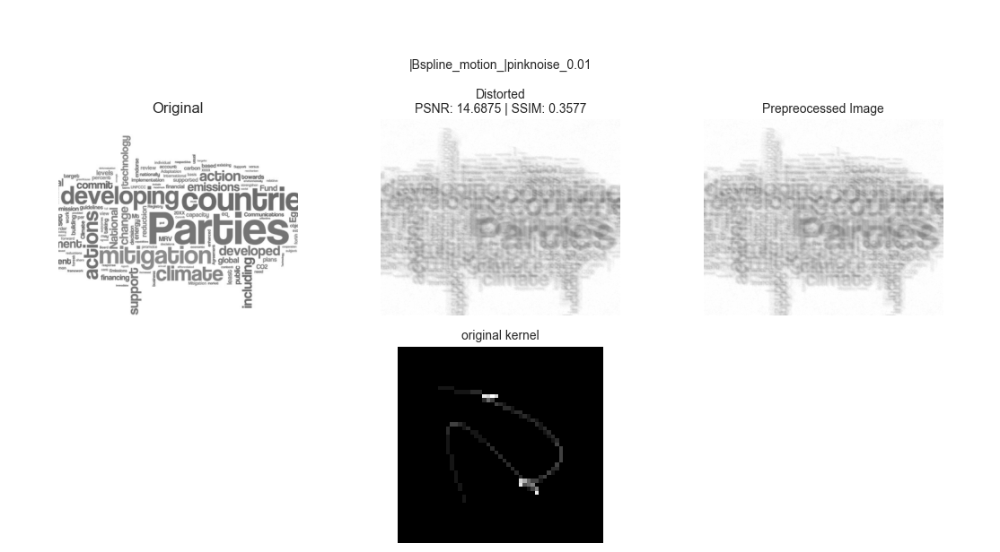

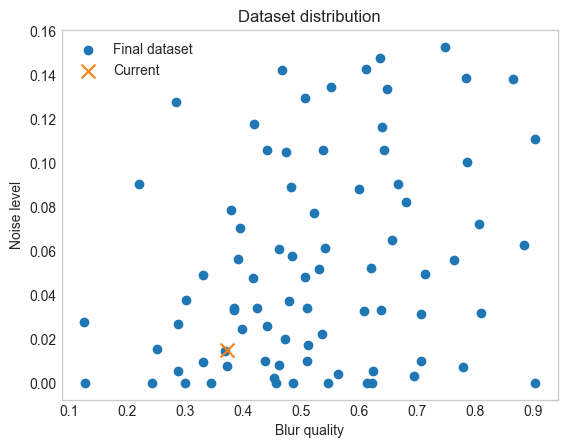

In [21]:
frame.changescale(False)

frame.read_one('text.png')


fl_gauss = GaussianNoise(6.0)
fl_pink = Pink_Noise(noise_level=0.01)
fl_brown = Brown_Noise(noise_level=0.03)
fl_poisson = PoissonNoise(param=0.3)
fl_defocus = DefocusBlur(gaussian_distribution, param=1.0,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,200])

fl = fl_bspline5
fl_noise = fl_pink

frame.filter(fl)
# frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)

frame.clear_input()

In [22]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "s_spiral"
noise = "pink"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

# kernel = get_kernel_from_filter([fl])
# kernel_path = kernel_name + "_kernel.png"
# save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
# plot_heatmap(final_points)

Готово.


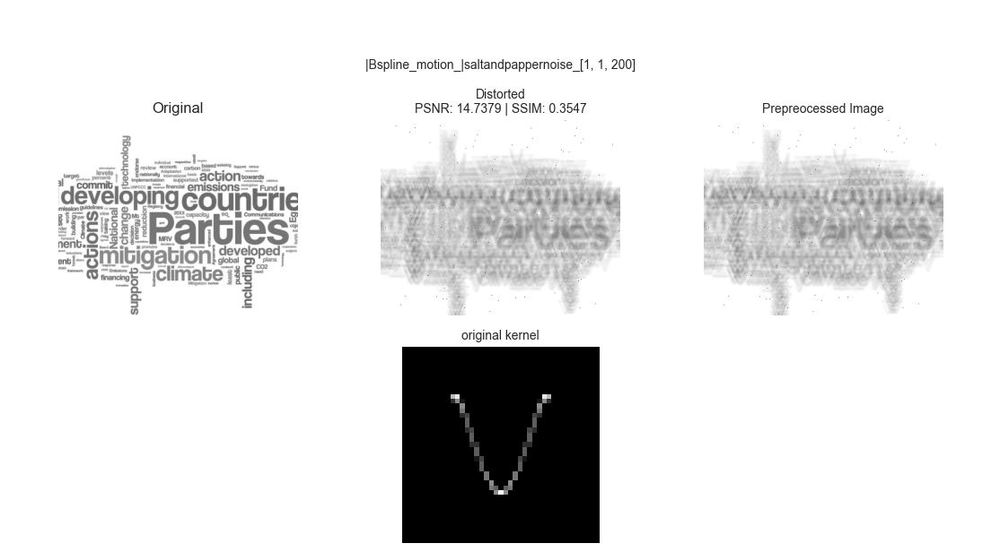

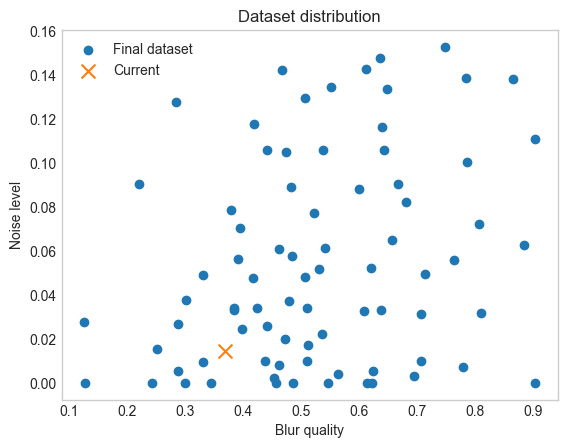

In [242]:
frame.changescale(False)

frame.read_one('text.png')


fl_gauss = GaussianNoise(6.0)
fl_pink = Pink_Noise(noise_level=0.02)
fl_brown = Brown_Noise(noise_level=0.03)
fl_poisson = PoissonNoise(param=0.3)
fl_defocus = DefocusBlur(gaussian_distribution, param=1.0,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,200])

fl = fl_bspline
fl_noise = fl_impulse

frame.filter(fl)
# frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)

frame.clear_input()

In [243]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "libra"
noise = "impulse"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

# kernel = get_kernel_from_filter([fl])
# kernel_path = kernel_name + "_kernel.png"
# save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
# plot_heatmap(final_points)

Готово.


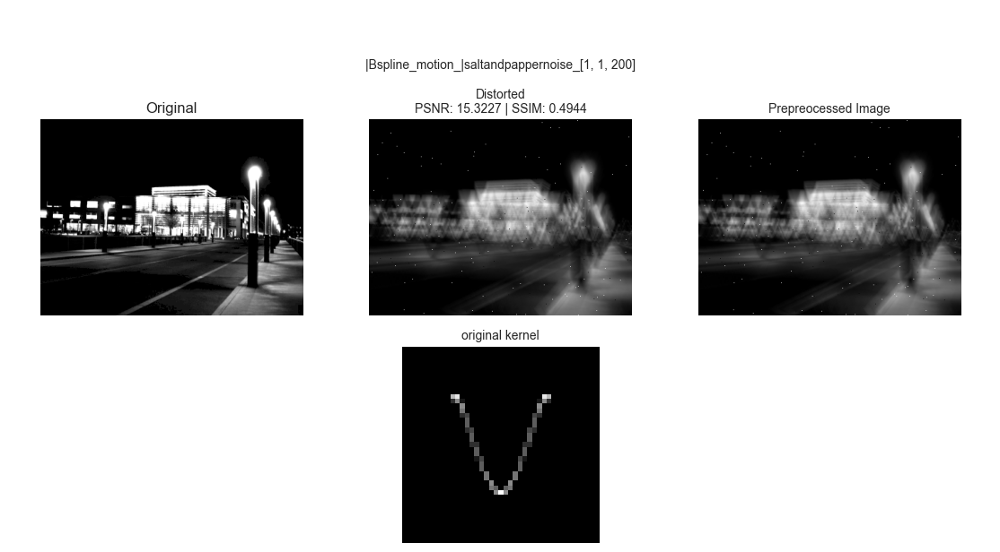

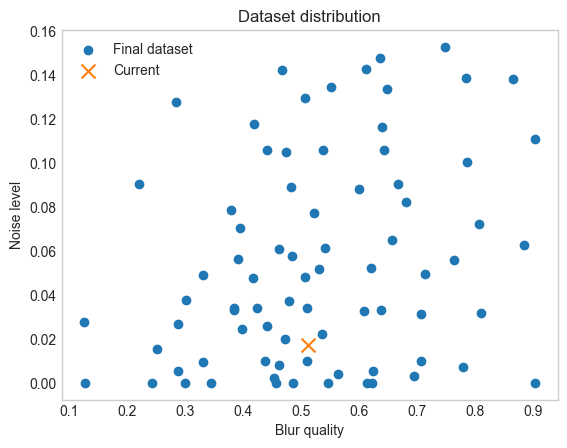

In [240]:
frame.changescale(False)

frame.read_one('saturated_img6.png')


fl_gauss = GaussianNoise(6.0)
fl_pink = Pink_Noise(noise_level=0.02)
fl_brown = Brown_Noise(noise_level=0.03)
fl_poisson = PoissonNoise(param=0.3)
fl_defocus = DefocusBlur(gaussian_distribution, param=1.0,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,200])

fl = fl_bspline
fl_noise = fl_impulse

frame.filter(fl)
# frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)

frame.clear_input()

In [241]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "libra"
noise = "impulse"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

# kernel = get_kernel_from_filter([fl])
# kernel_path = kernel_name + "_kernel.png"
# save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
# plot_heatmap(final_points)

Готово.


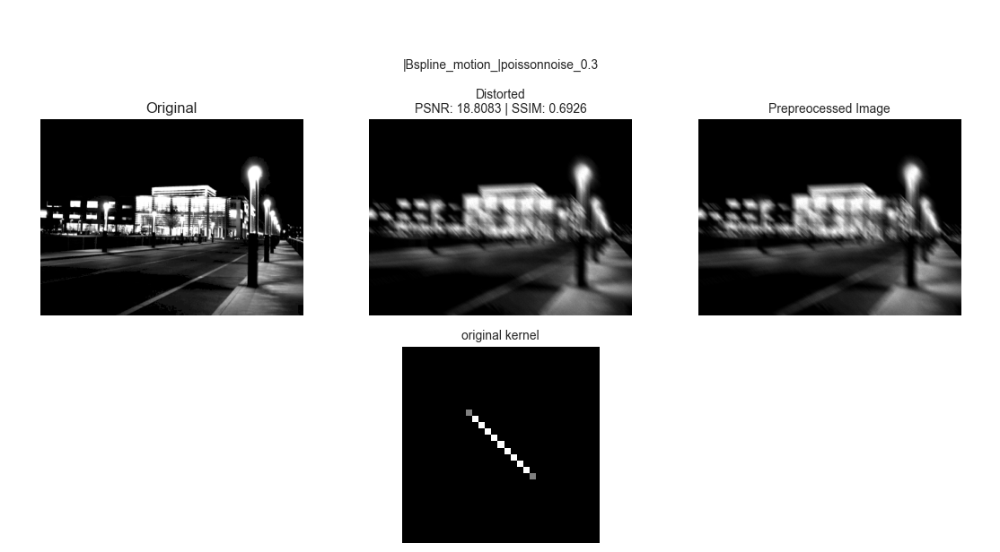

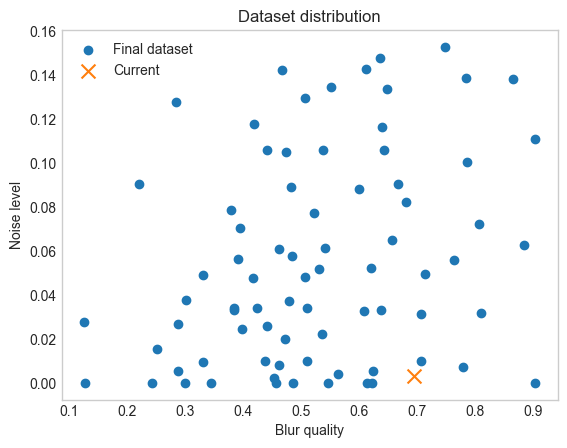

In [237]:
frame.changescale(False)

frame.read_one('saturated_img6.png')


fl_gauss = GaussianNoise(6.0)
fl_pink = Pink_Noise(noise_level=0.02)
fl_brown = Brown_Noise(noise_level=0.03)
fl_poisson = PoissonNoise(param=0.3)
fl_defocus = DefocusBlur(gaussian_distribution, param=1.0,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,300])

fl = fl_bspline12
fl_noise = fl_poisson

frame.filter(fl)
# frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)

frame.clear_input()

In [238]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "linear"
noise = "poisson"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

# kernel = get_kernel_from_filter([fl])
# kernel_path = kernel_name + "_kernel.png"
# save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
# plot_heatmap(final_points)

Готово.


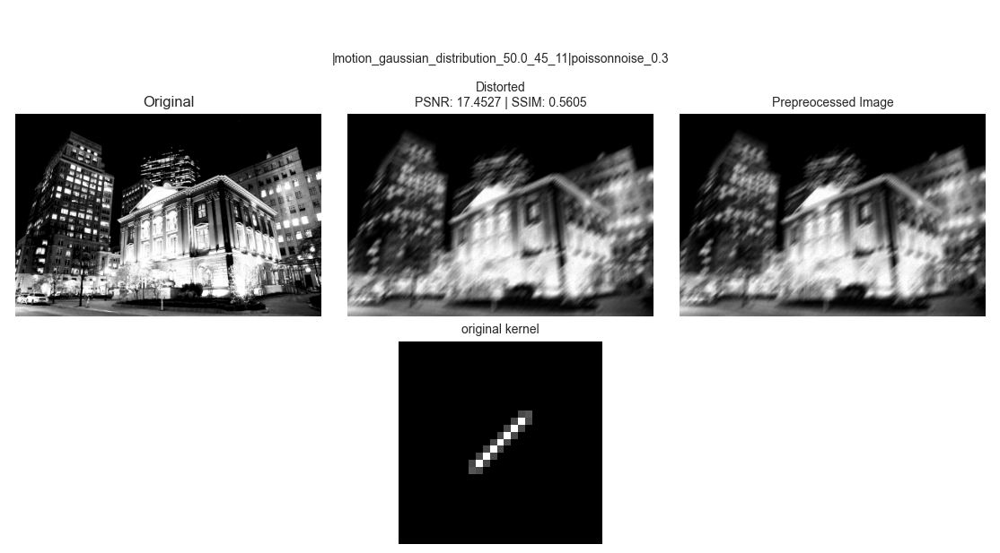

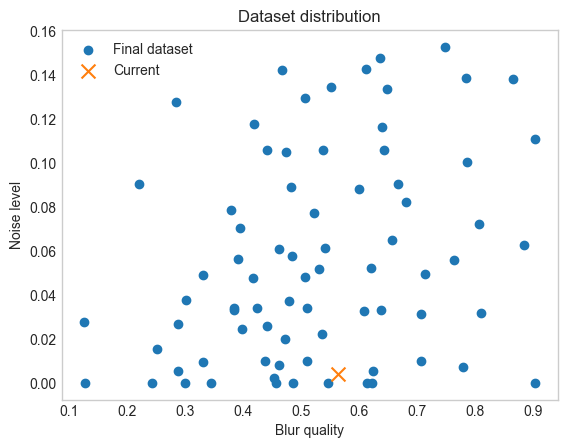

In [232]:
frame.changescale(False)

frame.read_one('saturated_02.png')


fl_gauss = GaussianNoise(6.0)
fl_pink = Pink_Noise(noise_level=0.02)
fl_brown = Brown_Noise(noise_level=0.03)
fl_poisson = PoissonNoise(param=0.3)
fl_defocus = DefocusBlur(gaussian_distribution, param=1.0,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,300])

fl = fl_motion
fl_noise = fl_poisson

frame.filter(fl)
# frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)

frame.clear_input()

In [233]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "thick_motion"
noise = "poisson"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

# kernel = get_kernel_from_filter([fl])
# kernel_path = kernel_name + "_kernel.png"
# save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
# plot_heatmap(final_points)

Готово.


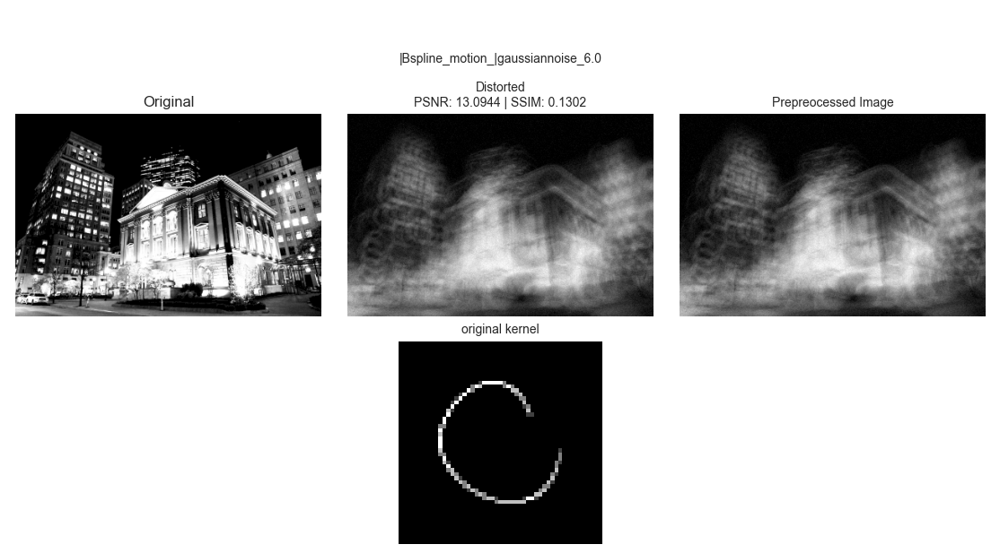

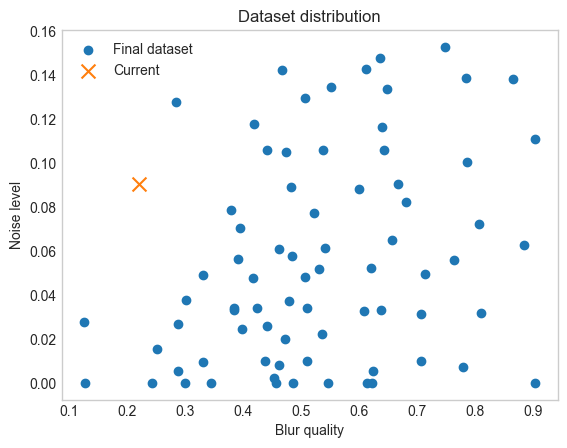

In [229]:
frame.changescale(False)

frame.read_one('saturated_02.png')


fl_gauss = GaussianNoise(6.0)
fl_pink = Pink_Noise(noise_level=0.02)
fl_brown = Brown_Noise(noise_level=0.03)
fl_poisson = PoissonNoise(param=0.23)
fl_defocus = DefocusBlur(gaussian_distribution, param=1.0,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,300])

fl = fl_bspline6
fl_noise = fl_gauss

frame.filter(fl)
# frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)

frame.clear_input()

In [230]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "moon"
noise = "gauss"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

# kernel = get_kernel_from_filter([fl])
# kernel_path = kernel_name + "_kernel.png"
# save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
# plot_heatmap(final_points)

Готово.


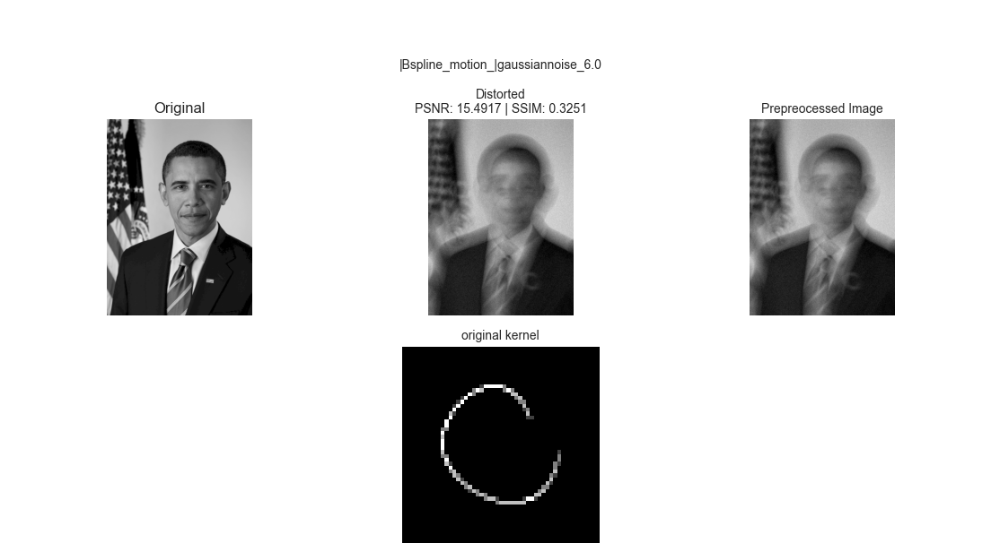

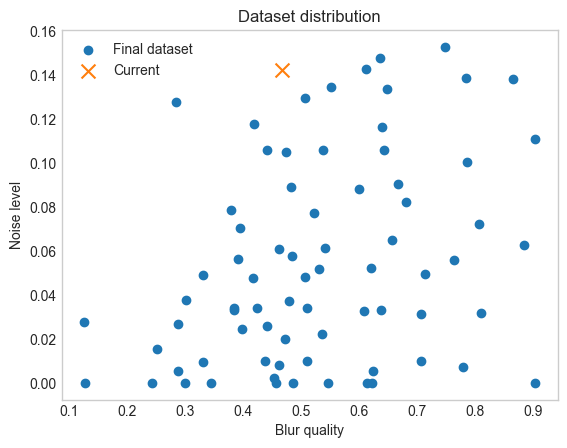

In [227]:
frame.changescale(False)

frame.read_one('obama.png')


fl_gauss = GaussianNoise(6.0)
fl_pink = Pink_Noise(noise_level=0.02)
fl_brown = Brown_Noise(noise_level=0.03)
fl_poisson = PoissonNoise(param=0.23)
fl_defocus = DefocusBlur(gaussian_distribution, param=1.0,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,300])

fl = fl_bspline6
fl_noise = fl_gauss

frame.filter(fl)
# frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)

frame.clear_input()

In [228]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "moon"
noise = "gauss"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

# kernel = get_kernel_from_filter([fl])
# kernel_path = kernel_name + "_kernel.png"
# save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
# plot_heatmap(final_points)

Готово.


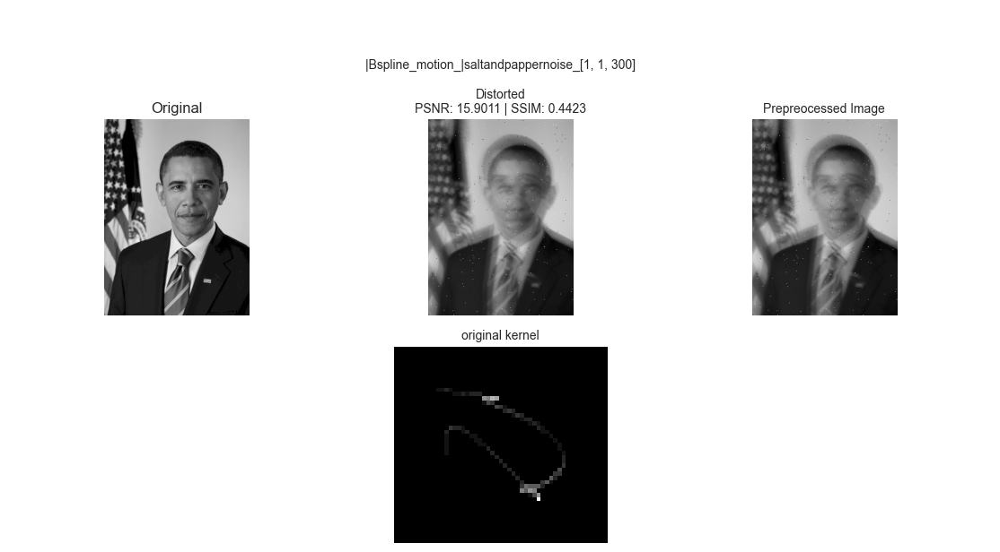

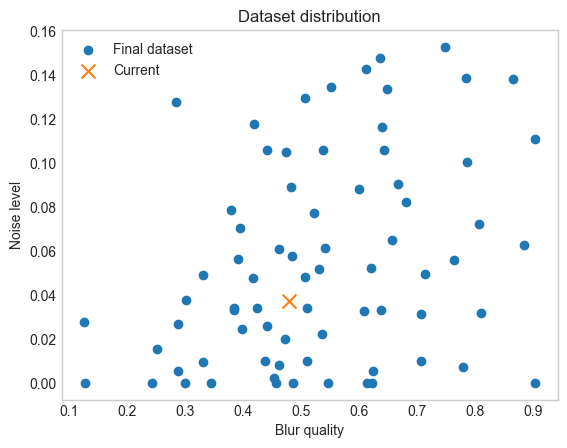

In [224]:
frame.changescale(False)

frame.read_one('obama.png')


fl_gauss = GaussianNoise(1.0)
fl_pink = Pink_Noise(noise_level=0.02)
fl_brown = Brown_Noise(noise_level=0.03)
fl_poisson = PoissonNoise(param=0.23)
fl_defocus = DefocusBlur(gaussian_distribution, param=1.0,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,300])

fl = fl_bspline4
fl_noise = fl_impulse

frame.filter(fl)
# frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)

frame.clear_input()

In [225]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "s_spiral"
noise = "impulse"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

# kernel = get_kernel_from_filter([fl])
# kernel_path = kernel_name + "_kernel.png"
# save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
# plot_heatmap(final_points)

Готово.


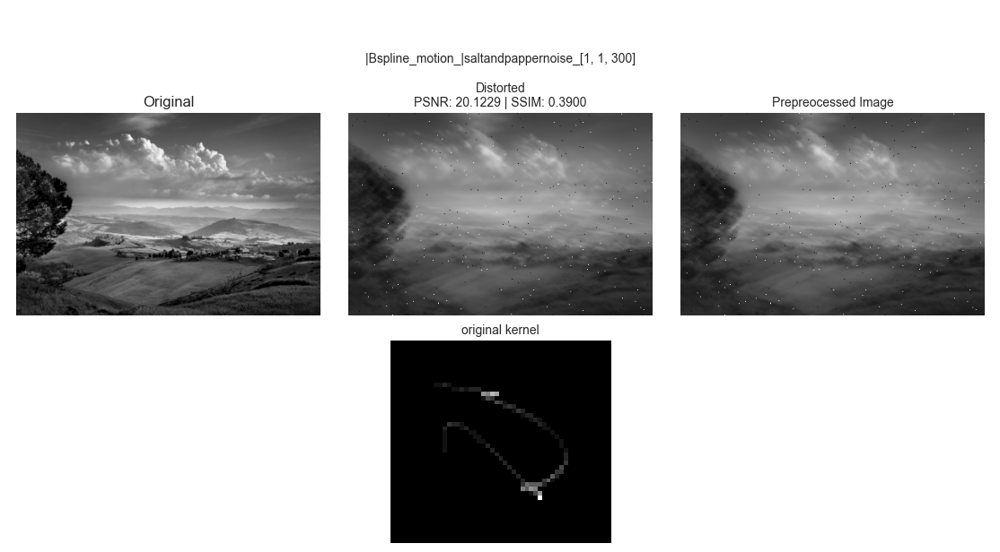

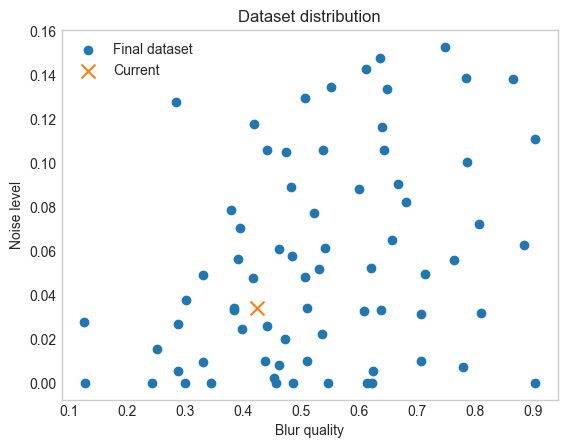

In [222]:
frame.changescale(False)

frame.read_one('natural_02.png')


fl_gauss = GaussianNoise(1.0)
fl_pink = Pink_Noise(noise_level=0.02)
fl_brown = Brown_Noise(noise_level=0.03)
fl_poisson = PoissonNoise(param=0.23)
fl_defocus = DefocusBlur(gaussian_distribution, param=1.0,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,300])

fl = fl_bspline4
fl_noise = fl_impulse

frame.filter(fl)
# frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)

frame.clear_input()

In [223]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "s_spiral"
noise = "impulse"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

# kernel = get_kernel_from_filter([fl])
# kernel_path = kernel_name + "_kernel.png"
# save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
# plot_heatmap(final_points)

Готово.


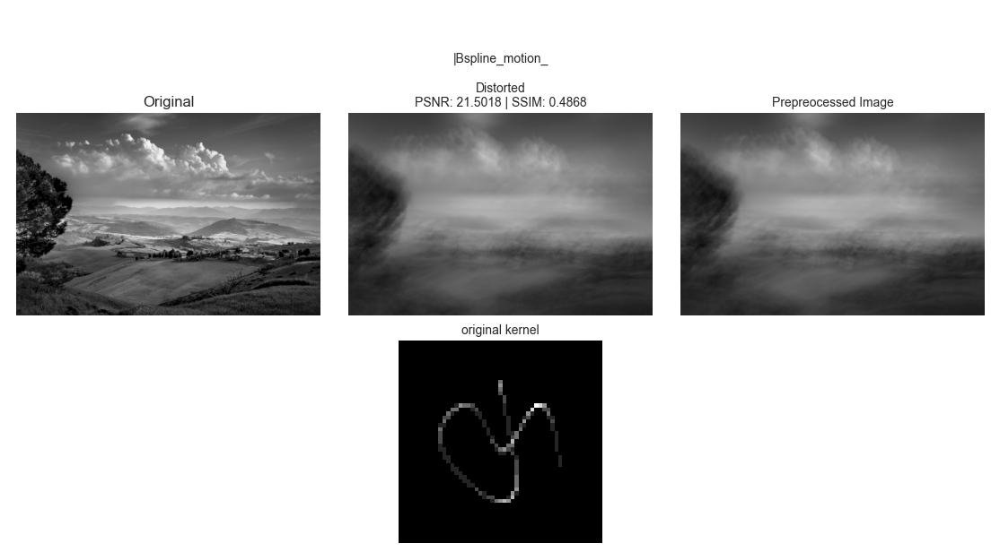

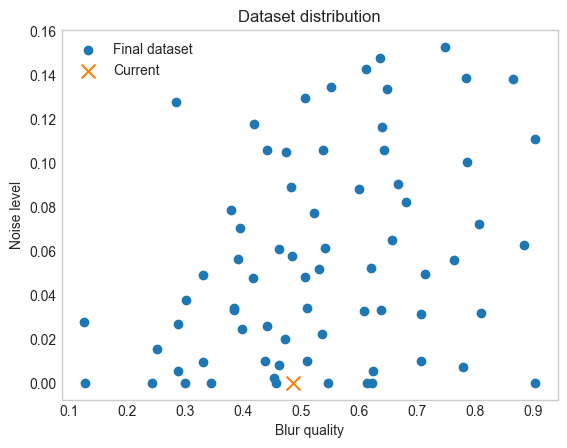

In [220]:
frame.changescale(False)

frame.read_one('natural_02.png')


fl_gauss = GaussianNoise(1.0)
fl_pink = Pink_Noise(noise_level=0.02)
fl_brown = Brown_Noise(noise_level=0.03)
fl_poisson = PoissonNoise(param=0.23)
fl_defocus = DefocusBlur(gaussian_distribution, param=1.0,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,300])

fl = fl_bspline3
fl_noise = fl_gauss

frame.filter(fl)
# frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
# frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)

frame.clear_input()

In [221]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "w_spiral"
noise = ""
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

# kernel = get_kernel_from_filter([fl])
# kernel_path = kernel_name + "_kernel.png"
# save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
# plot_heatmap(final_points)

Готово.


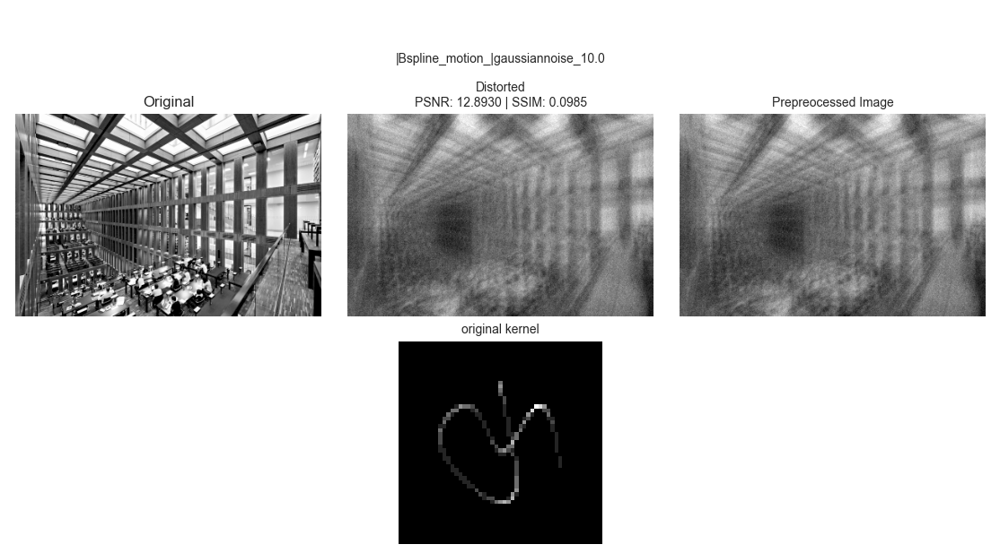

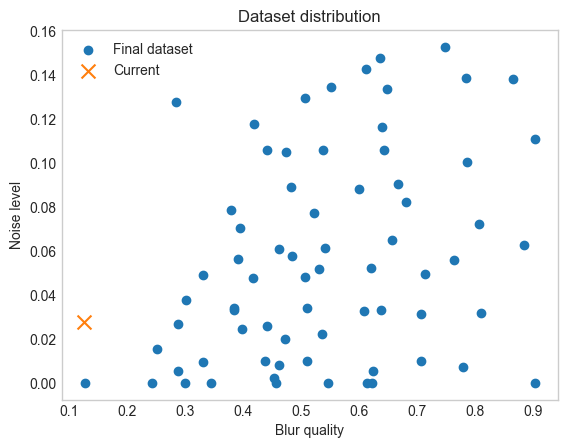

In [216]:
frame.changescale(False)

frame.read_one('manmade_01.png')


fl_gauss = GaussianNoise(10.0)
fl_pink = Pink_Noise(noise_level=0.02)
fl_brown = Brown_Noise(noise_level=0.03)
fl_poisson = PoissonNoise(param=0.23)
fl_defocus = DefocusBlur(gaussian_distribution, param=1.0,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,300])

fl = fl_bspline3
fl_noise = fl_gauss

frame.filter(fl)
# frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)

frame.clear_input()

In [217]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "w_spiral"
noise = "gauss"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

# kernel = get_kernel_from_filter([fl])
# kernel_path = kernel_name + "_kernel.png"
# save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
# plot_heatmap(final_points)

Готово.


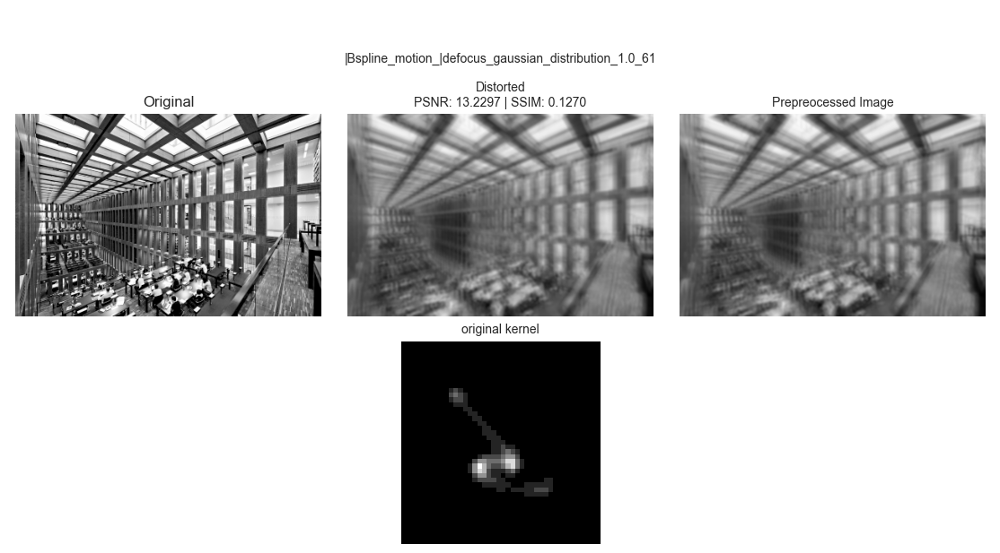

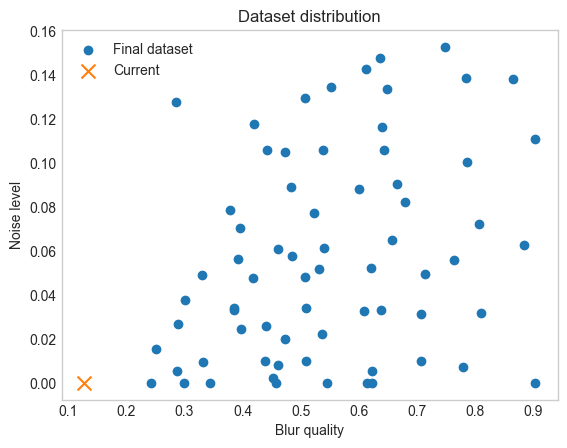

In [211]:
frame.changescale(False)

frame.read_one('manmade_01.png')


fl_gauss = GaussianNoise(5.0)
fl_pink = Pink_Noise(noise_level=0.02)
fl_brown = Brown_Noise(noise_level=0.03)
fl_poisson = PoissonNoise(param=0.23)
fl_defocus = DefocusBlur(gaussian_distribution, param=1.0,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,300])

fl = fl_bspline1
fl_noise = fl_pink

frame.filter(fl)
frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
# frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)

frame.clear_input()

In [212]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "hook_defocus"
noise = ""
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

# kernel = get_kernel_from_filter([fl])
# kernel_path = kernel_name + "_kernel.png"
# save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
# plot_heatmap(final_points)

Готово.


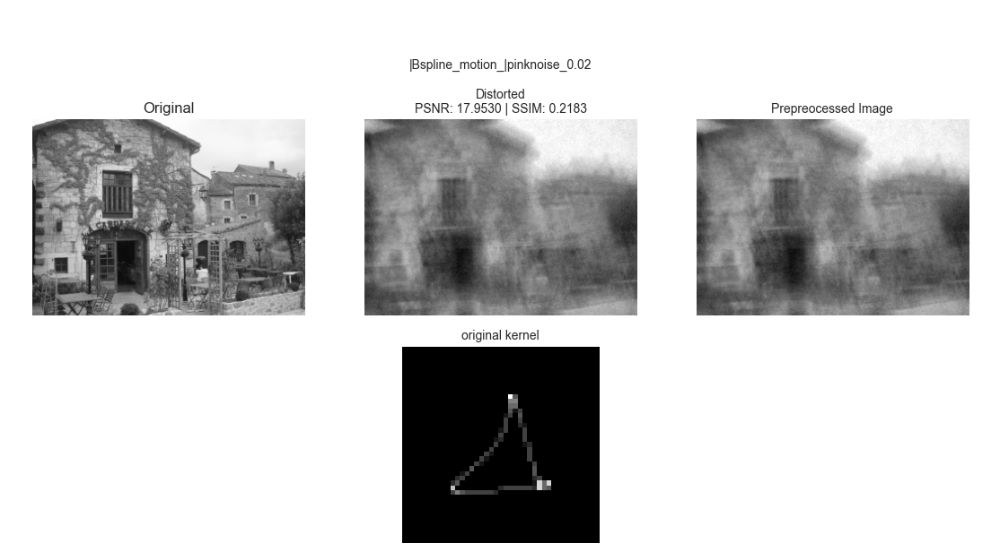

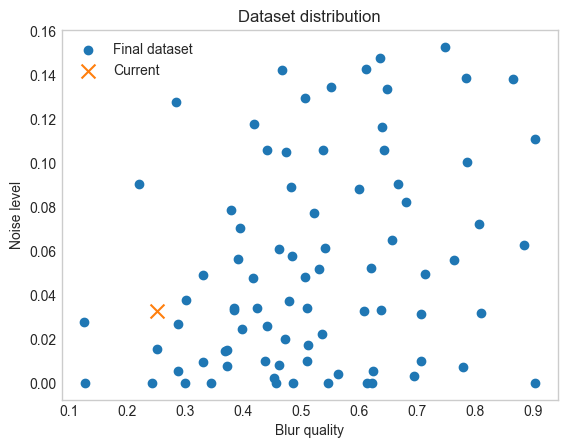

In [23]:
frame.changescale(False)

frame.read_one('img40_groundtruth_img.png')


fl_gauss = GaussianNoise(5.0)
fl_pink = Pink_Noise(noise_level=0.02)
fl_brown = Brown_Noise(noise_level=0.03)
fl_poisson = PoissonNoise(param=0.23)
fl_defocus = DefocusBlur(gaussian_distribution, param=2.0,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,300])

fl = fl_bspline19
fl_noise = fl_pink

frame.filter(fl)
# frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)

frame.clear_input()

In [24]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "triangle"
noise = "pink"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

# kernel = get_kernel_from_filter([fl])
# kernel_path = kernel_name + "_kernel.png"
# save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
# plot_heatmap(final_points)

Готово.


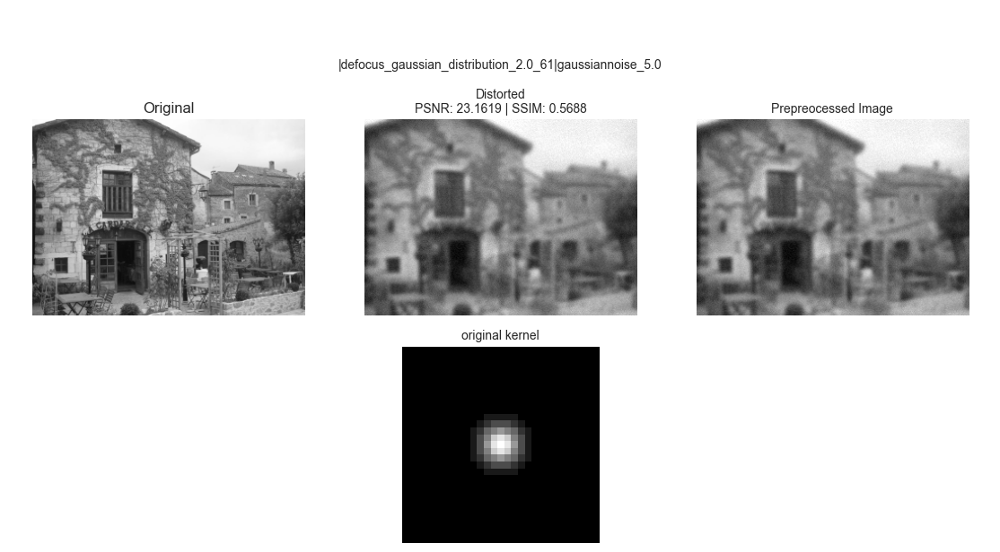

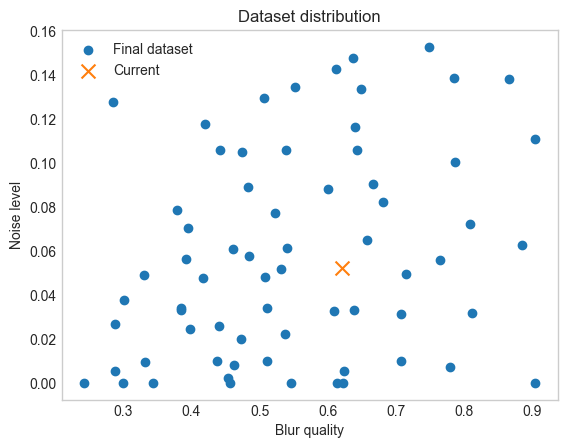

In [204]:
frame.changescale(False)

frame.read_one('img40_groundtruth_img.png')


fl_gauss = GaussianNoise(5.0)
fl_pink = Pink_Noise(noise_level=0.01)
fl_brown = Brown_Noise(noise_level=0.03)
fl_poisson = PoissonNoise(param=0.23)
fl_defocus = DefocusBlur(gaussian_distribution, param=2.0,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,300])

fl = fl_defocus
fl_noise = fl_gauss

frame.filter(fl)
# frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)

frame.clear_input()

In [205]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "defocus"
noise = "gauss"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

# kernel = get_kernel_from_filter([fl])
# kernel_path = kernel_name + "_kernel.png"
# save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
# plot_heatmap(final_points)

Готово.


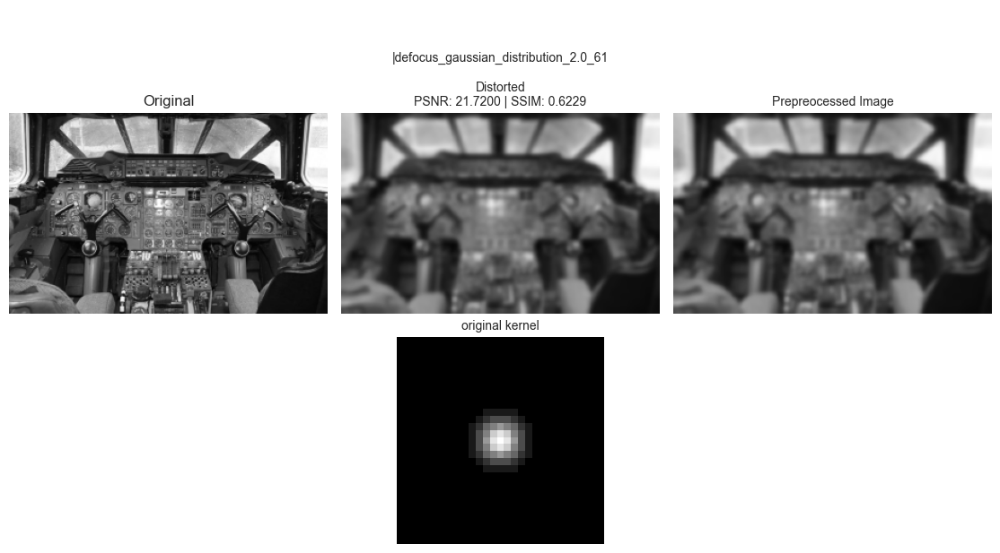

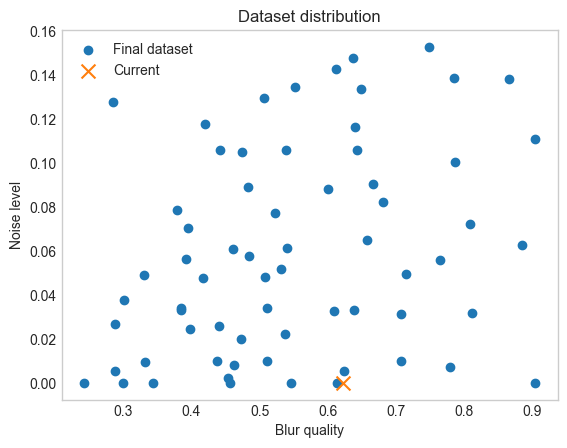

In [200]:
frame.changescale(False)

frame.read_one('img24_groundtruth_img.png')


fl_gauss = GaussianNoise(1.0)
fl_pink = Pink_Noise(noise_level=0.01)
fl_brown = Brown_Noise(noise_level=0.03)
fl_poisson = PoissonNoise(param=0.23)
fl_defocus = DefocusBlur(gaussian_distribution, param=2.0,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,300])

fl = fl_defocus
fl_noise = fl_gauss

frame.filter(fl)
# frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
# frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)

frame.clear_input()

In [201]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "defocus"
noise = "gauss"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

# kernel = get_kernel_from_filter([fl])
# kernel_path = kernel_name + "_kernel.png"
# save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
# plot_heatmap(final_points)

Готово.


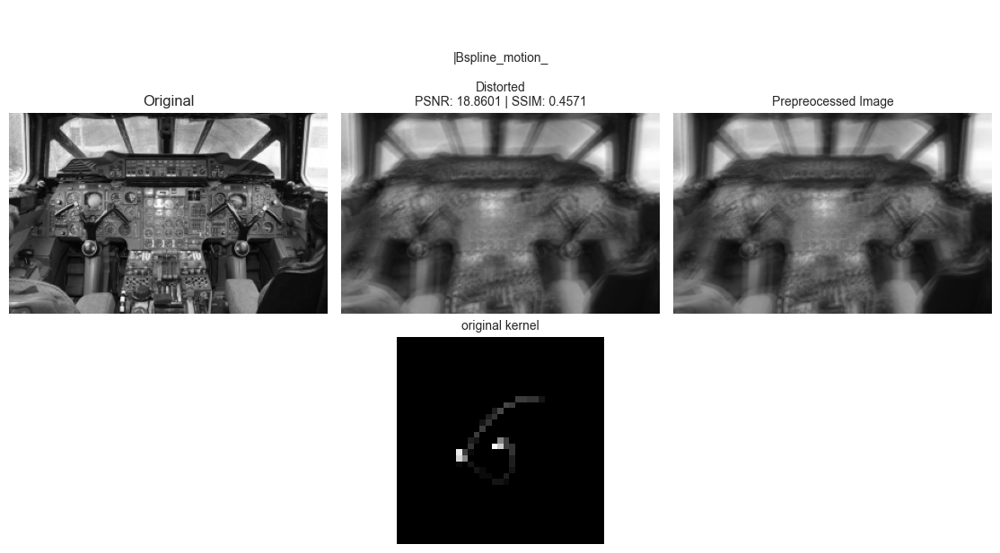

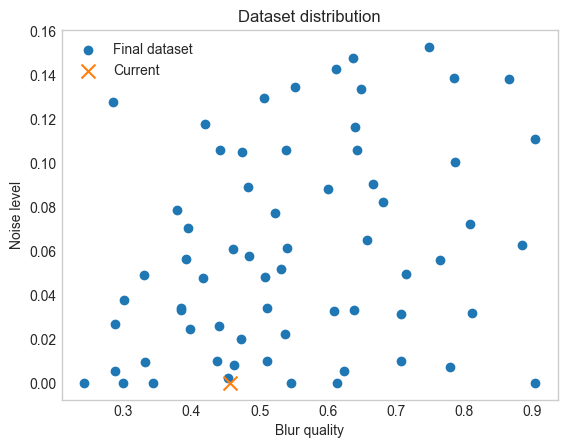

In [197]:
frame.changescale(False)

frame.read_one('img24_groundtruth_img.png')


fl_gauss = GaussianNoise(2.0)
fl_pink = Pink_Noise(noise_level=0.01)
fl_brown = Brown_Noise(noise_level=0.03)
fl_poisson = PoissonNoise(param=0.23)
fl_defocus = DefocusBlur(gaussian_distribution, param=2.0,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,300])

fl = fl_bspline10
fl_noise = fl_brown

frame.filter(fl)
# frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
# frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)

frame.clear_input()

In [198]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "sigma"
noise = ""
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

# kernel = get_kernel_from_filter([fl])
# kernel_path = kernel_name + "_kernel.png"
# save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
# plot_heatmap(final_points)

Готово.


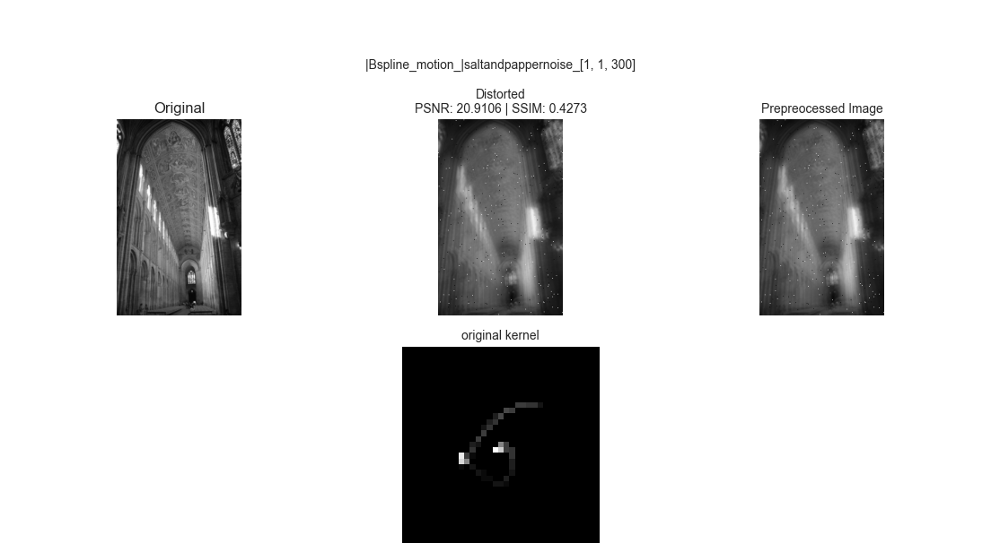

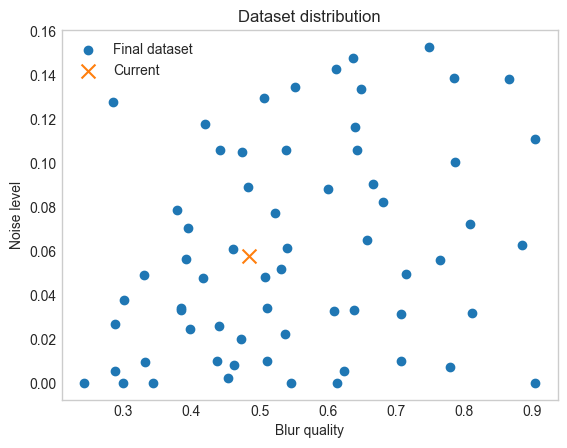

In [193]:
frame.changescale(False)

frame.read_one('img18_groundtruth_img.png')


fl_gauss = GaussianNoise(2.0)
fl_pink = Pink_Noise(noise_level=0.01)
fl_brown = Brown_Noise(noise_level=0.02)
fl_poisson = PoissonNoise(param=0.23)
fl_defocus = DefocusBlur(gaussian_distribution, param=2.0,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,300])

fl = fl_bspline10
fl_noise = fl_impulse

frame.filter(fl)
# frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)

frame.clear_input()

In [194]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "sigma"
noise = "impulse"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

# kernel = get_kernel_from_filter([fl])
# kernel_path = kernel_name + "_kernel.png"
# save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
# plot_heatmap(final_points)

Готово.


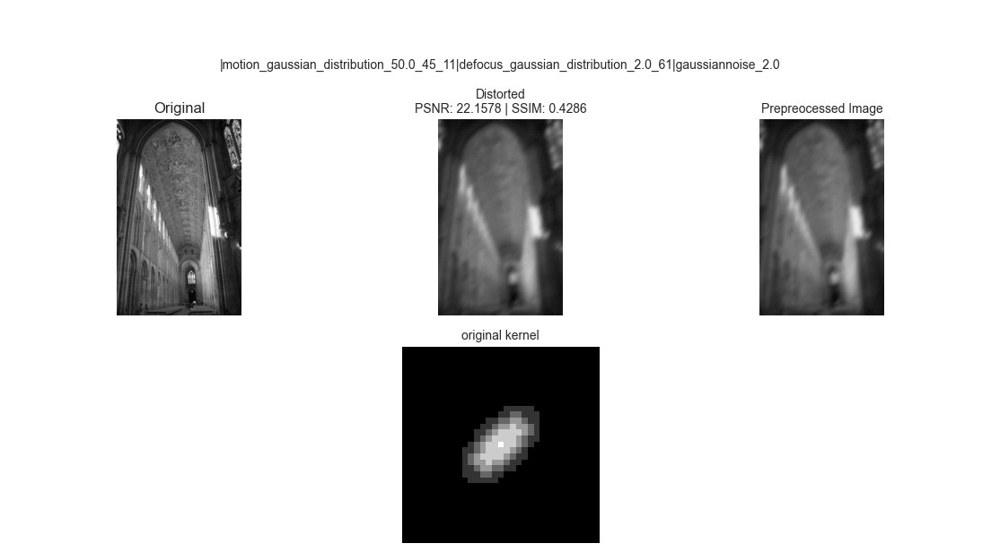

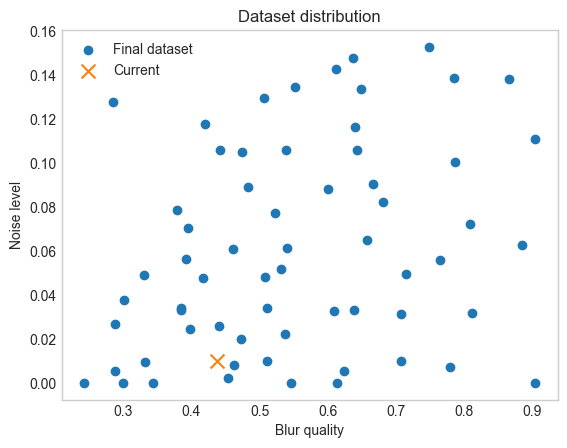

In [189]:
frame.changescale(False)

frame.read_one('img18_groundtruth_img.png')


fl_gauss = GaussianNoise(2.0)
fl_pink = Pink_Noise(noise_level=0.01)
fl_brown = Brown_Noise(noise_level=0.02)
fl_poisson = PoissonNoise(param=0.23)
fl_defocus = DefocusBlur(gaussian_distribution, param=2.0,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,300])

fl = fl_motion
fl_noise = fl_gauss

frame.filter(fl)
frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)

frame.clear_input()

In [190]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "defocusmotion"
noise = "gauss"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

# kernel = get_kernel_from_filter([fl])
# kernel_path = kernel_name + "_kernel.png"
# save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
# plot_heatmap(final_points)

Готово.


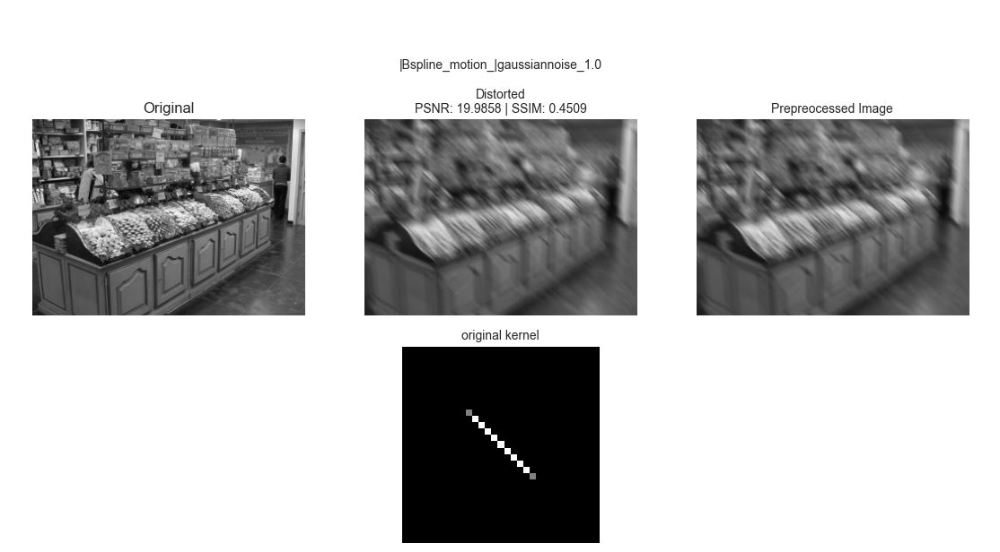

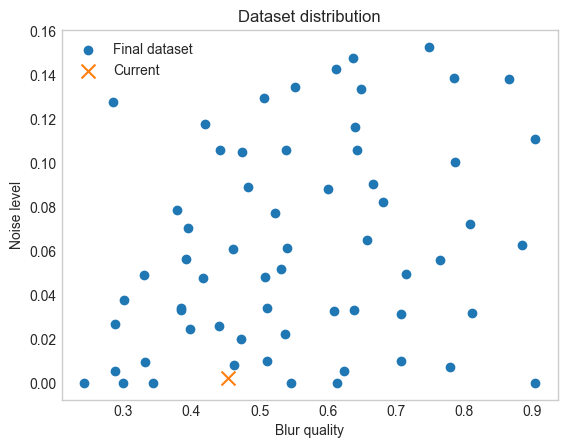

In [184]:
frame.changescale(False)

frame.read_one('img16_groundtruth_img.png')


fl_gauss = GaussianNoise(1.0)
fl_pink = Pink_Noise(noise_level=0.01)
fl_brown = Brown_Noise(noise_level=0.02)
fl_poisson = PoissonNoise(param=0.23)
fl_defocus = DefocusBlur(gaussian_distribution, param=1.0,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,300])

fl = fl_bspline12
fl_noise = fl_gauss

frame.filter(fl)
# frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)

frame.clear_input()

In [185]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "linear"
noise = "gauss"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

# kernel = get_kernel_from_filter([fl])
# kernel_path = kernel_name + "_kernel.png"
# save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
# plot_heatmap(final_points)

Готово.


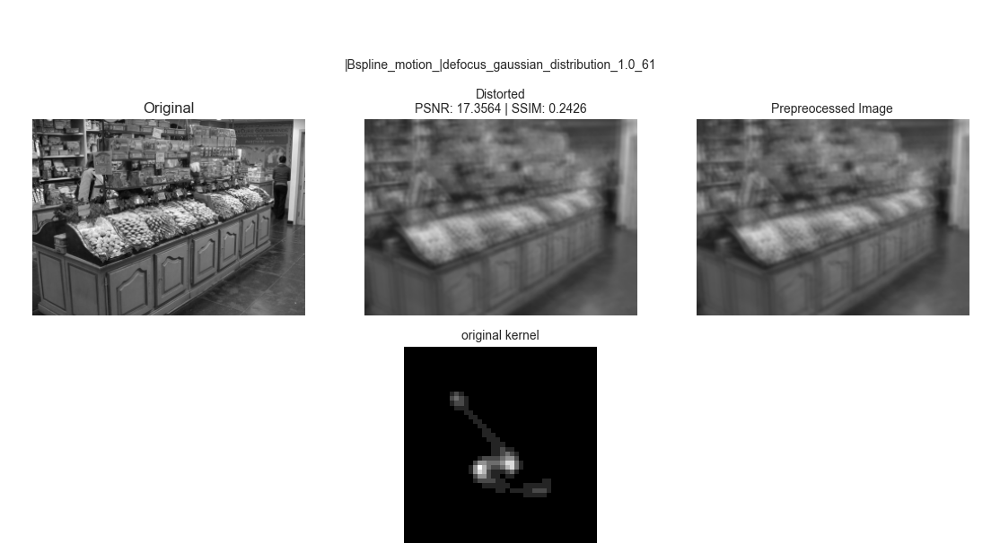

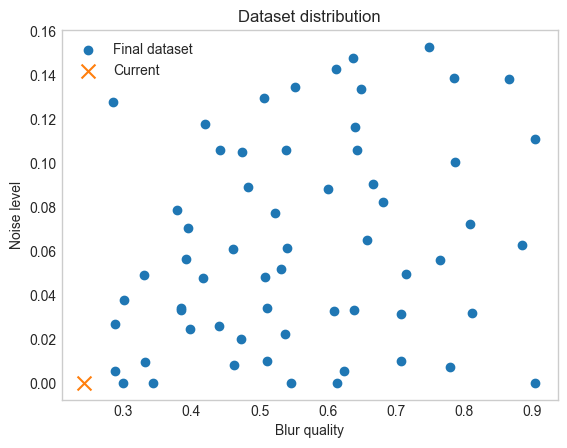

In [177]:
frame.changescale(False)

frame.read_one('img16_groundtruth_img.png')


fl_gauss = GaussianNoise(5.0)
fl_pink = Pink_Noise(noise_level=0.01)
fl_brown = Brown_Noise(noise_level=0.02)
fl_poisson = PoissonNoise(param=0.23)
fl_defocus = DefocusBlur(gaussian_distribution, param=1.0,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,300])

fl = fl_bspline1
fl_noise = fl_poisson

frame.filter(fl)
frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
# frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)

frame.clear_input()

Готово.


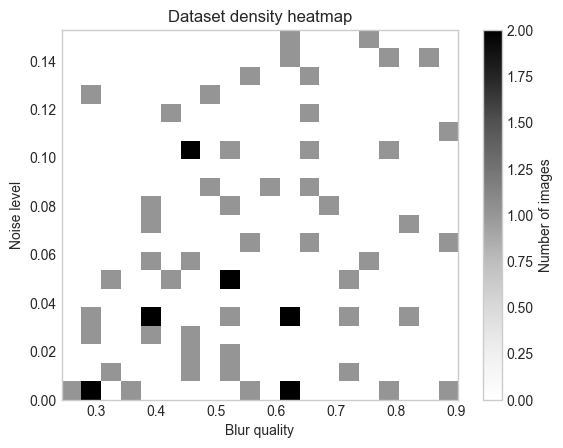

In [178]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "hook_defocus"
noise = ""
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

kernel = get_kernel_from_filter([fl, fl_defocus])
kernel_path = kernel_name + "_kernel.png"
save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
plot_heatmap(final_points)

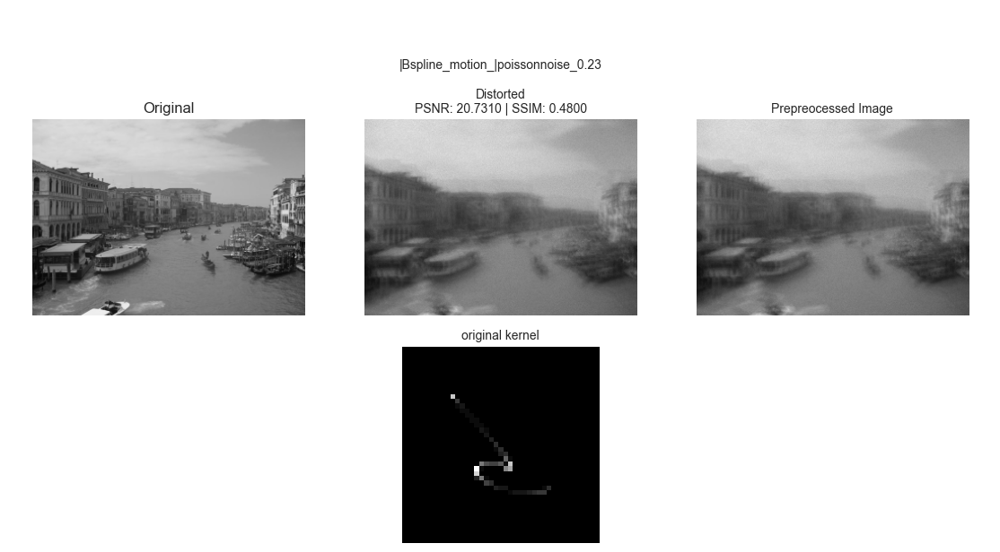

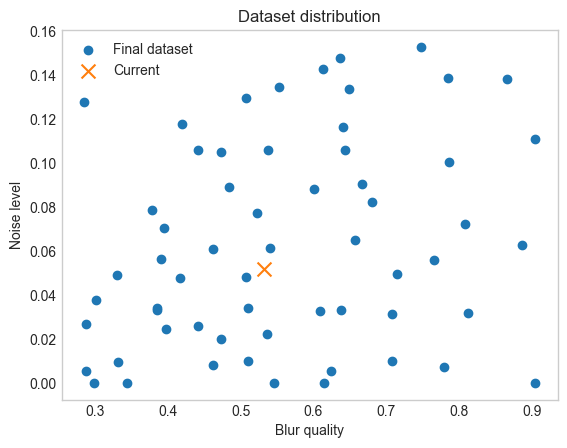

In [172]:
frame.changescale(False)

frame.read_one('img15_groundtruth_img.png')


fl_gauss = GaussianNoise(5.0)
fl_pink = Pink_Noise(noise_level=0.01)
fl_brown = Brown_Noise(noise_level=0.02)
fl_poisson = PoissonNoise(param=0.23)
fl_defocus = DefocusBlur(gaussian_distribution, param=0.5,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,300])

fl = fl_bspline1
fl_noise = fl_poisson

frame.filter(fl)
# frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)

frame.clear_input()

Готово.


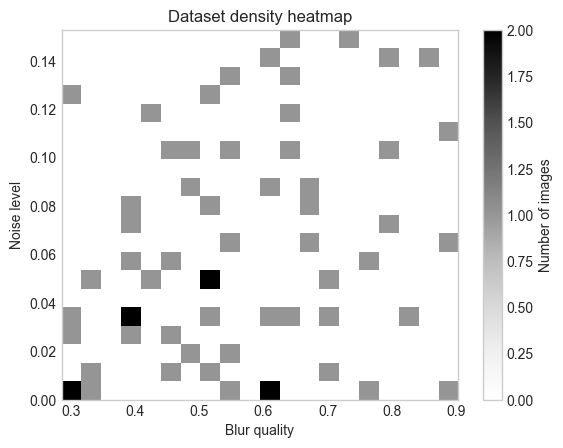

In [173]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "hook"
noise = "pink"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

kernel = get_kernel_from_filter([fl])
kernel_path = kernel_name + "_kernel.png"
save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
plot_heatmap(final_points)

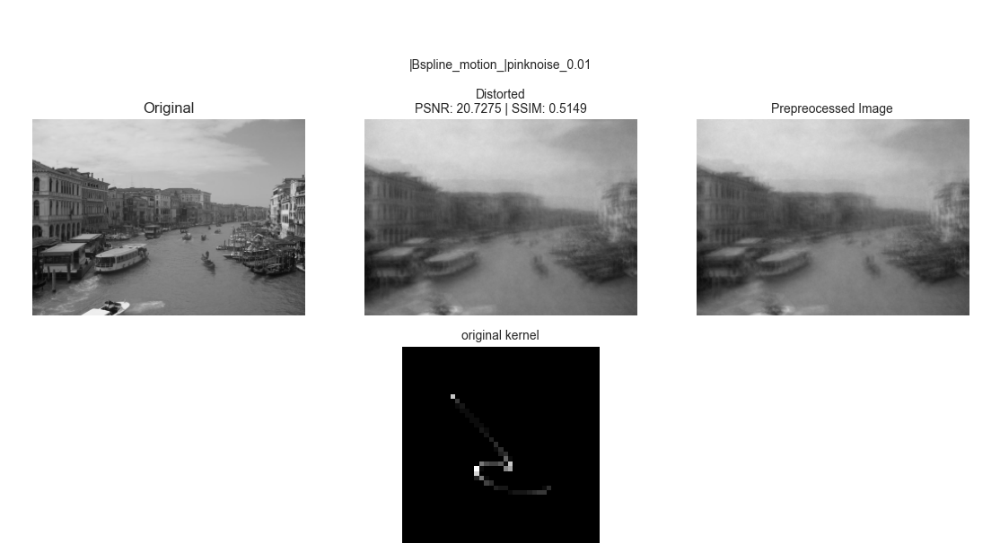

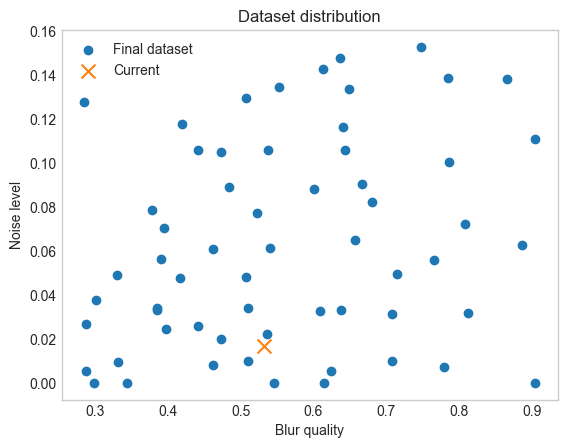

In [ ]:
frame.changescale(False)

frame.read_one('img15_groundtruth_img.png')


fl_gauss = GaussianNoise(5.0)
fl_pink = Pink_Noise(noise_level=0.01)
fl_brown = Brown_Noise(noise_level=0.02)
fl_poisson = PoissonNoise(param=0.23)
fl_defocus = DefocusBlur(gaussian_distribution, param=0.5,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,300])

fl = fl_bspline6
fl_noise = fl_poisson

frame.filter(fl)
# frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)

frame.clear_input()

Готово.


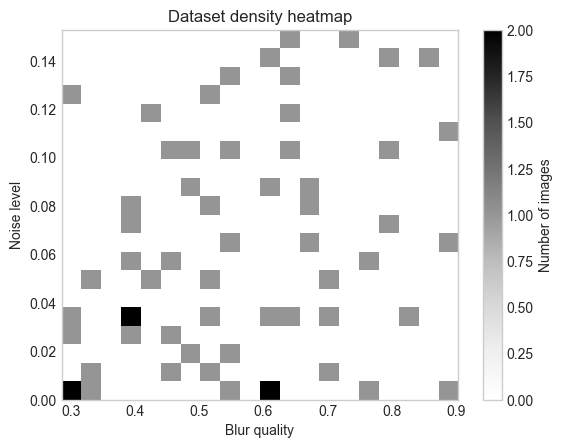

In [ ]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "moon"
noise = "poisson"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

kernel = get_kernel_from_filter([fl])
kernel_path = kernel_name + "_kernel.png"
save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
plot_heatmap(final_points)

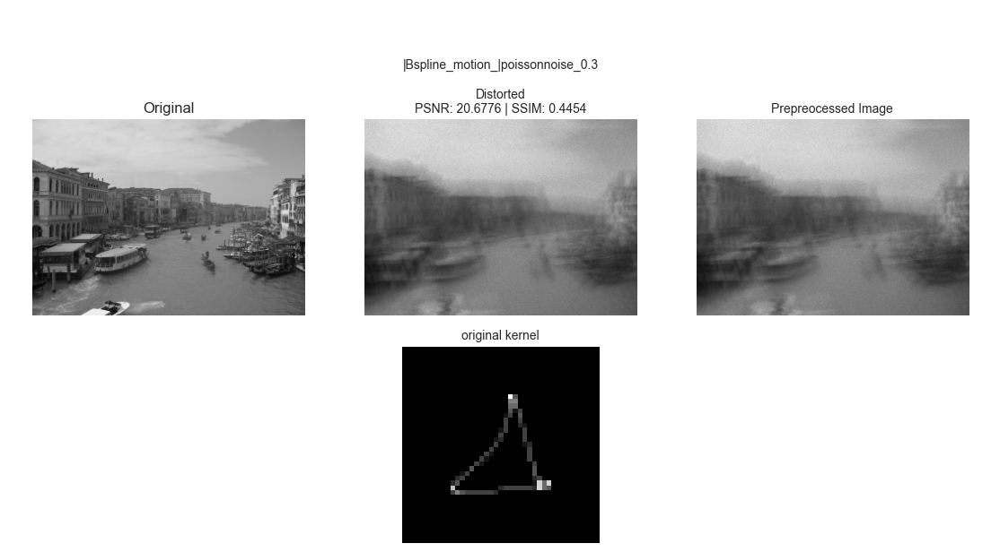

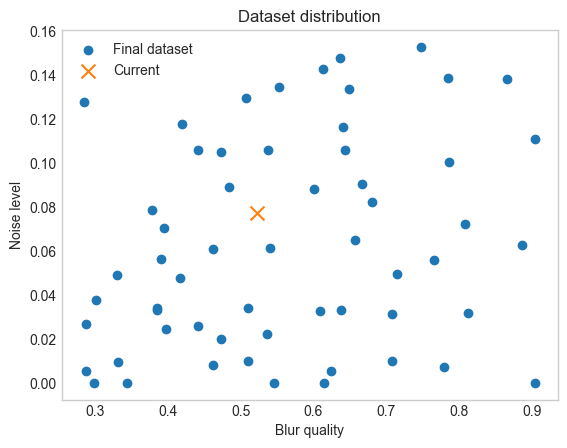

In [163]:
frame.changescale(False)

frame.read_one('img15_groundtruth_img.png')


fl_gauss = GaussianNoise(5.0)
fl_pink = Pink_Noise(noise_level=0.01)
fl_brown = Brown_Noise(noise_level=0.02)
fl_poisson = PoissonNoise(param=0.3)
fl_defocus = DefocusBlur(gaussian_distribution, param=0.5,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,300])

fl = fl_bspline19
fl_noise = fl_poisson

frame.filter(fl)
# frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)

frame.clear_input()

In [164]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "triangle"
noise = "poisson"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

# kernel = get_kernel_from_filter([fl])
# kernel_path = kernel_name + "_kernel.png"
# save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
# plot_heatmap(final_points)

Готово.


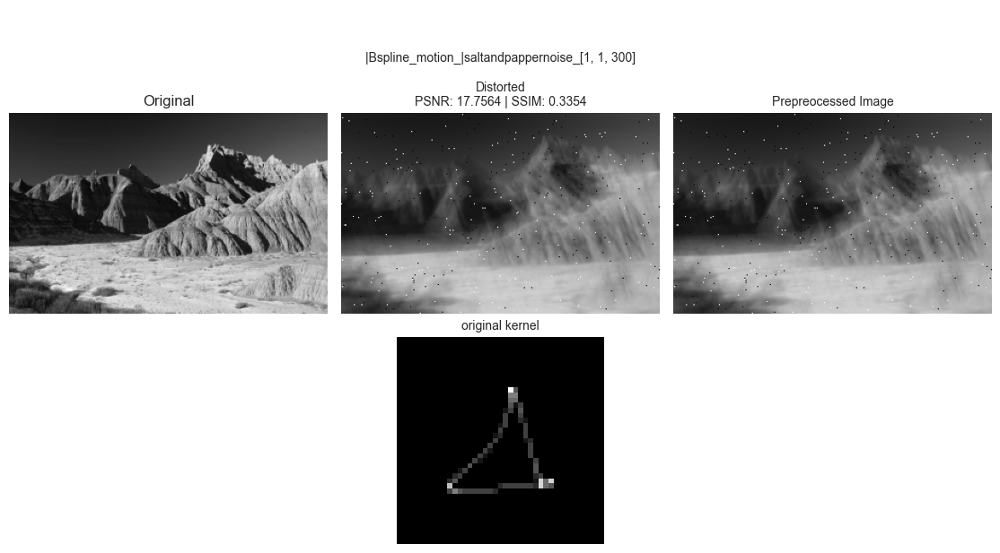

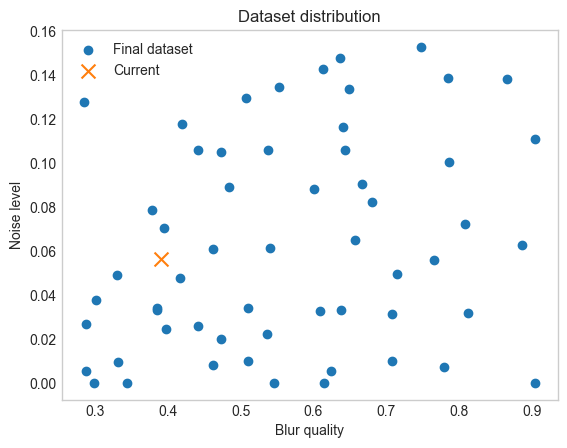

In [160]:
frame.changescale(False)

frame.read_one('img3_groundtruth_img.png')


fl_gauss = GaussianNoise(5.0)
fl_pink = Pink_Noise(noise_level=0.01)
fl_brown = Brown_Noise(noise_level=0.02)
fl_poisson = PoissonNoise(param=0.35)
fl_defocus = DefocusBlur(gaussian_distribution, param=0.5,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,300])

fl = fl_bspline19
fl_noise = fl_impulse

frame.filter(fl)
# frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)

frame.clear_input()

Готово.


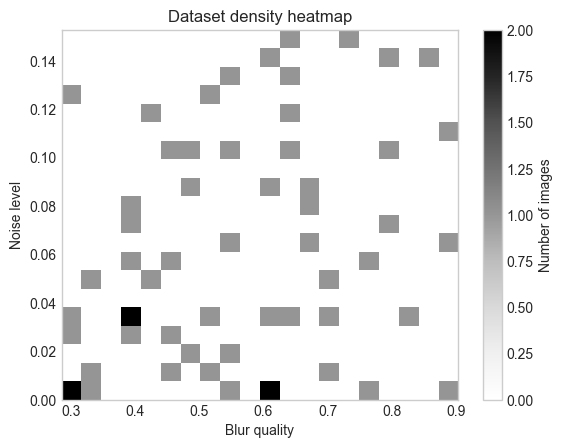

In [161]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "triangle"
noise = "impulse"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

kernel = get_kernel_from_filter([fl])
kernel_path = kernel_name + "_kernel.png"
save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
plot_heatmap(final_points)

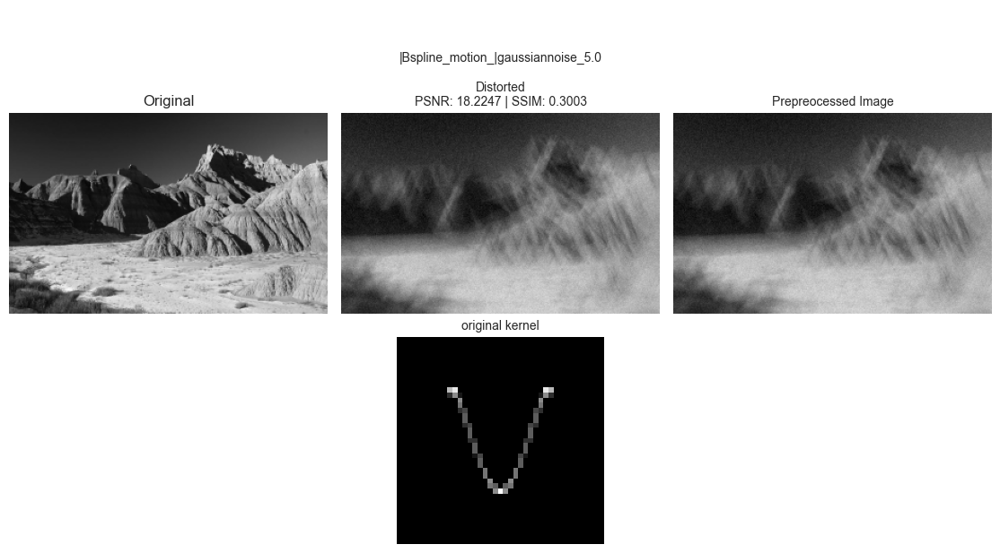

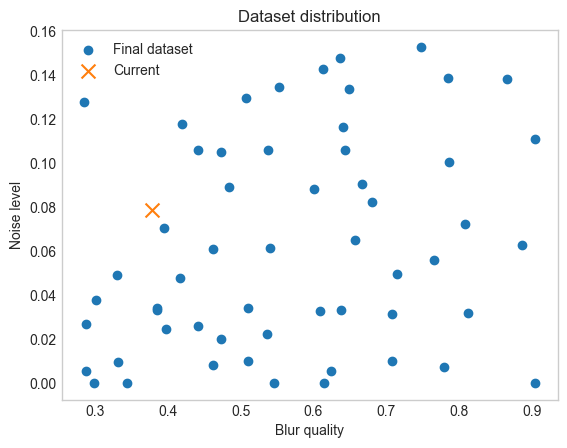

In [157]:
frame.changescale(False)

frame.read_one('img3_groundtruth_img.png')


fl_gauss = GaussianNoise(5.0)
fl_pink = Pink_Noise(noise_level=0.01)
fl_brown = Brown_Noise(noise_level=0.02)
fl_poisson = PoissonNoise(param=0.35)
fl_defocus = DefocusBlur(gaussian_distribution, param=0.5,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,300])

fl = fl_bspline
fl_noise = fl_gauss

frame.filter(fl)
# frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)

frame.clear_input()

In [158]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "libra"
noise = "gauss"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

# kernel = get_kernel_from_filter([fl])
# kernel_path = kernel_name + "_kernel.png"
# save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
# plot_heatmap(final_points)

Готово.


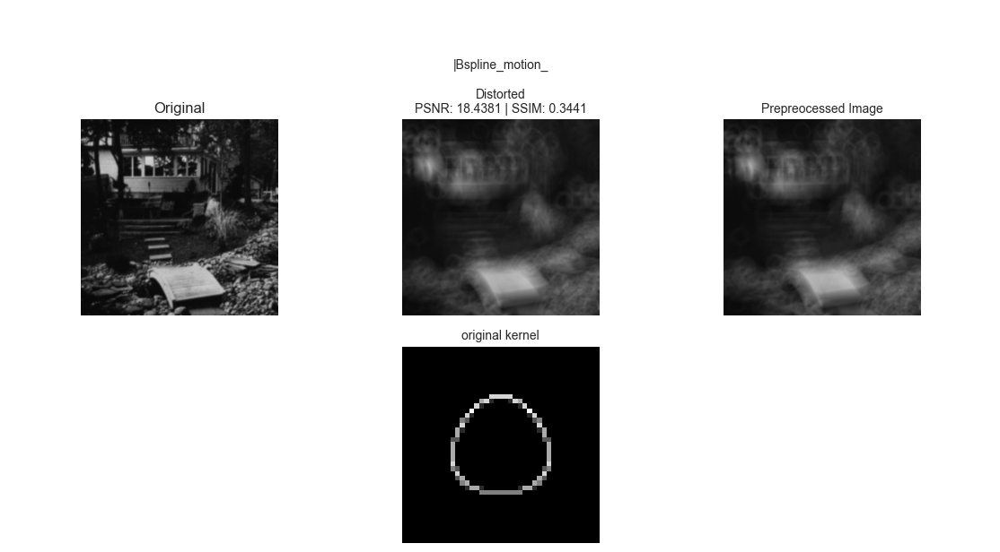

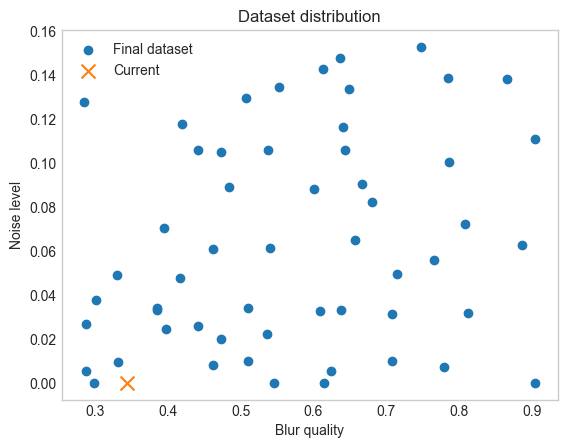

In [153]:
frame.changescale(False)

frame.read_one('bridge.png')


fl_gauss = GaussianNoise(5.0)
fl_pink = Pink_Noise(noise_level=0.01)
fl_brown = Brown_Noise(noise_level=0.02)
fl_poisson = PoissonNoise(param=0.35)
fl_defocus = DefocusBlur(gaussian_distribution, param=0.5,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,300])

fl = fl_bspline18
fl_noise = fl_gauss

frame.filter(fl)
# frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
# frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)

frame.clear_input()

In [154]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "small_egg"
noise = ""
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

# kernel = get_kernel_from_filter([fl])
# kernel_path = kernel_name + "_kernel.png"
# save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
# plot_heatmap(final_points)

Готово.


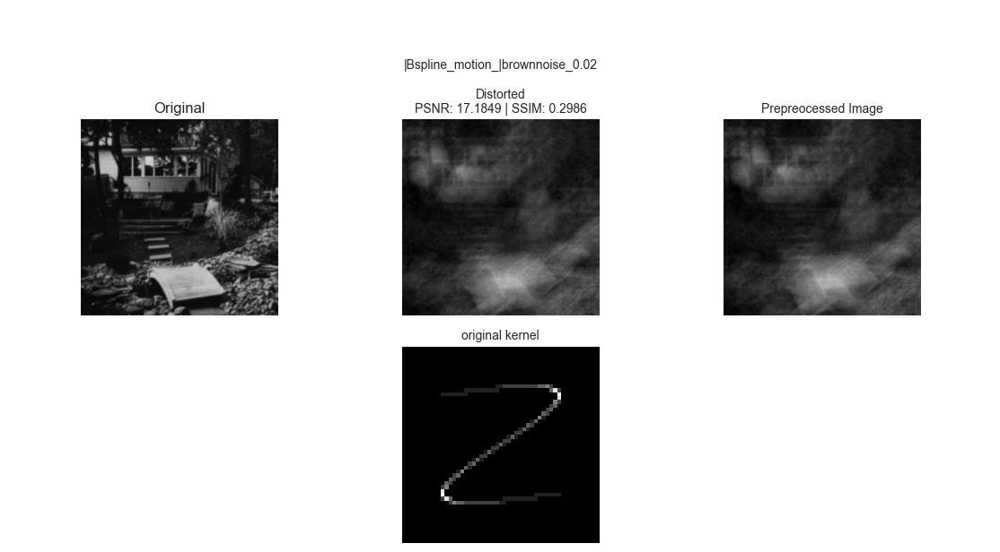

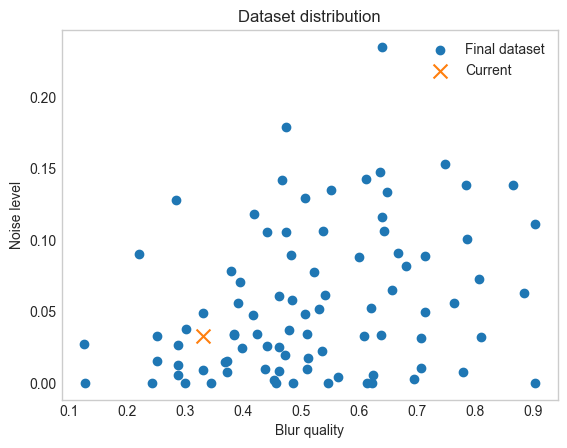

In [35]:
frame.changescale(False)

frame.read_one('bridge.png')


fl_gauss = GaussianNoise(5.0)
fl_pink = Pink_Noise(noise_level=0.01)
fl_brown = Brown_Noise(noise_level=0.02)
fl_poisson = PoissonNoise(param=0.35)
fl_defocus = DefocusBlur(gaussian_distribution, param=0.5,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,300])

fl = fl_bspline16
fl_noise = fl_brown

frame.filter(fl)
# frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)

frame.clear_input()

In [36]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "z_spiral"
noise = "brown"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

# kernel = get_kernel_from_filter([fl])
# kernel_path = kernel_name + "_kernel.png"
# save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
# plot_heatmap(final_points)

Готово.


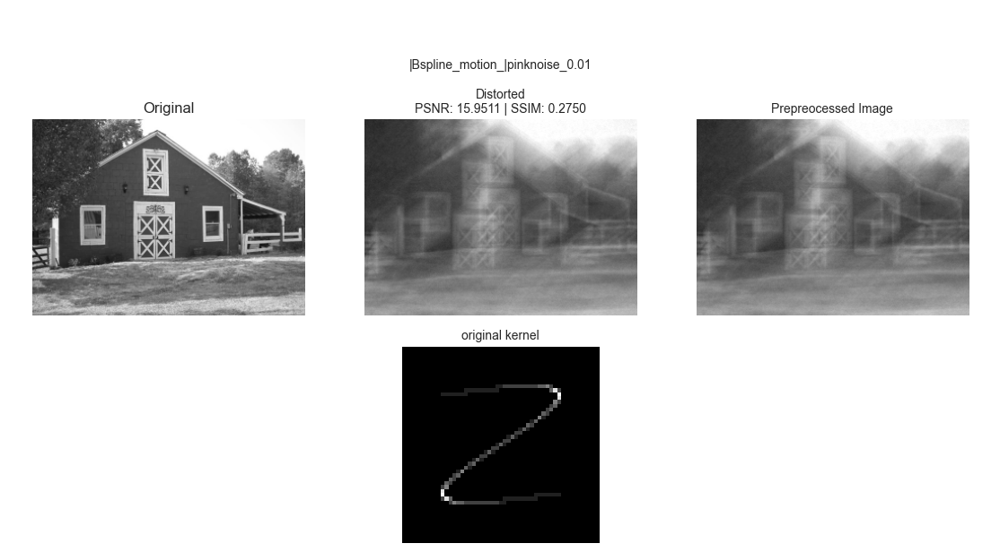

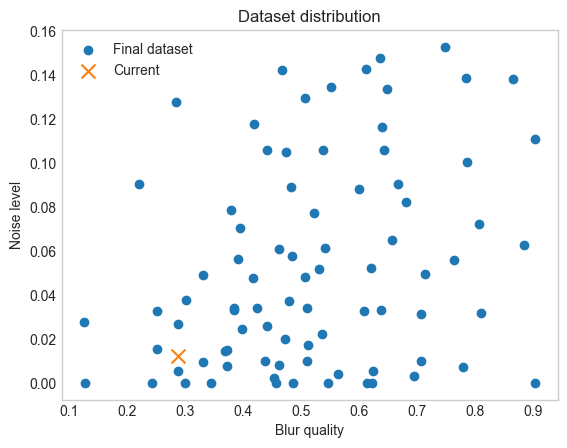

In [25]:
frame.changescale(False)

frame.read_one('barn.png')


fl_gauss = GaussianNoise(5.0)
fl_pink = Pink_Noise(noise_level=0.01)
fl_brown = Brown_Noise(noise_level=0.05)
fl_poisson = PoissonNoise(param=0.35)
fl_defocus = DefocusBlur(gaussian_distribution, param=0.5,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,300])

fl = fl_bspline16
fl_noise = fl_pink

frame.filter(fl)
# frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)

frame.clear_input()

In [26]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "z_spiral"
noise = "pink"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

# kernel = get_kernel_from_filter([fl])
# kernel_path = kernel_name + "_kernel.png"
# save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
# plot_heatmap(final_points)

Готово.


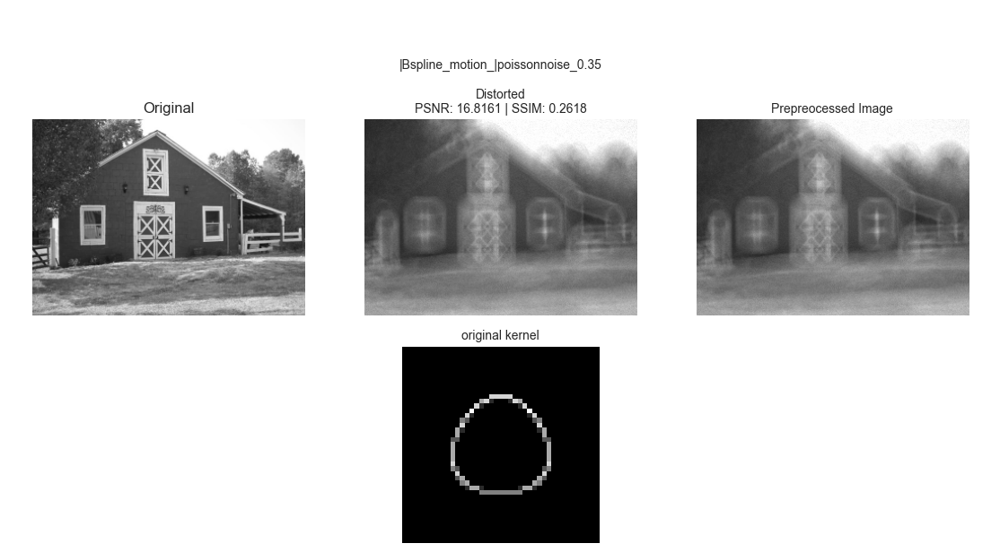

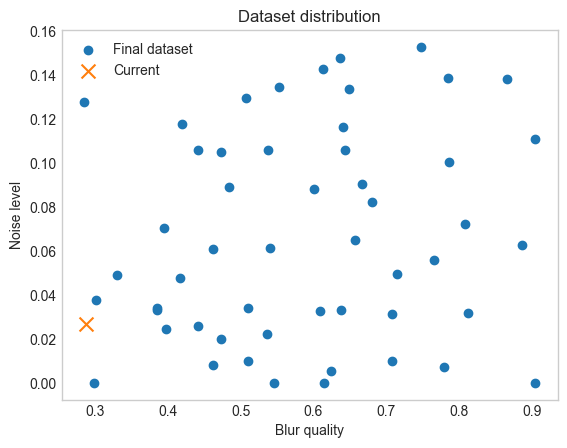

In [138]:
frame.changescale(False)

frame.read_one('barn.png')


fl_gauss = GaussianNoise(5.0)
fl_pink = Pink_Noise(noise_level=0.03)
fl_brown = Brown_Noise(noise_level=0.05)
fl_poisson = PoissonNoise(param=0.35)
fl_defocus = DefocusBlur(gaussian_distribution, param=0.5,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,300])

fl = fl_bspline18
fl_noise = fl_poisson

frame.filter(fl)
# frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)

frame.clear_input()

Готово.


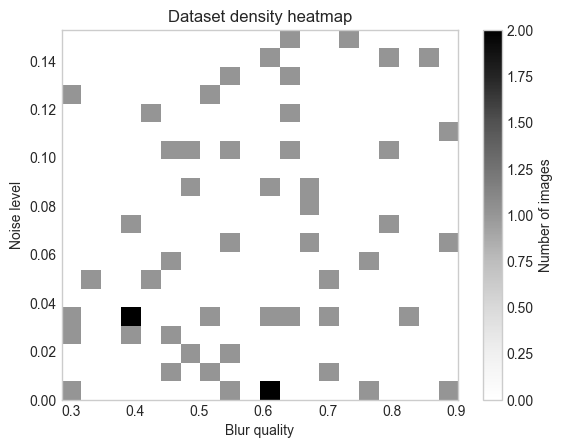

In [139]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "small_egg"
noise = "poisson"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

kernel = get_kernel_from_filter([fl])
kernel_path = kernel_name + "_kernel.png"
save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
plot_heatmap(final_points)

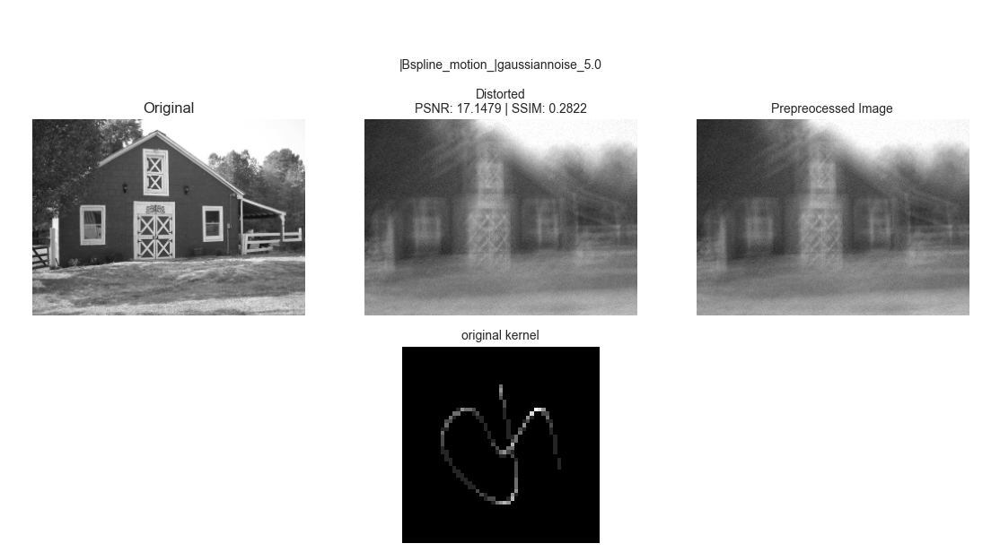

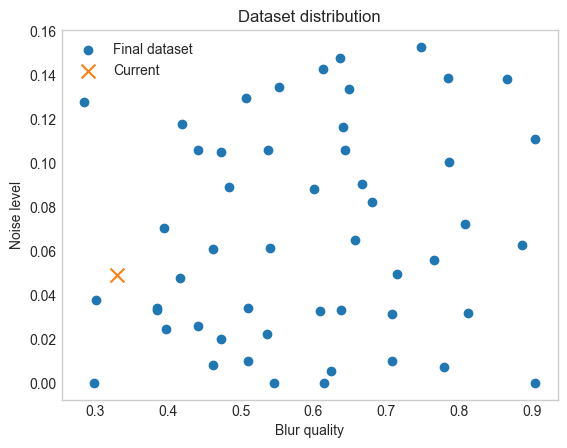

In [133]:
frame.changescale(False)

frame.read_one('barn.png')


fl_gauss = GaussianNoise(5.0)
fl_pink = Pink_Noise(noise_level=0.03)
fl_brown = Brown_Noise(noise_level=0.05)
fl_poisson = PoissonNoise(param=0.5)
fl_defocus = DefocusBlur(gaussian_distribution, param=0.5,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,300])

fl = fl_bspline3
fl_noise = fl_gauss

frame.filter(fl)
# frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)

frame.clear_input()

In [134]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "w_spiral"
noise = "gauss"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

# kernel = get_kernel_from_filter([fl])
# kernel_path = kernel_name + "_kernel.png"
# save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
# plot_heatmap(final_points)

Готово.


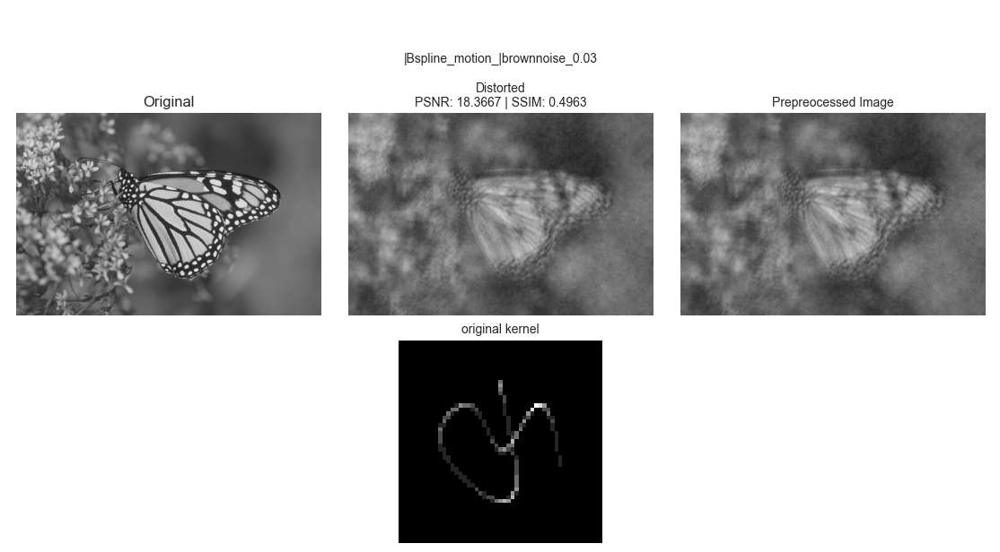

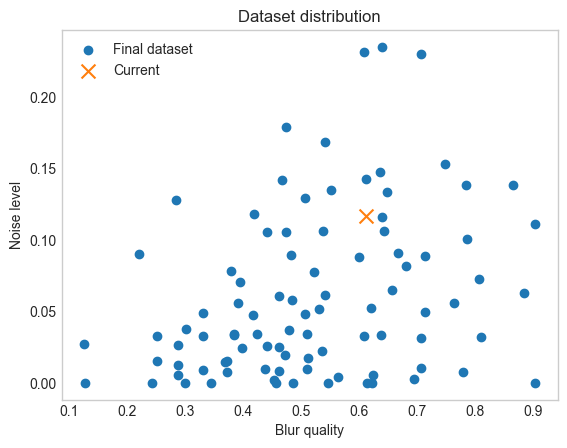

In [44]:
frame.changescale(False)
# frame.read_one('boy.png')
# frame.read_one('cameraman.png')
# frame.read_one('childs.png')
# frame.read_one('drawing.png')
# frame.read_one('airplane.png')
# frame.read_one('clock.png')
# frame.read_one('flags.png')
# frame.read_one('lenna.png')
frame.read_one('monarch.png')
# frame.read_one('street.png')
# frame.read_one('temple.png')

fl_gauss = GaussianNoise(5.0)
fl_pink = Pink_Noise(noise_level=0.03)
fl_brown = Brown_Noise(noise_level=0.03)
fl_poisson = PoissonNoise(param=0.5)
fl_defocus = DefocusBlur(gaussian_distribution, param=0.5,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,300])

fl = fl_bspline3
fl_noise = fl_brown

frame.filter(fl)
# frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)

frame.clear_input()

In [45]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "w_spiral"
noise = "brown"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

# kernel = get_kernel_from_filter([fl])
# kernel_path = kernel_name + "_kernel.png"
# save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
# plot_heatmap(final_points)

Готово.


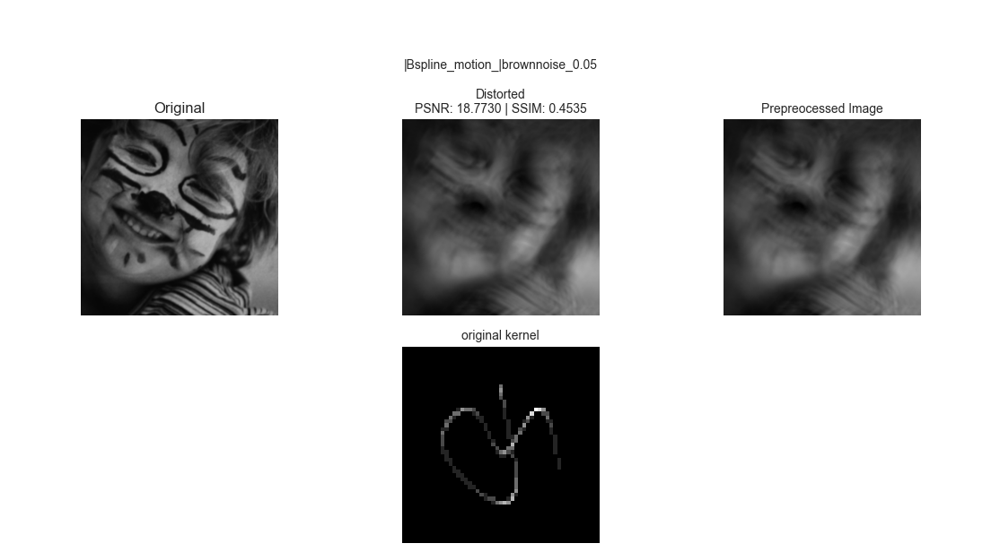

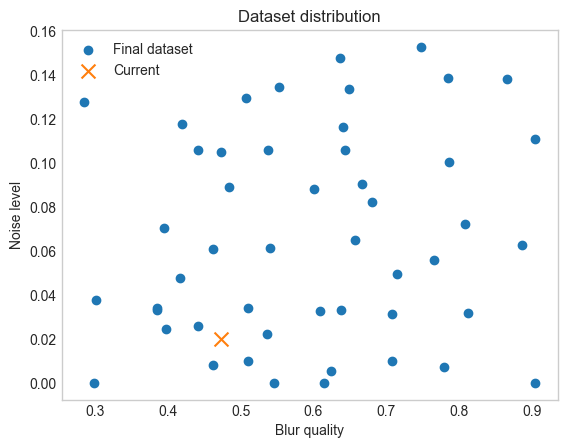

In [128]:
frame.changescale(False)
frame.read_one('boy.png')
# frame.read_one('cameraman.png')
# frame.read_one('childs.png')
# frame.read_one('drawing.png')
# frame.read_one('airplane.png')
# frame.read_one('clock.png')
# frame.read_one('flags.png')
# frame.read_one('lenna.png')
# frame.read_one('monarch.png')
# frame.read_one('street.png')
# frame.read_one('temple.png')

fl_gauss = GaussianNoise(10.0)
fl_pink = Pink_Noise(noise_level=0.03)
fl_brown = Brown_Noise(noise_level=0.05)
fl_poisson = PoissonNoise(param=0.5)
fl_defocus = DefocusBlur(gaussian_distribution, param=0.5,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,300])

fl = fl_bspline3
fl_noise = fl_brown

frame.filter(fl)
# frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)

frame.clear_input()

In [129]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "w_spiral"
noise = "brown"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

# kernel = get_kernel_from_filter([fl])
# kernel_path = kernel_name + "_kernel.png"
# save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
# plot_heatmap(final_points)

Готово.


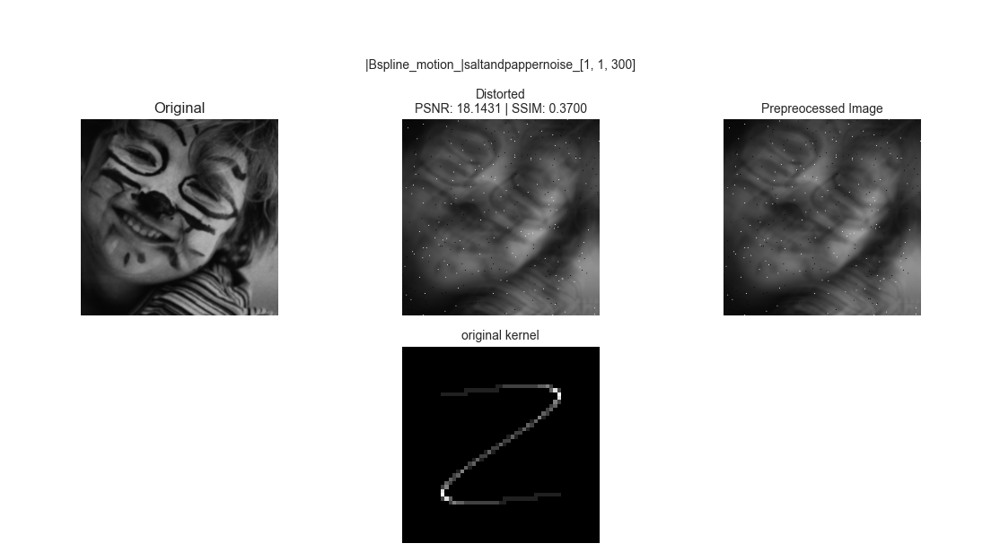

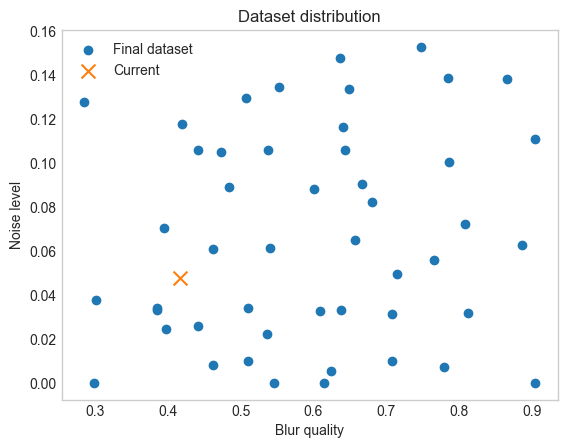

In [125]:
frame.changescale(False)
frame.read_one('boy.png')
# frame.read_one('cameraman.png')
# frame.read_one('childs.png')
# frame.read_one('drawing.png')
# frame.read_one('airplane.png')
# frame.read_one('clock.png')
# frame.read_one('flags.png')
# frame.read_one('lenna.png')
# frame.read_one('monarch.png')
# frame.read_one('street.png')
# frame.read_one('temple.png')

fl_gauss = GaussianNoise(10.0)
fl_pink = Pink_Noise(noise_level=0.03)
fl_brown = Brown_Noise(noise_level=0.05)
fl_poisson = PoissonNoise(param=0.5)
fl_defocus = DefocusBlur(gaussian_distribution, param=0.5,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,300])

fl = fl_bspline16
fl_noise = fl_impulse

frame.filter(fl)
# frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)

frame.clear_input()

In [126]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "z_spiral"
noise = "impulse"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

# kernel = get_kernel_from_filter([fl])
# kernel_path = kernel_name + "_kernel.png"
# save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
# plot_heatmap(final_points)

Готово.


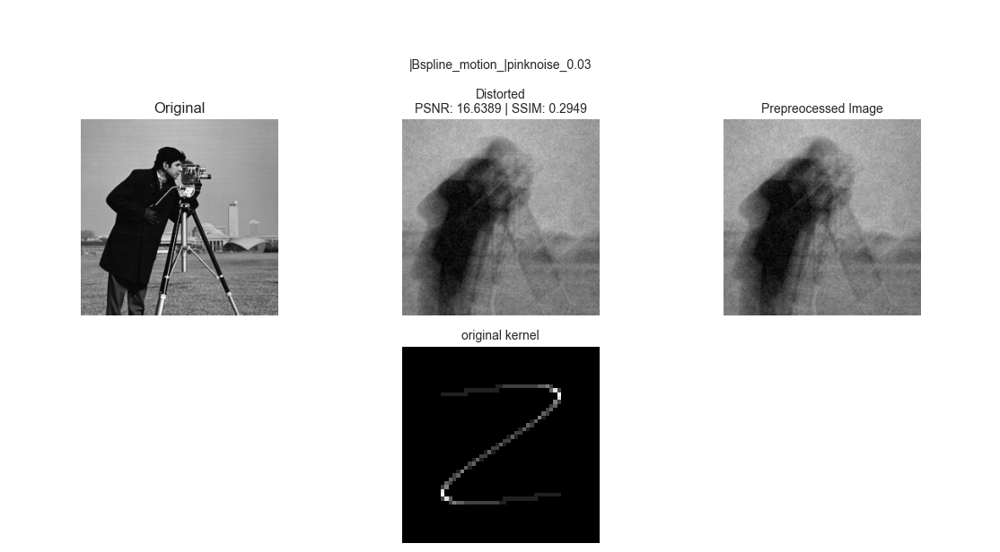

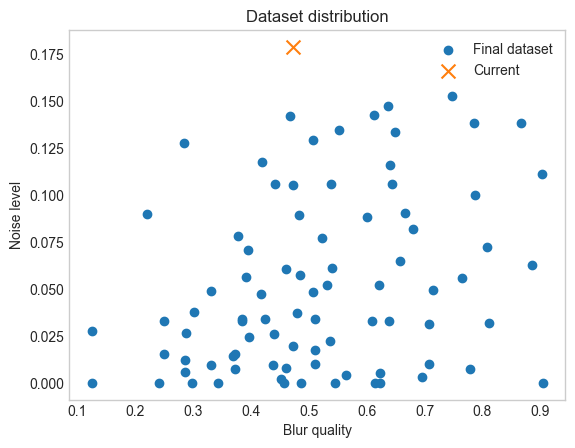

In [27]:
frame.changescale(False)
# frame.read_one('boy.png')
frame.read_one('cameraman.png')
# frame.read_one('childs.png')
# frame.read_one('drawing.png')
# frame.read_one('airplane.png')
# frame.read_one('clock.png')
# frame.read_one('flags.png')
# frame.read_one('lenna.png')
# frame.read_one('monarch.png')
# frame.read_one('street.png')
# frame.read_one('temple.png')

fl_gauss = GaussianNoise(10.0)
fl_pink = Pink_Noise(noise_level=0.03)
fl_brown = Brown_Noise(noise_level=0.05)
fl_poisson = PoissonNoise(param=0.5)
fl_defocus = DefocusBlur(gaussian_distribution, param=0.5,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,600])

fl = fl_bspline16
fl_noise = fl_pink

frame.filter(fl)
# frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)

frame.clear_input()

In [28]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "z_spiral"
noise = "pink"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

# kernel = get_kernel_from_filter([fl])
# kernel_path = kernel_name + "_kernel.png"
# save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
# plot_heatmap(final_points)

Готово.


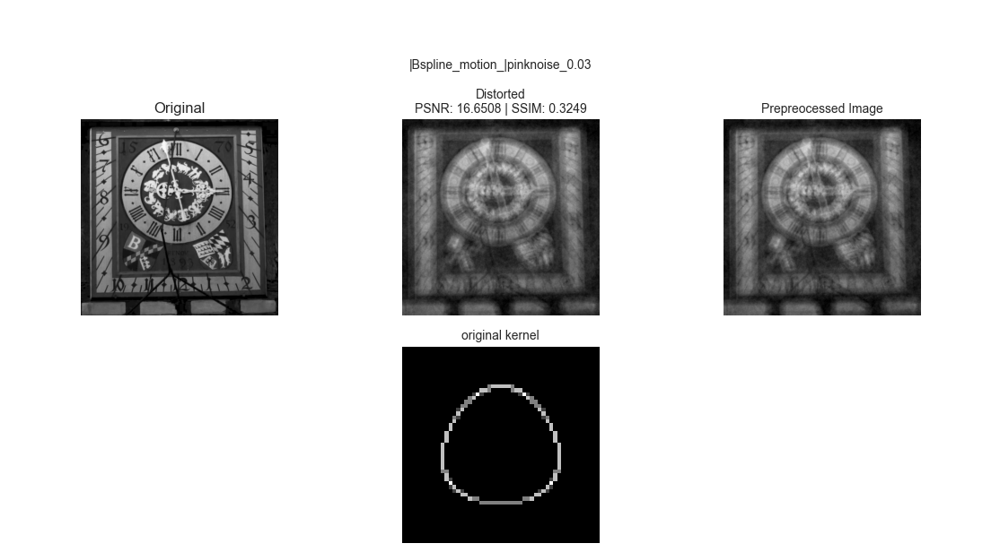

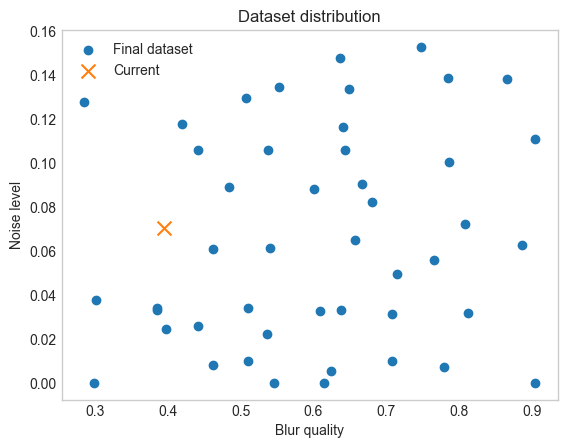

In [119]:
frame.changescale(False)
# frame.read_one('boy.png')
# frame.read_one('cameraman.png')
# frame.read_one('childs.png')
# frame.read_one('drawing.png')
# frame.read_one('airplane.png')
frame.read_one('clock.png')
# frame.read_one('flags.png')
# frame.read_one('lenna.png')
# frame.read_one('monarch.png')
# frame.read_one('street.png')
# frame.read_one('temple.png')

fl_gauss = GaussianNoise(10.0)
fl_pink = Pink_Noise(noise_level=0.03)
fl_brown = Brown_Noise(noise_level=0.05)
fl_poisson = PoissonNoise(param=0.5)
fl_defocus = DefocusBlur(gaussian_distribution, param=0.5,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,600])

fl = fl_bspline17
fl_noise = fl_pink

frame.filter(fl)
# frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)


frame.clear_input()

In [120]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "egg"
noise = "pink"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

# kernel = get_kernel_from_filter([fl])
# kernel_path = kernel_name + "_kernel.png"
# save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
# plot_heatmap(final_points)

Готово.


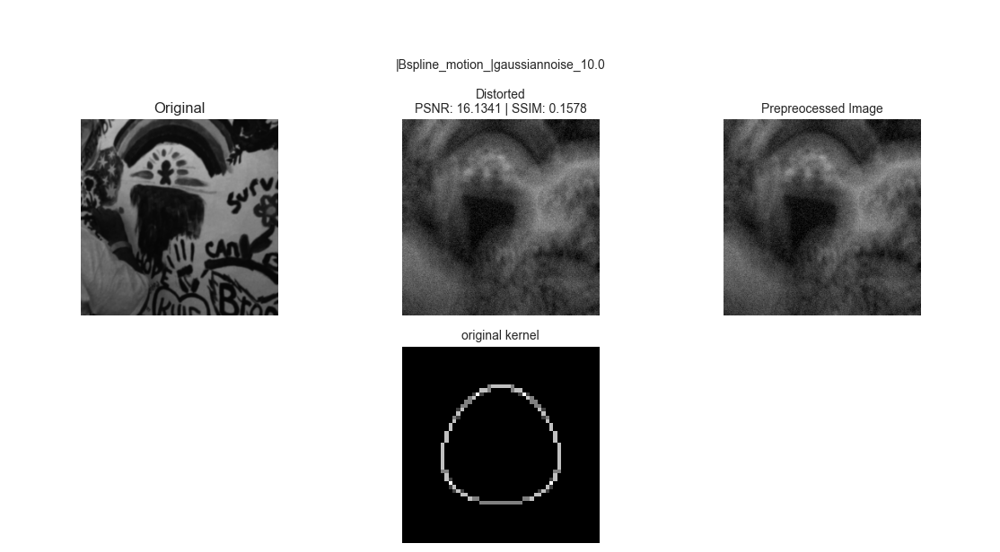

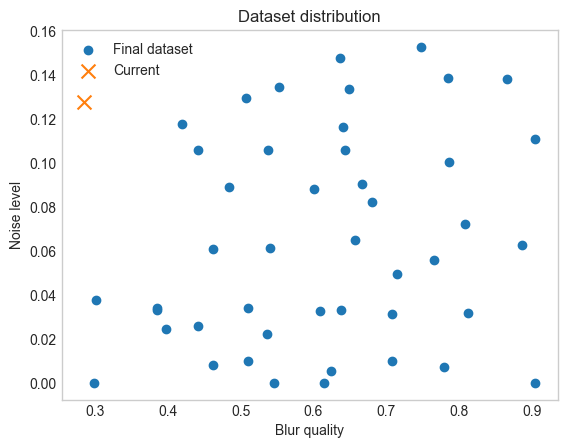

In [115]:
frame.changescale(False)
# frame.read_one('boy.png')
# frame.read_one('cameraman.png')
# frame.read_one('childs.png')
frame.read_one('drawing.png')
# frame.read_one('airplane.png')
# frame.read_one('clock.png')
# frame.read_one('flags.png')
# frame.read_one('lenna.png')
# frame.read_one('monarch.png')
# frame.read_one('street.png')
# frame.read_one('temple.png')

fl_gauss = GaussianNoise(10.0)
fl_pink = Pink_Noise(noise_level=0.03)
fl_brown = Brown_Noise(noise_level=0.05)
fl_poisson = PoissonNoise(param=0.5)
fl_defocus = DefocusBlur(gaussian_distribution, param=0.5,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,600])

fl = fl_bspline17
fl_noise = fl_gauss

frame.filter(fl)
# frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)


frame.clear_input()

In [116]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "egg"
noise = "gauss"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

# kernel = get_kernel_from_filter([fl])
# kernel_path = kernel_name + "_kernel.png"
# save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
# plot_heatmap(final_points)

Готово.


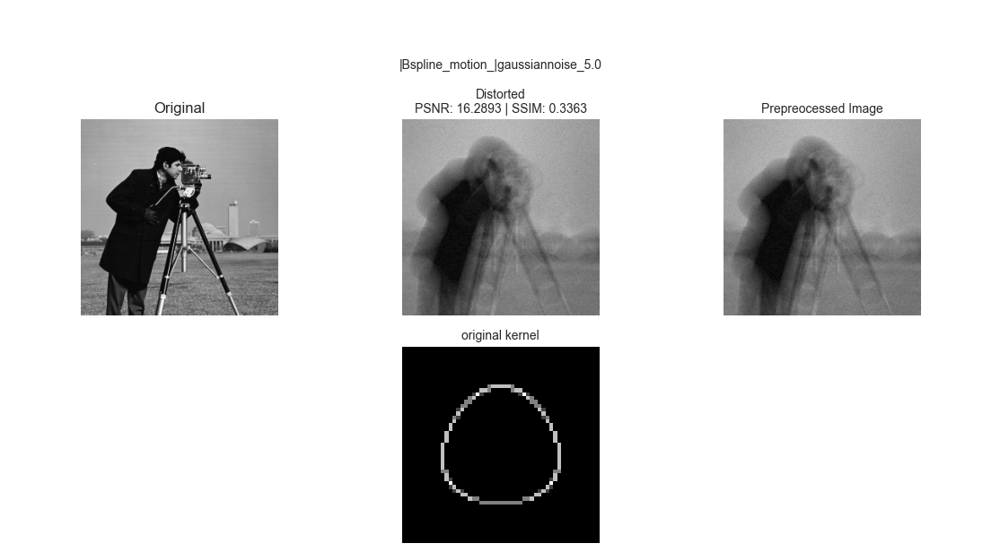

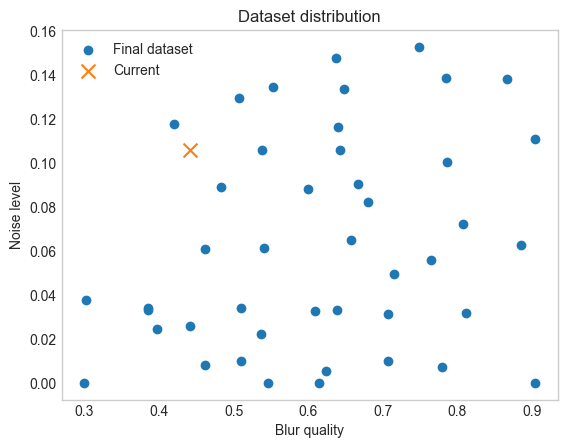

In [111]:
frame.changescale(False)
# frame.read_one('boy.png')
frame.read_one('cameraman.png')
# frame.read_one('childs.png')
# frame.read_one('drawing.png')
# frame.read_one('airplane.png')
# frame.read_one('clock.png')
# frame.read_one('flags.png')
# frame.read_one('lenna.png')
# frame.read_one('monarch.png')
# frame.read_one('street.png')
# frame.read_one('temple.png')

fl_gauss = GaussianNoise(5.0)
fl_pink = Pink_Noise(noise_level=0.03)
fl_brown = Brown_Noise(noise_level=0.05)
fl_poisson = PoissonNoise(param=0.5)
fl_defocus = DefocusBlur(gaussian_distribution, param=0.5,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,600])

fl = fl_bspline17
fl_noise = fl_gauss

frame.filter(fl)
# frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)


frame.clear_input()

Готово.


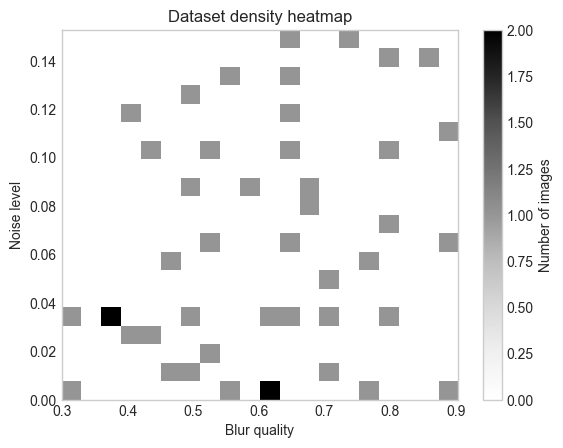

In [112]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "egg"
noise = "gauss"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

kernel = get_kernel_from_filter([fl])
kernel_path = kernel_name + "_kernel.png"
save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
plot_heatmap(final_points)

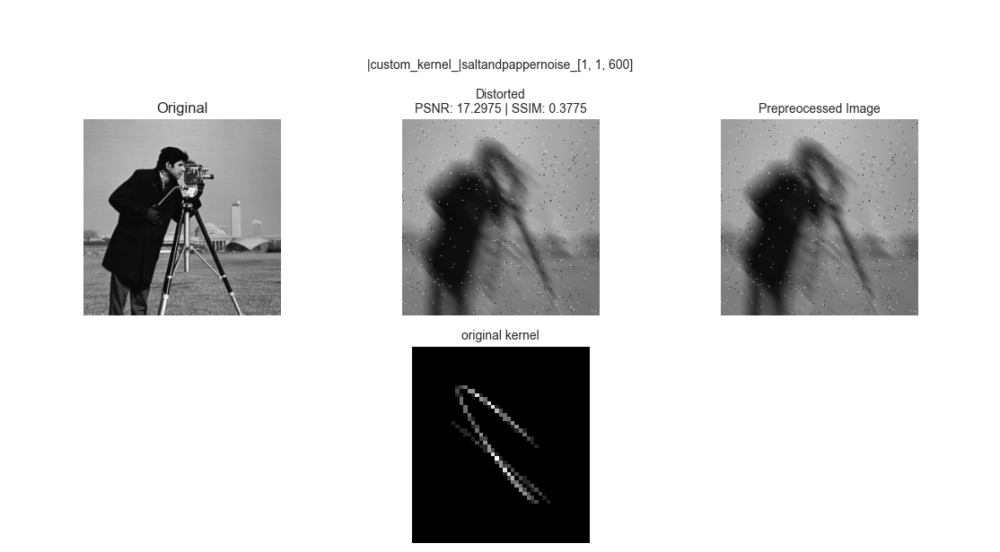

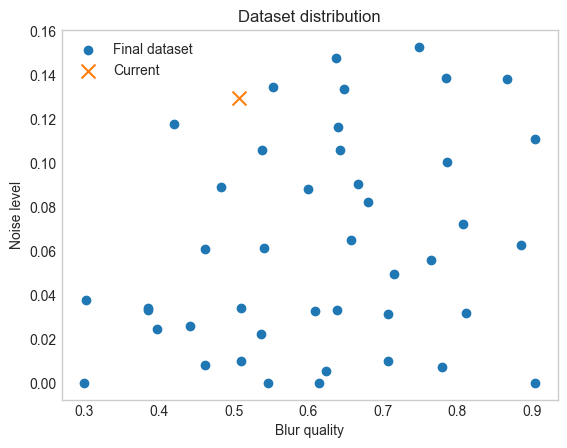

In [102]:
frame.changescale(False)
# frame.read_one('boy.png')
frame.read_one('cameraman.png')
# frame.read_one('childs.png')
# frame.read_one('drawing.png')
# frame.read_one('airplane.png')
# frame.read_one('clock.png')
# frame.read_one('flags.png')
# frame.read_one('lenna.png')
# frame.read_one('monarch.png')
# frame.read_one('street.png')
# frame.read_one('temple.png')

fl_gauss = GaussianNoise(5.0)
fl_pink = Pink_Noise(noise_level=0.03)
fl_brown = Brown_Noise(noise_level=0.05)
fl_poisson = PoissonNoise(param=0.5)
fl_defocus = DefocusBlur(gaussian_distribution, param=0.5,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,600])

fl = fl_custom2
fl_noise = fl_impulse

frame.filter(fl)
# frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)


frame.clear_input()

In [103]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "heliod"
noise = "impulse"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

# kernel = get_kernel_from_filter([fl])
# kernel_path = kernel_name + "_kernel.png"
# save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
# plot_heatmap(final_points)

Готово.


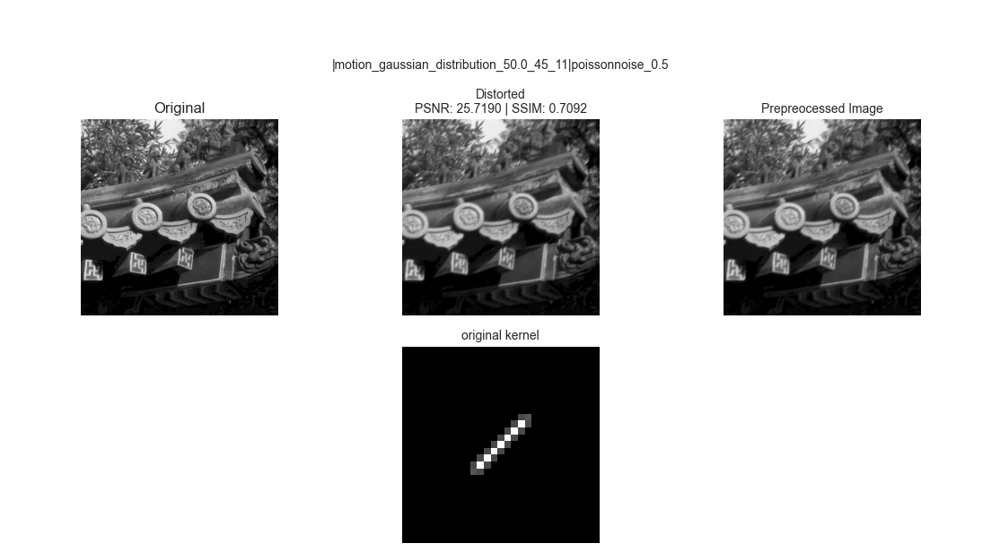

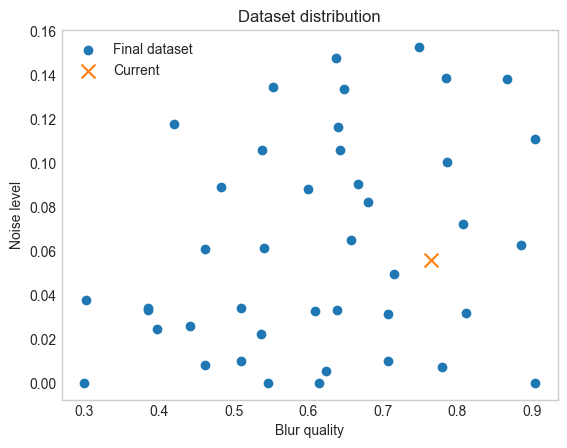

In [87]:
frame.changescale(False)
# frame.read_one('boy.png')
# frame.read_one('cameraman.png')
# frame.read_one('childs.png')
# frame.read_one('drawing.png')
# frame.read_one('airplane.png')
# frame.read_one('clock.png')
# frame.read_one('flags.png')
# frame.read_one('lenna.png')
# frame.read_one('monarch.png')
# frame.read_one('street.png')
frame.read_one('temple.png')

fl_gauss = GaussianNoise(5.0)
fl_pink = Pink_Noise(noise_level=0.03)
fl_brown = Brown_Noise(noise_level=0.05)
fl_poisson = PoissonNoise(param=0.5)
fl_defocus = DefocusBlur(gaussian_distribution, param=0.5,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,4000])

fl = fl_motion
fl_noise = fl_poisson

frame.filter(fl)
# frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)


frame.clear_input()

In [88]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "thick_motion"
noise = "poisson"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

# kernel = get_kernel_from_filter([fl])
# kernel_path = kernel_name + "_kernel.png"
# save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
# plot_heatmap(final_points)

Готово.


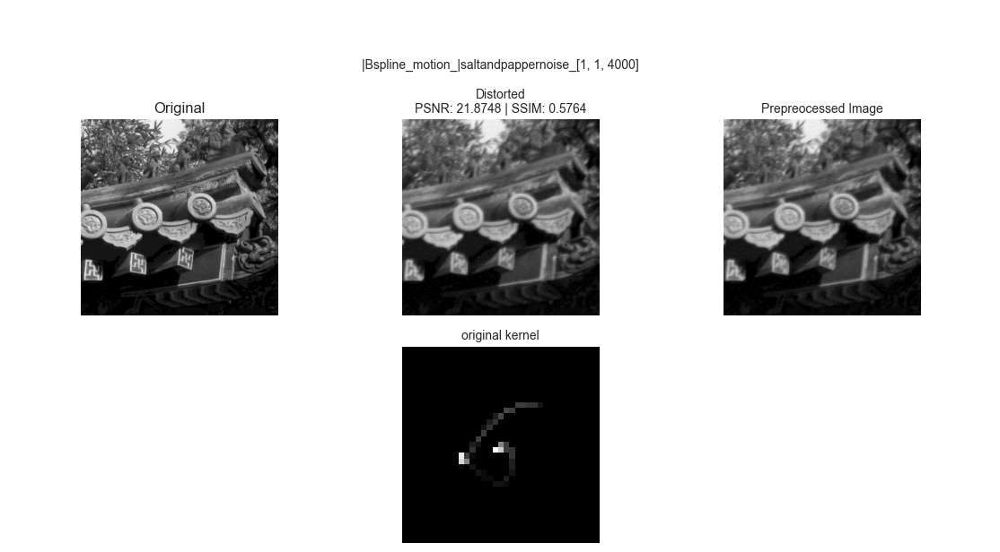

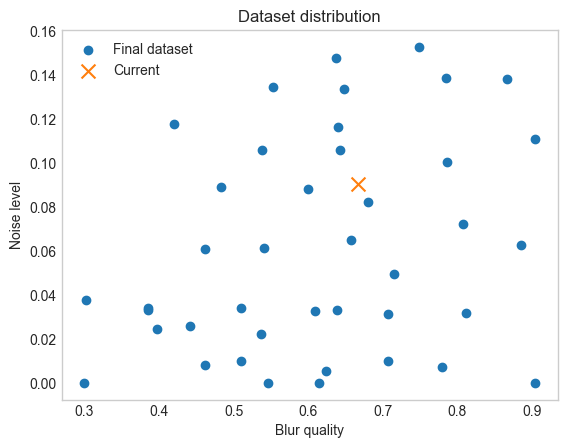

In [82]:
frame.changescale(False)
# frame.read_one('boy.png')
# frame.read_one('cameraman.png')
# frame.read_one('childs.png')
# frame.read_one('drawing.png')
# frame.read_one('airplane.png')
# frame.read_one('clock.png')
# frame.read_one('flags.png')
# frame.read_one('lenna.png')
# frame.read_one('monarch.png')
# frame.read_one('street.png')
frame.read_one('temple.png')

fl_gauss = GaussianNoise(5.0)
fl_pink = Pink_Noise(noise_level=0.03)
fl_brown = Brown_Noise(noise_level=0.05)
fl_poisson = PoissonNoise(param=0.5)
fl_defocus = DefocusBlur(gaussian_distribution, param=0.5,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,4000])

fl = fl_bspline10
fl_noise = fl_impulse

frame.filter(fl)
# frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)


frame.clear_input()

In [83]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "sigma"
noise = "impulse"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

# kernel = get_kernel_from_filter([fl])
# kernel_path = kernel_name + "_kernel.png"
# save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
# plot_heatmap(final_points)

Готово.


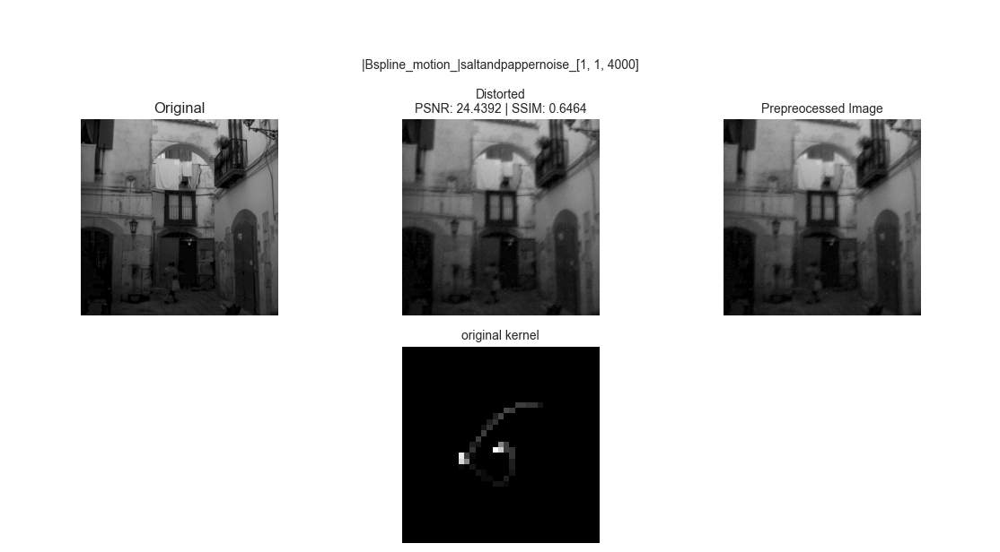

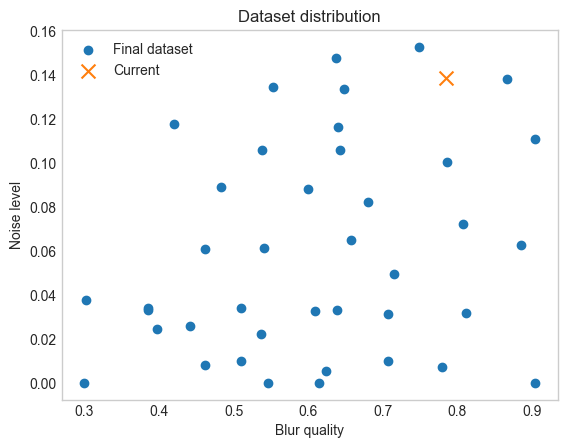

In [80]:
frame.changescale(False)
# frame.read_one('boy.png')
# frame.read_one('cameraman.png')
# frame.read_one('childs.png')
# frame.read_one('drawing.png')
# frame.read_one('airplane.png')
# frame.read_one('clock.png')
# frame.read_one('flags.png')
# frame.read_one('lenna.png')
# frame.read_one('monarch.png')
frame.read_one('street.png')
# frame.read_one('temple.png')

fl_gauss = GaussianNoise(5.0)
fl_pink = Pink_Noise(noise_level=0.03)
fl_brown = Brown_Noise(noise_level=0.05)
fl_poisson = PoissonNoise(param=0.5)
fl_defocus = DefocusBlur(gaussian_distribution, param=0.5,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,4000])

fl = fl_bspline10
fl_noise = fl_impulse

frame.filter(fl)
# frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)


frame.clear_input()

Готово.


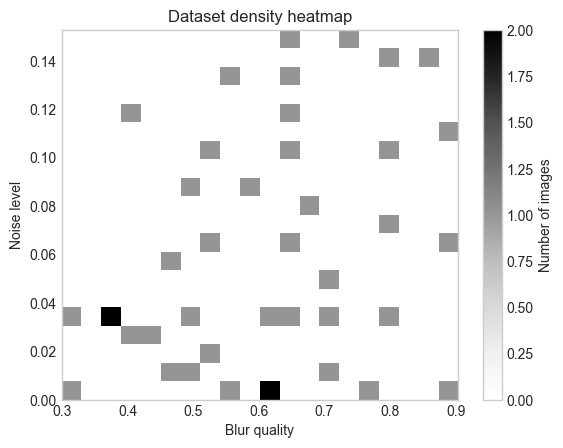

In [81]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "sigma"
noise = "impulse"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

kernel = get_kernel_from_filter([fl])
kernel_path = kernel_name + "_kernel.png"
save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
plot_heatmap(final_points)

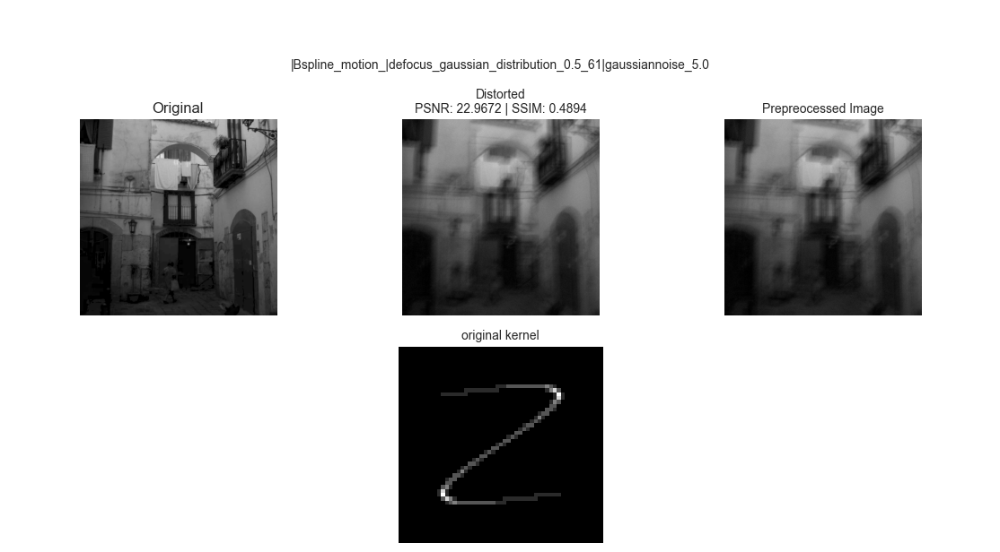

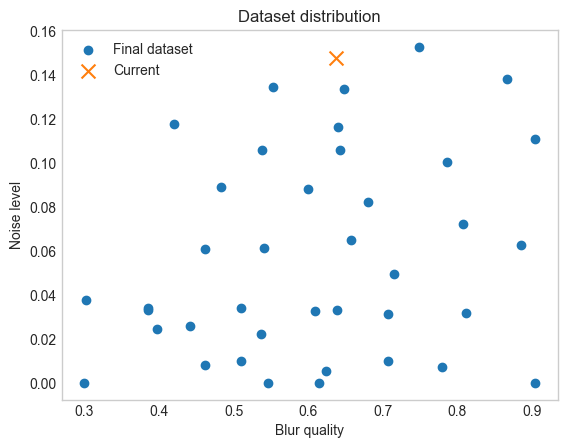

In [74]:
frame.changescale(False)
# frame.read_one('boy.png')
# frame.read_one('cameraman.png')
# frame.read_one('childs.png')
# frame.read_one('drawing.png')
# frame.read_one('airplane.png')
# frame.read_one('clock.png')
# frame.read_one('flags.png')
# frame.read_one('lenna.png')
# frame.read_one('monarch.png')
frame.read_one('street.png')
# frame.read_one('temple.png')

fl_gauss = GaussianNoise(5.0)
fl_pink = Pink_Noise(noise_level=0.03)
fl_brown = Brown_Noise(noise_level=0.05)
fl_poisson = PoissonNoise(param=0.5)
fl_defocus = DefocusBlur(gaussian_distribution, param=0.5,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,500])

fl = fl_bspline16
fl_noise = fl_gauss

frame.filter(fl)
frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)


frame.clear_input()

Готово.


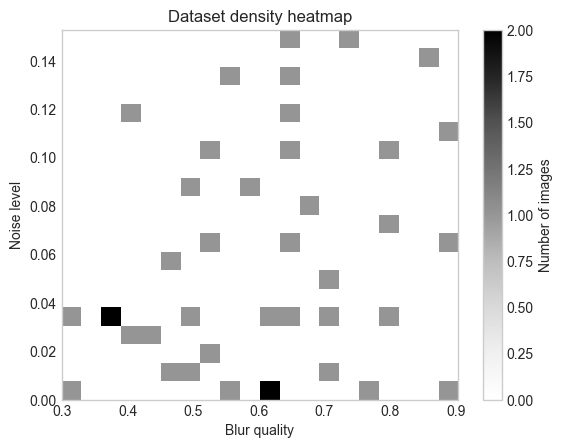

In [75]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "z_spiral"
noise = "gauss"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

kernel = get_kernel_from_filter([fl, fl_defocus])
kernel_path = kernel_name + "_kernel.png"
save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
plot_heatmap(final_points)

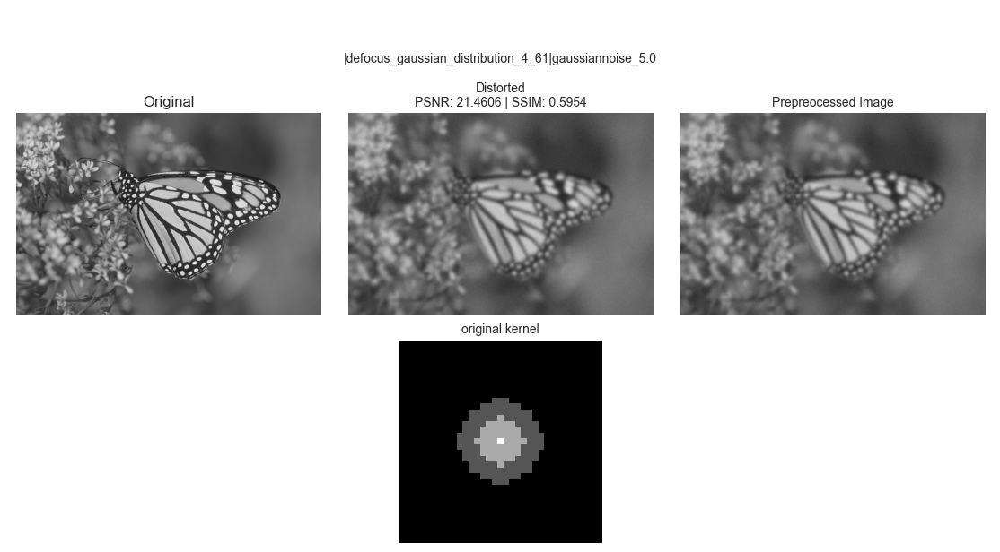

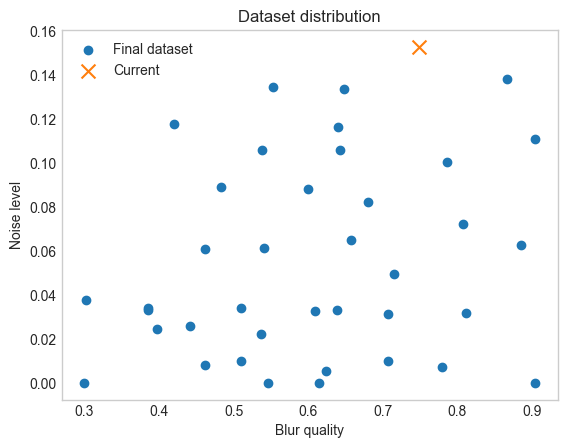

In [63]:
frame.changescale(False)
# frame.read_one('boy.png')
# frame.read_one('cameraman.png')
# frame.read_one('childs.png')
# frame.read_one('drawing.png')
# frame.read_one('airplane.png')
# frame.read_one('clock.png')
# frame.read_one('flags.png')
# frame.read_one('lenna.png')
frame.read_one('monarch.png')
# frame.read_one('street.png')
# frame.read_one('temple.png')

fl_gauss = GaussianNoise(5.0)
fl_pink = Pink_Noise(noise_level=0.03)
fl_brown = Brown_Noise(noise_level=0.05)
fl_poisson = PoissonNoise(param=0.5)
fl_defocus = DefocusBlur(gaussian_distribution, param=4,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,500])

fl = fl_defocus
fl_noise = fl_gauss

frame.filter(fl)
# frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)


frame.clear_input()

Готово.


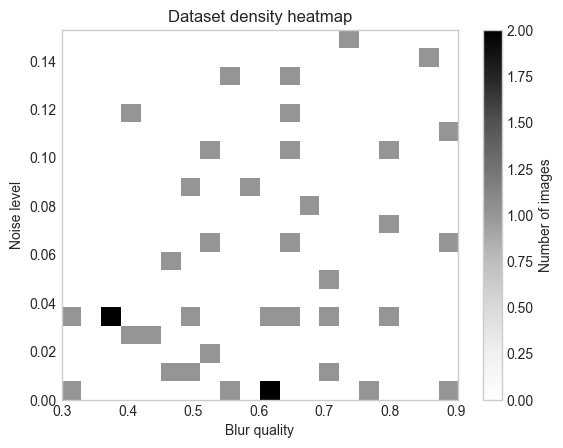

In [ ]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "big_defocus"
noise = "gauss"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

kernel = get_kernel_from_filter([fl])
# kernel_path = kernel_name + "_kernel.png"
# save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
# plot_heatmap(final_points)

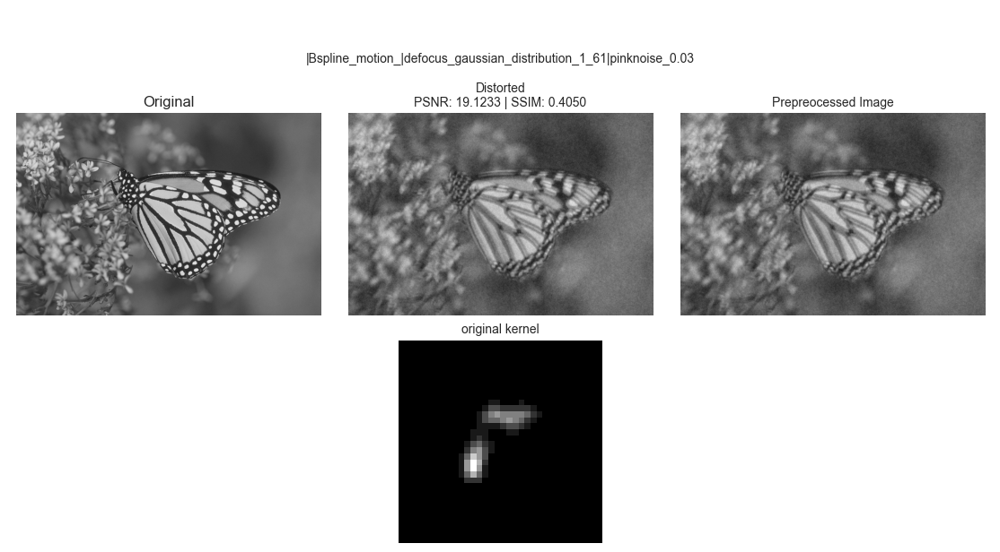

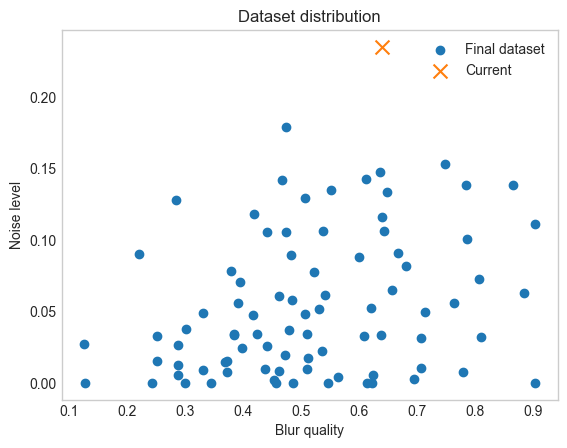

In [29]:
frame.changescale(False)
# frame.read_one('boy.png')
# frame.read_one('cameraman.png')
# frame.read_one('childs.png')
# frame.read_one('drawing.png')
# frame.read_one('airplane.png')
# frame.read_one('clock.png')
# frame.read_one('flags.png')
# frame.read_one('lenna.png')
frame.read_one('monarch.png')
# frame.read_one('street.png')
# frame.read_one('temple.png')

fl_gauss = GaussianNoise(3.5)
fl_pink = Pink_Noise(noise_level=0.03)
fl_brown = Brown_Noise(noise_level=0.05)
fl_poisson = PoissonNoise(param=0.5)
fl_defocus = DefocusBlur(gaussian_distribution, param=1,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,500])

fl = fl_bspline15
fl_noise = fl_pink

frame.filter(fl)
frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)


frame.clear_input()

Готово.


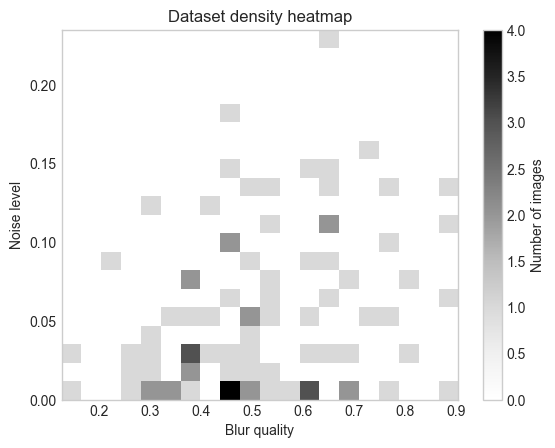

In [30]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "small_pacman"
noise = "pink"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

kernel = get_kernel_from_filter([fl])
kernel_path = kernel_name + "_kernel.png"
save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
plot_heatmap(final_points)

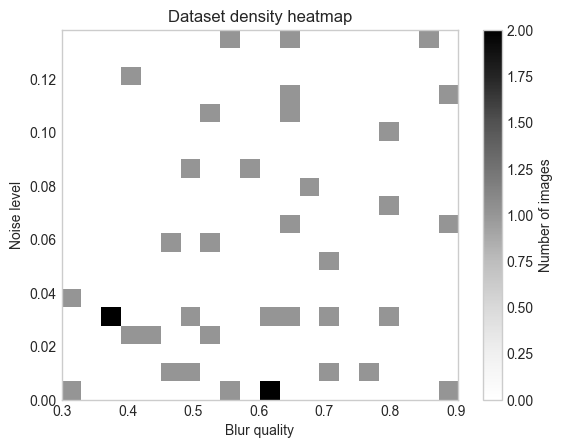

In [58]:
kernel = get_kernel_from_filter([fl, fl_defocus])
kernel_path = kernel_name + "_kernel.png"
save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
plot_heatmap(final_points)

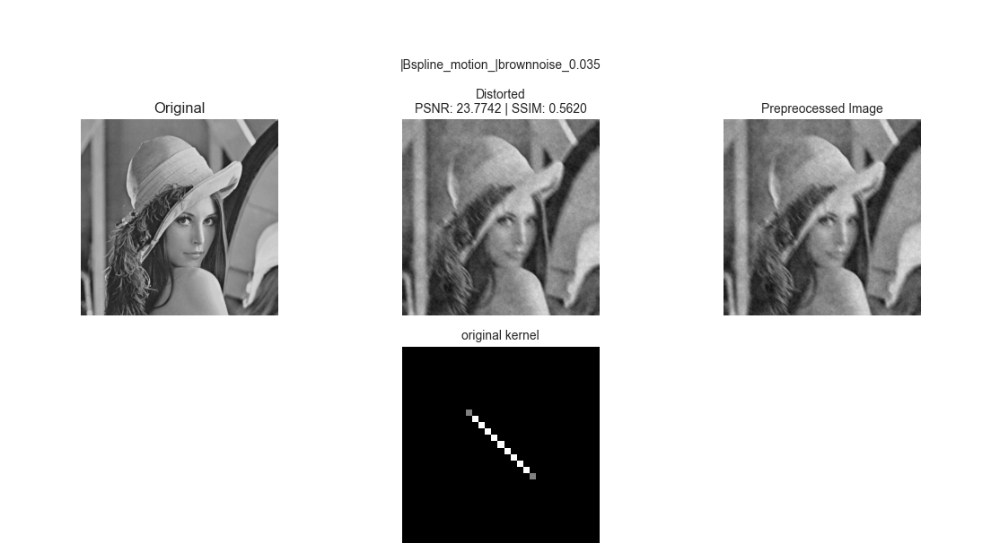

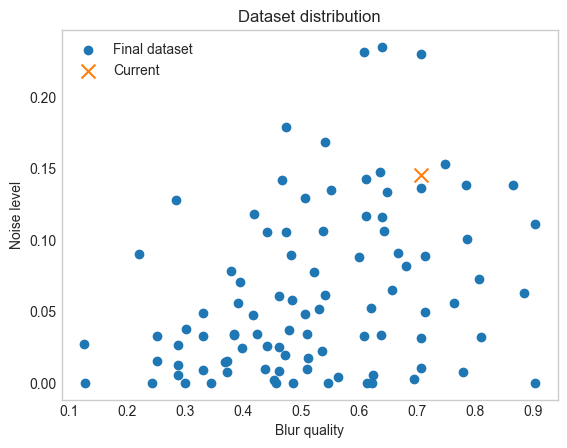

In [49]:
frame.changescale(False)
# frame.read_one('boy.png')
# frame.read_one('cameraman.png')
# frame.read_one('childs.png')
# frame.read_one('drawing.png')
# frame.read_one('airplane.png')
# frame.read_one('clock.png')
# frame.read_one('flags.png')
frame.read_one('lenna.png')
# frame.read_one('monarch.png')
# frame.read_one('street.png')
# frame.read_one('temple.png')

fl_gauss = GaussianNoise(3.5)
fl_pink = Pink_Noise(noise_level=0.04)
fl_brown = Brown_Noise(noise_level=0.035)
fl_poisson = PoissonNoise(param=0.5)
fl_defocus = DefocusBlur(gaussian_distribution, param=2,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,500])

fl = fl_bspline12
fl_noise = fl_brown

frame.filter(fl)
# frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)


frame.clear_input()

In [50]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "linear"
noise = "brown"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

kernel = get_kernel_from_filter([fl])
# kernel_path = kernel_name + "_kernel.png"
# save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
# plot_heatmap(final_points)

Готово.


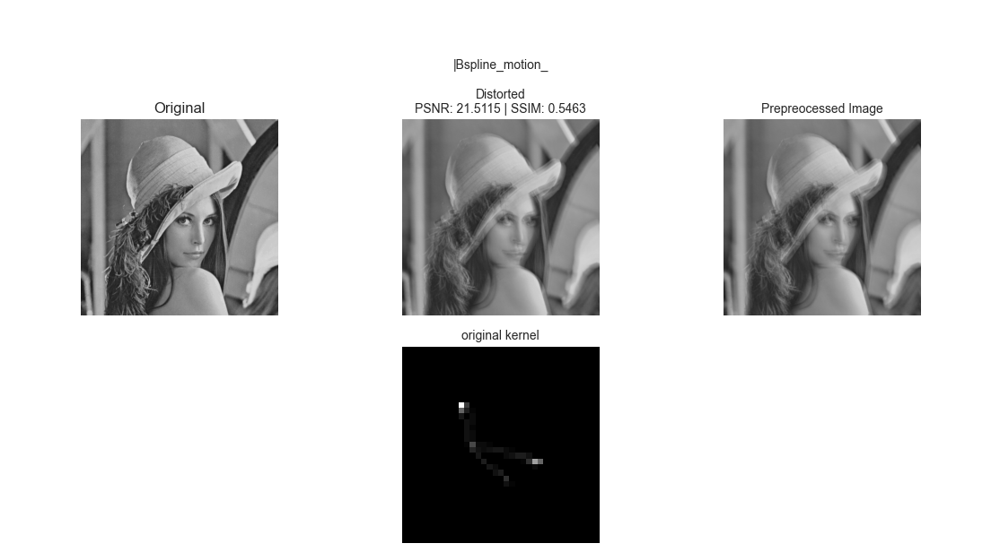

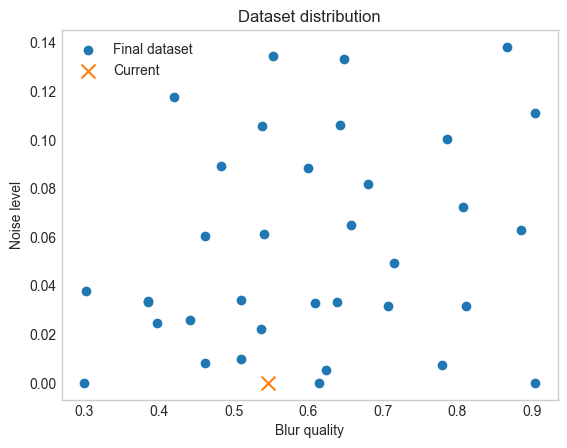

In [47]:
frame.changescale(False)
# frame.read_one('boy.png')
# frame.read_one('cameraman.png')
# frame.read_one('childs.png')
# frame.read_one('drawing.png')
# frame.read_one('airplane.png')
# frame.read_one('clock.png')
# frame.read_one('flags.png')
frame.read_one('lenna.png')
# frame.read_one('monarch.png')
# frame.read_one('street.png')
# frame.read_one('temple.png')

fl_gauss = GaussianNoise(3.5)
fl_pink = Pink_Noise(noise_level=0.04)
fl_brown = Brown_Noise(noise_level=0.05)
fl_poisson = PoissonNoise(param=0.5)
fl_defocus = DefocusBlur(gaussian_distribution, param=2,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,500])

fl = fl_bspline9
fl_noise = fl_brown

frame.filter(fl)
# frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
# frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)


frame.clear_input()

In [48]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "dendric"
noise = ""
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

kernel = get_kernel_from_filter([fl])
# kernel_path = kernel_name + "_kernel.png"
# save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
# plot_heatmap(final_points)

Готово.


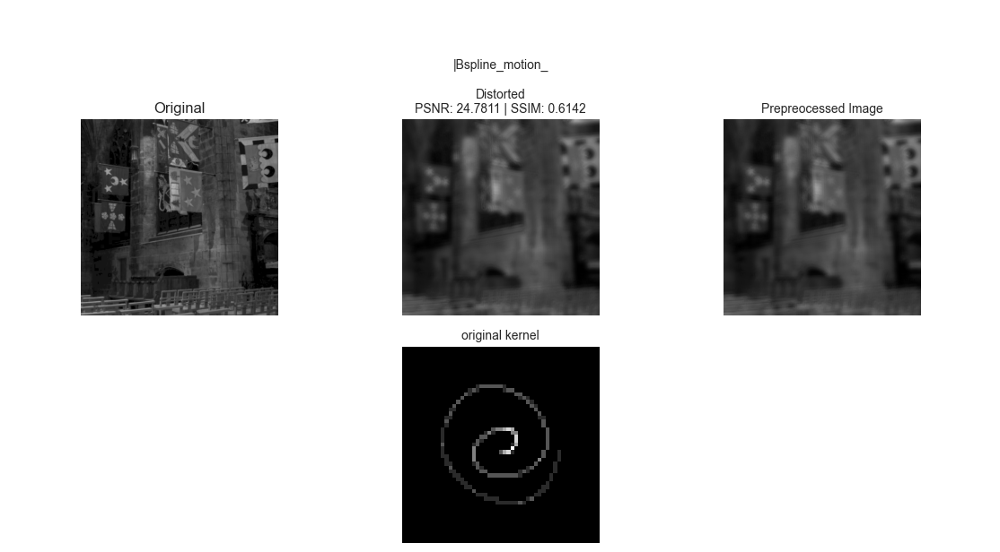

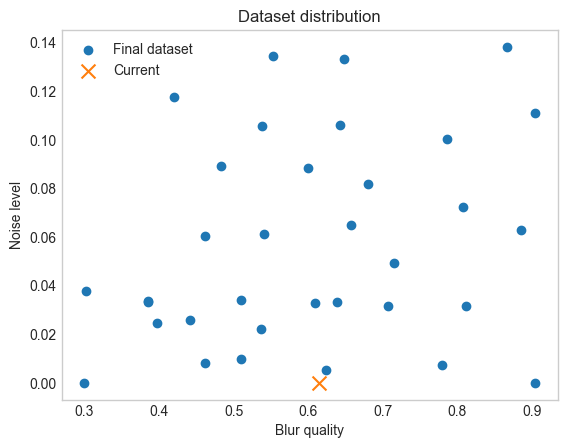

In [43]:
frame.changescale(False)
# frame.read_one('boy.png')
# frame.read_one('cameraman.png')
# frame.read_one('childs.png')
# frame.read_one('drawing.png')
# frame.read_one('airplane.png')
# frame.read_one('clock.png')
frame.read_one('flags.png')
# frame.read_one('lenna.png')
# frame.read_one('monarch.png')
# frame.read_one('street.png')
# frame.read_one('temple.png')

fl_gauss = GaussianNoise(3.5)
fl_pink = Pink_Noise(noise_level=0.04)
fl_brown = Brown_Noise(noise_level=0.05)
fl_poisson = PoissonNoise(param=0.5)
fl_defocus = DefocusBlur(gaussian_distribution, param=2,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,500])

fl = fl_bspline7
fl_noise = fl_brown

frame.filter(fl)
# frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
# frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)


frame.clear_input()

In [ ]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "big_spiral"
noise = ""
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

kernel = get_kernel_from_filter([fl])
# kernel_path = kernel_name + "_kernel.png"
# save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
# plot_heatmap(final_points)

Готово.


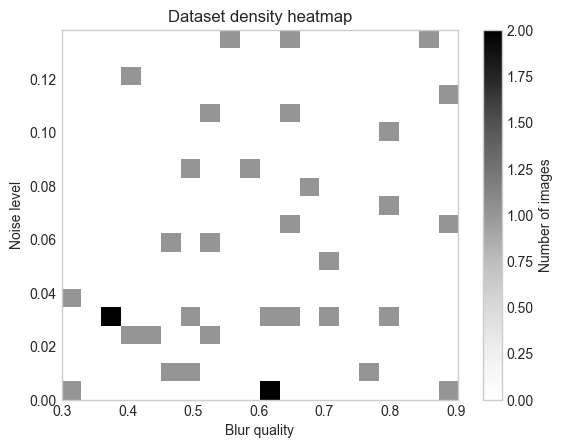

In [45]:
kernel_path = kernel_name + "_kernel.png"
save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
plot_heatmap(final_points)

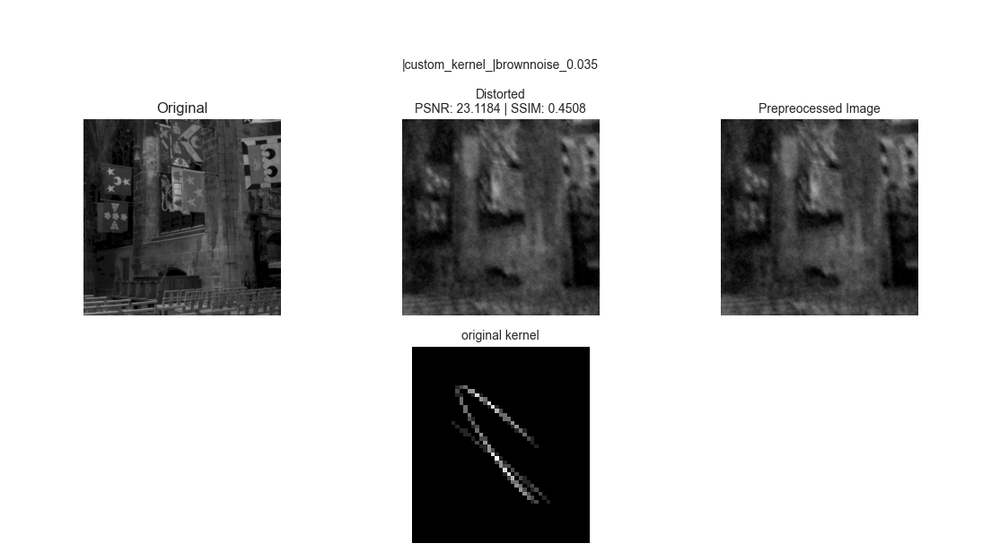

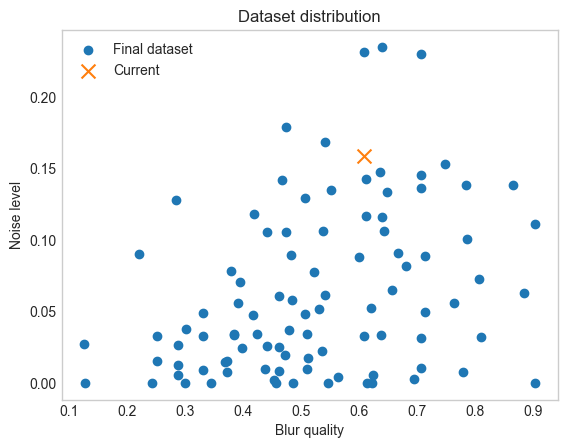

In [51]:
frame.changescale(False)
# frame.read_one('boy.png')
# frame.read_one('cameraman.png')
# frame.read_one('childs.png')
# frame.read_one('drawing.png')
# frame.read_one('airplane.png')
# frame.read_one('clock.png')
frame.read_one('flags.png')
# frame.read_one('lenna.png')
# frame.read_one('monarch.png')
# frame.read_one('street.png')
# frame.read_one('temple.png')

fl_gauss = GaussianNoise(3.5)
fl_pink = Pink_Noise(noise_level=0.04)
fl_brown = Brown_Noise(noise_level=0.035)
fl_poisson = PoissonNoise(param=0.5)
fl_defocus = DefocusBlur(gaussian_distribution, param=2,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,500])

fl = fl_custom2
fl_noise = fl_brown

frame.filter(fl)
# frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)


frame.clear_input()

In [52]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "heliod"
noise = "brown"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

kernel = get_kernel_from_filter([fl])
kernel_path = kernel_name + "_kernel.png"
# save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
# plot_heatmap(final_points)

Готово.


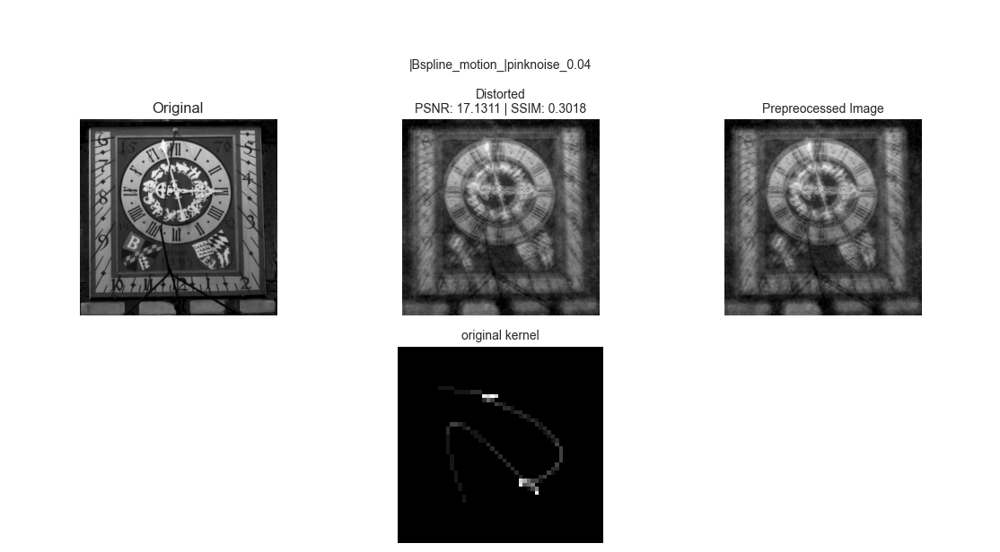

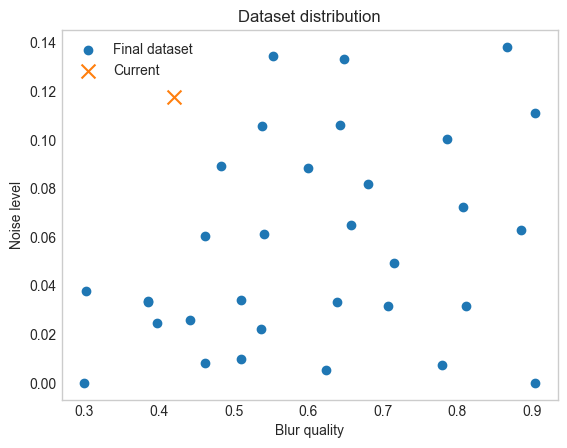

In [32]:
frame.changescale(False)
# frame.read_one('boy.png')
# frame.read_one('cameraman.png')
# frame.read_one('childs.png')
# frame.read_one('drawing.png')
# frame.read_one('airplane.png')
frame.read_one('clock.png')
# frame.read_one('flags.png')
# frame.read_one('lenna.png')
# frame.read_one('monarch.png')
# frame.read_one('street.png')
# frame.read_one('temple.png')

fl_gauss = GaussianNoise(3.5)
fl_pink = Pink_Noise(noise_level=0.04)
fl_brown = Brown_Noise(noise_level=0.05)
fl_poisson = PoissonNoise(param=0.5)
fl_defocus = DefocusBlur(gaussian_distribution, param=2,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,500])

fl = fl_bspline5
fl_noise = fl_pink

frame.filter(fl)
# frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)


frame.clear_input()

In [33]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "s_spiral"
noise = "pink"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

kernel = get_kernel_from_filter([fl])
kernel_path = kernel_name + "_kernel.png"
# save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
# plot_heatmap(final_points)

Готово.


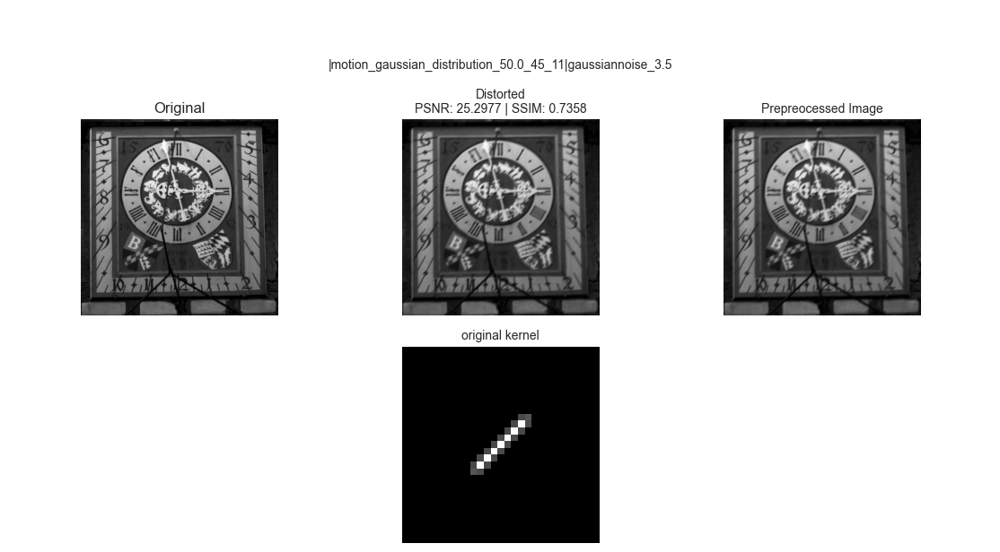

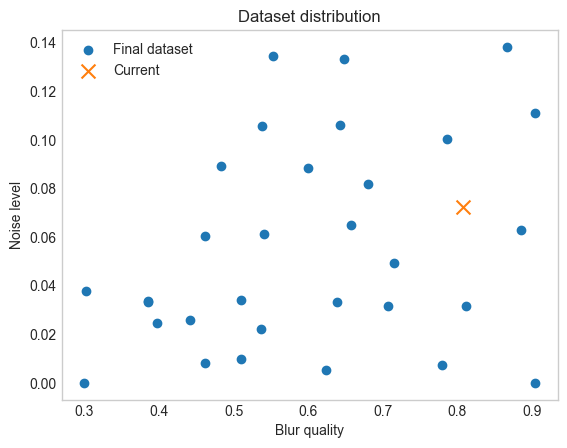

In [27]:
frame.changescale(False)
# frame.read_one('boy.png')
# frame.read_one('cameraman.png')
# frame.read_one('childs.png')
# frame.read_one('drawing.png')
# frame.read_one('airplane.png')
frame.read_one('clock.png')
# frame.read_one('flags.png')
# frame.read_one('lenna.png')
# frame.read_one('monarch.png')
# frame.read_one('street.png')
# frame.read_one('temple.png')

fl_gauss = GaussianNoise(3.5)
fl_pink = Pink_Noise(noise_level=0.01)
fl_brown = Brown_Noise(noise_level=0.05)
fl_poisson = PoissonNoise(param=0.5)
fl_defocus = DefocusBlur(gaussian_distribution, param=2,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,500])

fl = fl_motion
fl_noise = fl_gauss

frame.filter(fl)
# frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)


frame.clear_input()

In [28]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "thick_motion"
noise = "gauss"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

kernel = get_kernel_from_filter([fl])
kernel_path = kernel_name + "_kernel.png"
# save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
# plot_heatmap(final_points)

Готово.


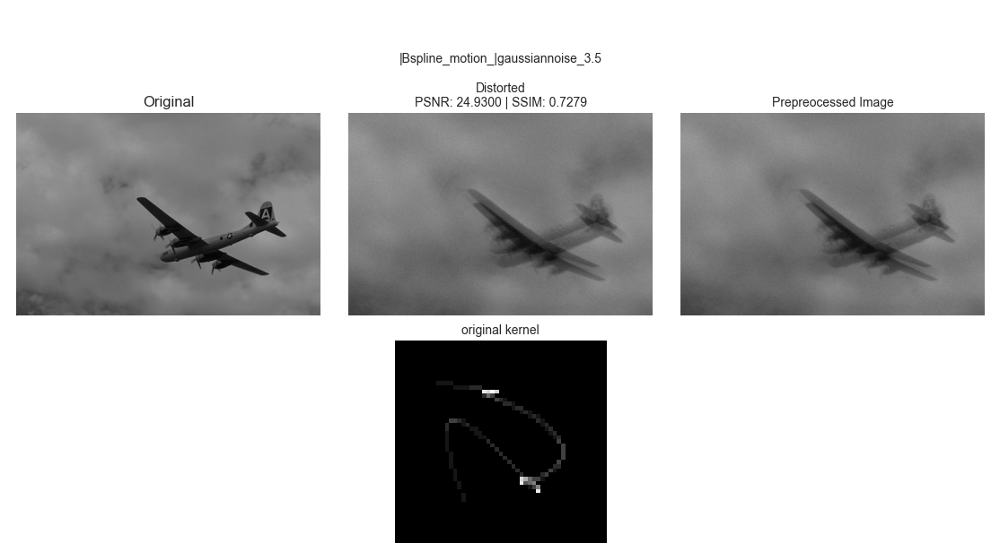

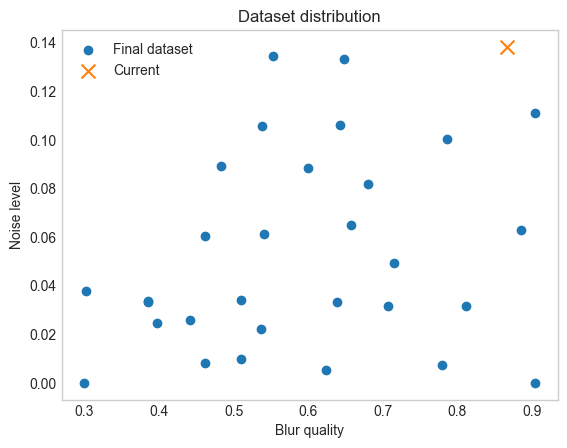

In [19]:
frame.changescale(False)
# frame.read_one('boy.png')
# frame.read_one('cameraman.png')
# frame.read_one('childs.png')
# frame.read_one('drawing.png')
frame.read_one('airplane.png')
# frame.read_one('clock.png')
# frame.read_one('flags.png')
# frame.read_one('lenna.png')
# frame.read_one('monarch.png')
# frame.read_one('street.png')
# frame.read_one('temple.png')

fl_gauss = GaussianNoise(3.5)
fl_pink = Pink_Noise(noise_level=0.01)
fl_brown = Brown_Noise(noise_level=0.05)
fl_poisson = PoissonNoise(param=0.5)
fl_defocus = DefocusBlur(gaussian_distribution, param=2.5,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,500])

fl = fl_bspline5
fl_noise = fl_gauss

frame.filter(fl)
# frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)


frame.clear_input()

In [20]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "s_spiral"
noise = "gauss"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

kernel = get_kernel_from_filter([fl])
kernel_path = kernel_name + "_kernel.png"
# save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
# plot_heatmap(final_points)

Готово.


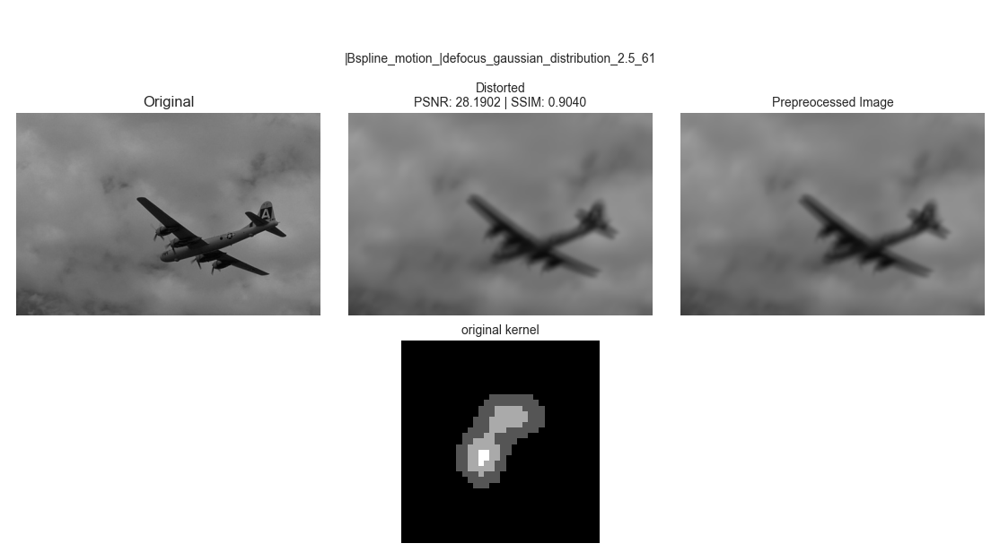

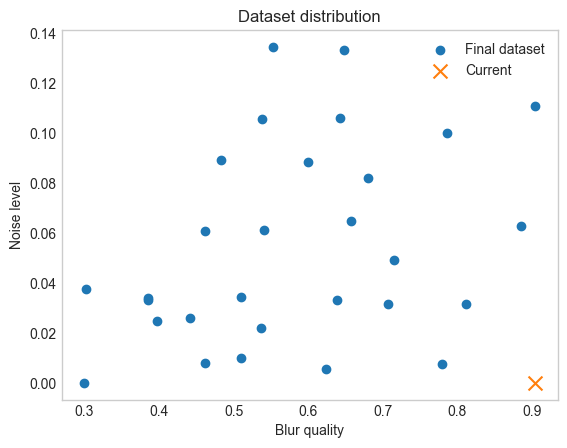

In [158]:
frame.changescale(False)
# frame.read_one('boy.png')
# frame.read_one('cameraman.png')
# frame.read_one('childs.png')
# frame.read_one('drawing.png')
frame.read_one('airplane.png')
# frame.read_one('clock.png')
# frame.read_one('flags.png')
# frame.read_one('lenna.png')
# frame.read_one('monarch.png')
# frame.read_one('street.png')
# frame.read_one('temple.png')

fl_gauss = GaussianNoise(4.5)
fl_pink = Pink_Noise(noise_level=0.01)
fl_brown = Brown_Noise(noise_level=0.05)
fl_poisson = PoissonNoise(param=0.5)
fl_defocus = DefocusBlur(gaussian_distribution, param=2.5,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,500])

fl = fl_bspline15
fl_noise = fl_gauss

frame.filter(fl)
frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
# frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)


frame.clear_input()

In [159]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "pacman"
noise = ""
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

kernel = get_kernel_from_filter([fl])
kernel_path = kernel_name + "_kernel.png"
# save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
# plot_heatmap(final_points)

Готово.


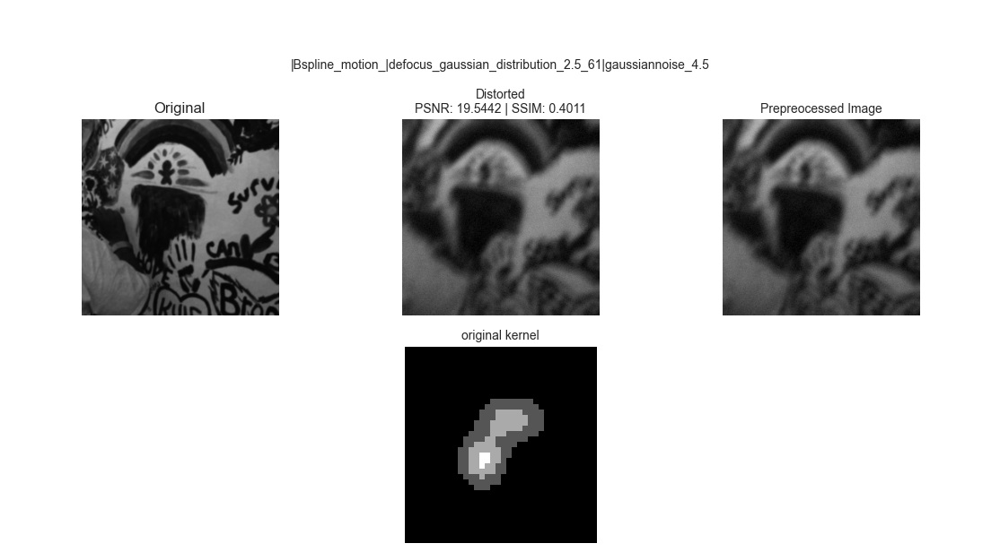

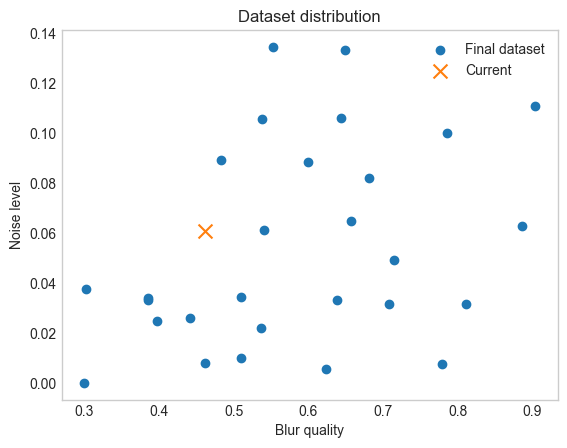

In [155]:
frame.changescale(False)
# frame.read_one('boy.png')
# frame.read_one('cameraman.png')
# frame.read_one('childs.png')
frame.read_one('drawing.png')
# frame.read_one('airplane.png')
# frame.read_one('clock.png')
# frame.read_one('flags.png')
# frame.read_one('lenna.png')
# frame.read_one('monarch.png')
# frame.read_one('street.png')
# frame.read_one('temple.png')

fl_gauss = GaussianNoise(4.5)
fl_pink = Pink_Noise(noise_level=0.01)
fl_brown = Brown_Noise(noise_level=0.05)
fl_poisson = PoissonNoise(param=0.5)
fl_defocus = DefocusBlur(gaussian_distribution, param=2.5,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,500])

fl = fl_bspline15
fl_noise = fl_gauss

frame.filter(fl)
frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)


frame.clear_input()

In [156]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "pacman"
noise = "gauss"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

kernel = get_kernel_from_filter([fl])
kernel_path = kernel_name + "_kernel.png"
# save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
# plot_heatmap(final_points)

Готово.


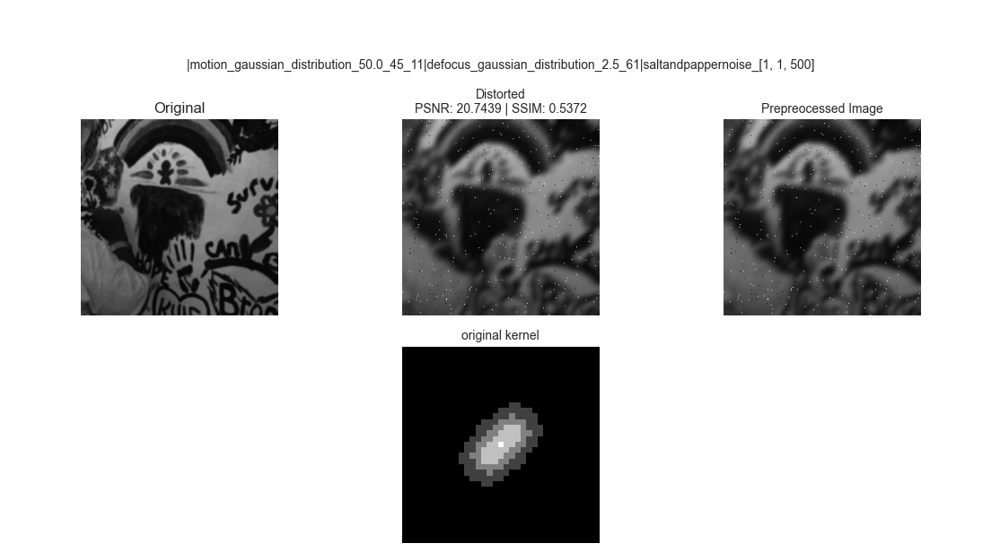

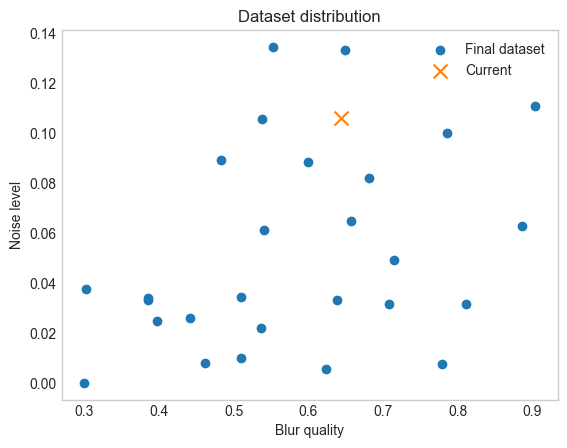

In [150]:
frame.changescale(False)
# frame.read_one('boy.png')
# frame.read_one('cameraman.png')
# frame.read_one('childs.png')
frame.read_one('drawing.png')
# frame.read_one('airplane.png')
# frame.read_one('clock.png')
# frame.read_one('flags.png')
# frame.read_one('lenna.png')
# frame.read_one('monarch.png')
# frame.read_one('street.png')
# frame.read_one('temple.png')

fl_gauss = GaussianNoise(5.0)
fl_pink = Pink_Noise(noise_level=0.01)
fl_brown = Brown_Noise(noise_level=0.05)
fl_poisson = PoissonNoise(param=0.5)
fl_defocus = DefocusBlur(gaussian_distribution, param=2.5,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,500])

fl = fl_motion
fl_noise = fl_impulse

frame.filter(fl)
frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)


frame.clear_input()

In [151]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "defocusmotion"
noise = "impulse"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

kernel = get_kernel_from_filter([fl])
kernel_path = kernel_name + "_kernel.png"
# save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
# plot_heatmap(final_points)

Готово.


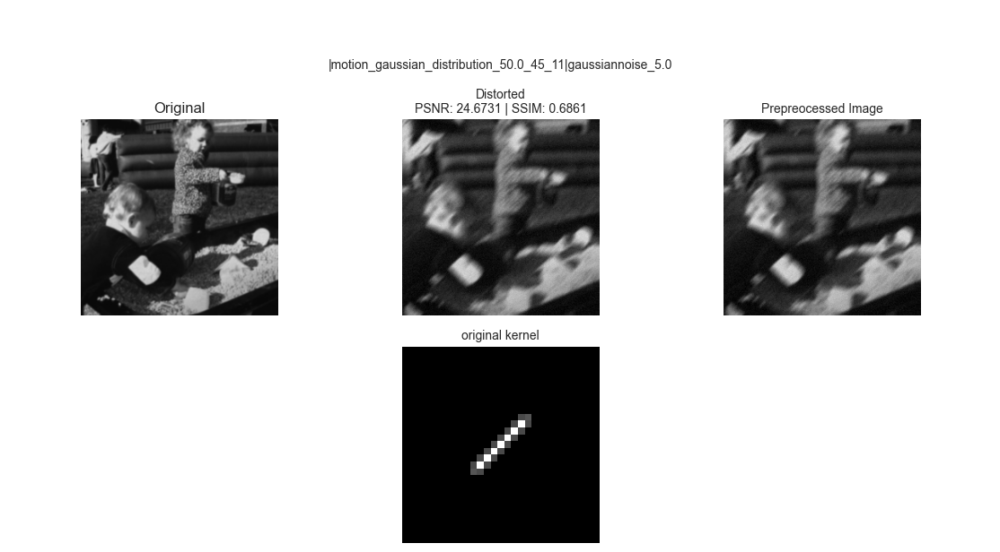

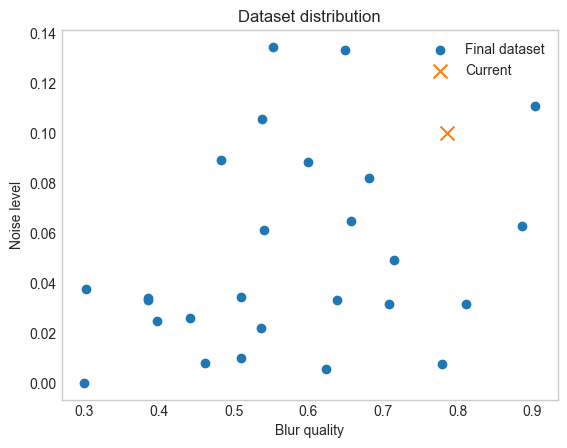

In [147]:
frame.changescale(False)
# frame.read_one('boy.png')
# frame.read_one('cameraman.png')
frame.read_one('childs.png')
# frame.read_one('drawing.png')
# frame.read_one('airplane.png')
# frame.read_one('clock.png')
# frame.read_one('flags.png')
# frame.read_one('lenna.png')
# frame.read_one('monarch.png')
# frame.read_one('street.png')
# frame.read_one('temple.png')

fl_gauss = GaussianNoise(5.0)
fl_pink = Pink_Noise(noise_level=0.01)
fl_brown = Brown_Noise(noise_level=0.05)
fl_poisson = PoissonNoise(param=0.5)
fl_defocus = DefocusBlur(gaussian_distribution, param=2.5,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,500])

fl = fl_motion
fl_noise = fl_gauss

frame.filter(fl)
# frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)


frame.clear_input()

Готово.


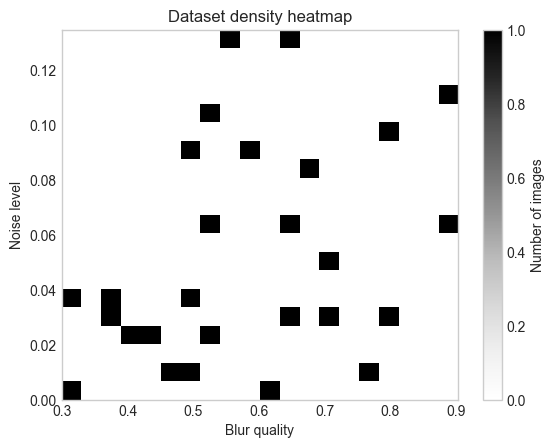

In [ ]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "thick_motion"
noise = "gauss"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

kernel = get_kernel_from_filter([fl])
kernel_path = kernel_name + "_kernel.png"
# save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
# plot_heatmap(final_points)

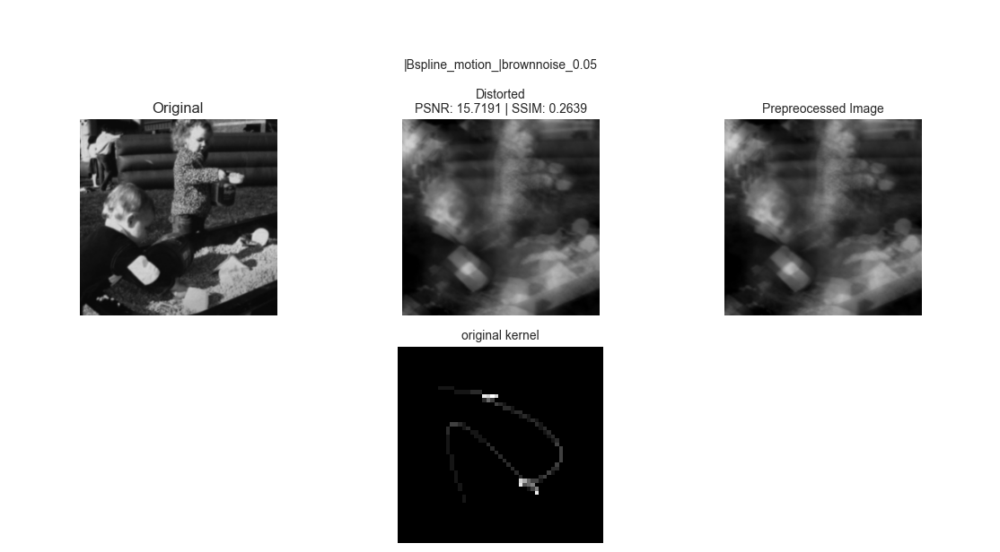

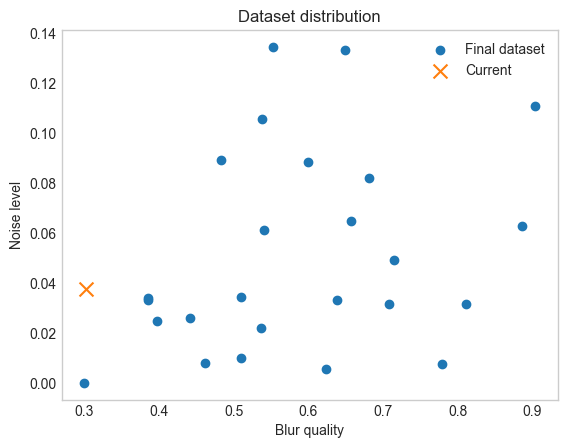

In [142]:
frame.changescale(False)
# frame.read_one('boy.png')
# frame.read_one('cameraman.png')
frame.read_one('childs.png')
# frame.read_one('drawing.png')
# frame.read_one('airplane.png')
# frame.read_one('clock.png')
# frame.read_one('flags.png')
# frame.read_one('lenna.png')
# frame.read_one('monarch.png')
# frame.read_one('street.png')
# frame.read_one('temple.png')

fl_gauss = GaussianNoise(5.0)
fl_pink = Pink_Noise(noise_level=0.01)
fl_brown = Brown_Noise(noise_level=0.05)
fl_poisson = PoissonNoise(param=0.5)
fl_defocus = DefocusBlur(gaussian_distribution, param=2.5,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,500])

fl = fl_bspline5
fl_noise = fl_brown

frame.filter(fl)
# frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)


frame.clear_input()

In [143]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "s_spiral"
noise = "brown"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

kernel = get_kernel_from_filter([fl])
kernel_path = kernel_name + "_kernel.png"
# save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
# plot_heatmap(final_points)

Готово.


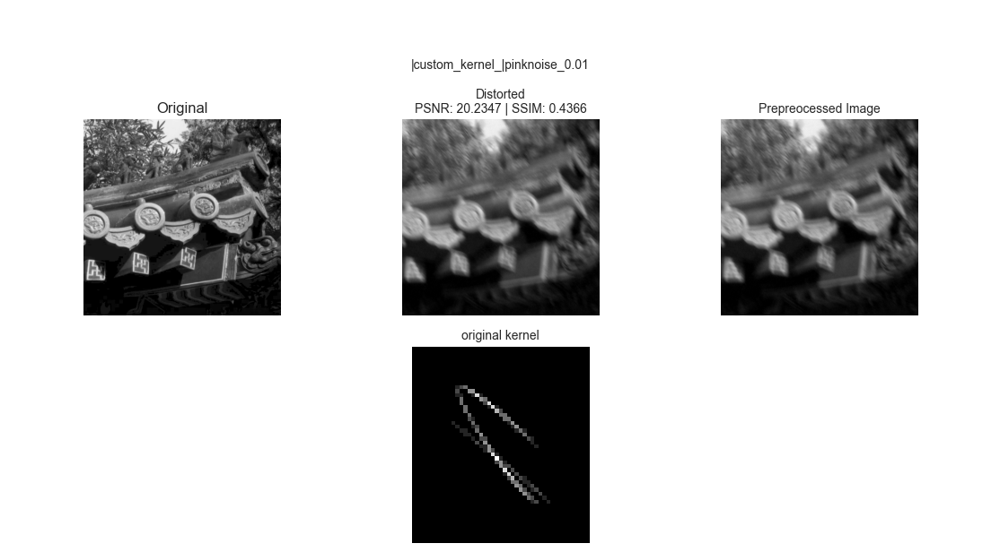

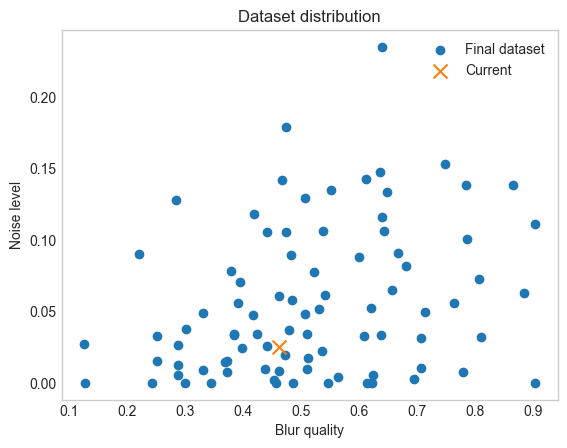

In [31]:
frame.changescale(False)
# frame.read_one('boy.png')
# frame.read_one('cameraman.png')
# frame.read_one('childs.png')
# frame.read_one('drawing.png')
# frame.read_one('airplane.png')
# frame.read_one('clock.png')
# frame.read_one('flags.png')
# frame.read_one('lenna.png')
# frame.read_one('monarch.png')
# frame.read_one('street.png')
frame.read_one('temple.png')

fl_gauss = GaussianNoise(5.0)
fl_pink = Pink_Noise(noise_level=0.01)
fl_brown = Brown_Noise(noise_level=0.05)
fl_poisson = PoissonNoise(param=0.3)
fl_defocus = DefocusBlur(gaussian_distribution, param=2.5,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,500])

fl = fl_custom2
fl_noise = fl_pink

frame.filter(fl)
# frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)


frame.clear_input()

In [32]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "heliod"
noise = "pink"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

kernel = get_kernel_from_filter([fl])
kernel_path = kernel_name + "_kernel.png"
# save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
# plot_heatmap(final_points)

Готово.


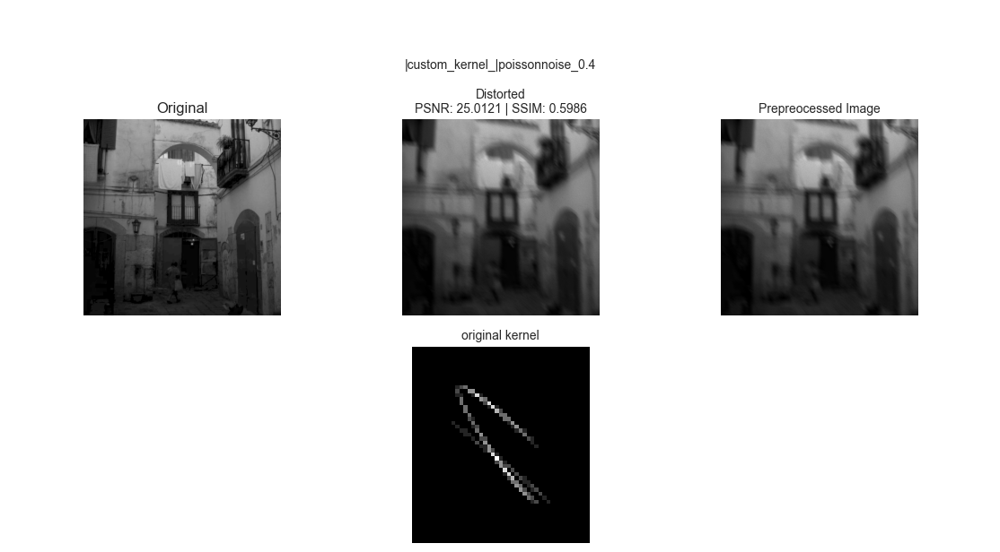

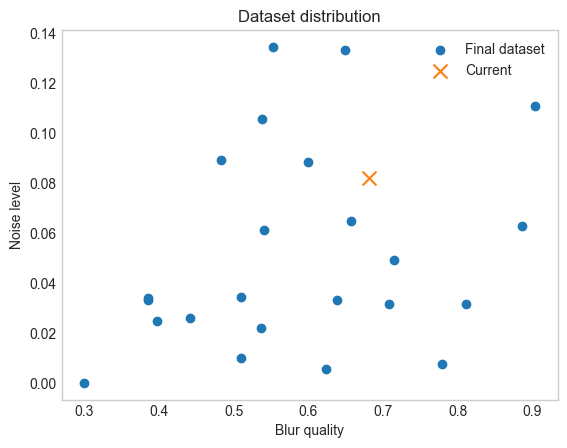

In [121]:
frame.changescale(False)
# frame.read_one('boy.png')
# frame.read_one('cameraman.png')
# frame.read_one('childs.png')
# frame.read_one('drawing.png')
# frame.read_one('airplane.png')
# frame.read_one('clock.png')
# frame.read_one('flags.png')
# frame.read_one('lenna.png')
# frame.read_one('monarch.png')
frame.read_one('street.png')
# frame.read_one('temple.png')

fl_gauss = GaussianNoise(5.0)
fl_pink = Pink_Noise(noise_level=0.02)
fl_brown = Brown_Noise(noise_level=0.05)
fl_poisson = PoissonNoise(param=0.4)
fl_defocus = DefocusBlur(gaussian_distribution, param=2.5,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,500])

fl = fl_custom2
fl_noise = fl_poisson

frame.filter(fl)
# frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)


frame.clear_input()

In [122]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "heliod"
noise = "poisson"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

kernel = get_kernel_from_filter([fl])
kernel_path = kernel_name + "_kernel.png"
# save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
# plot_heatmap(final_points)

Готово.


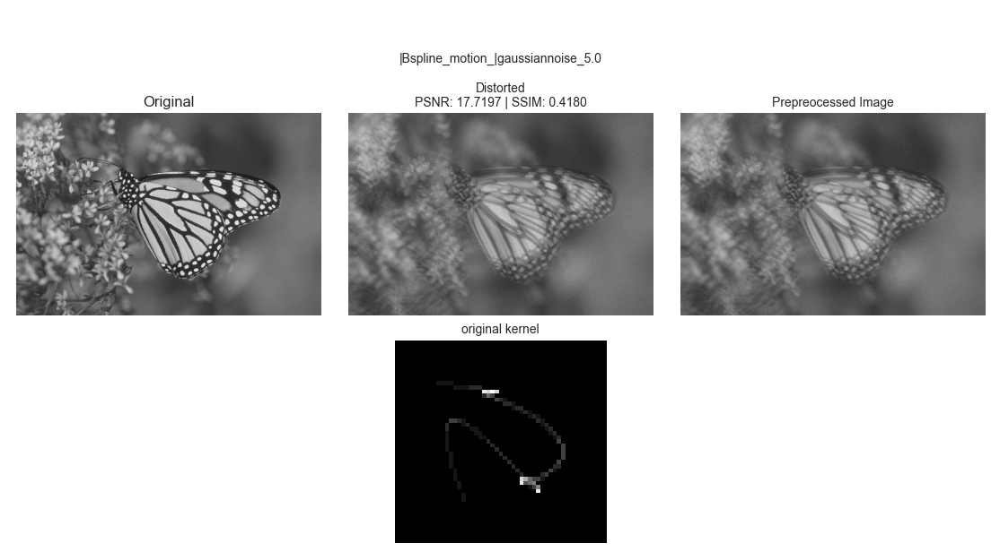

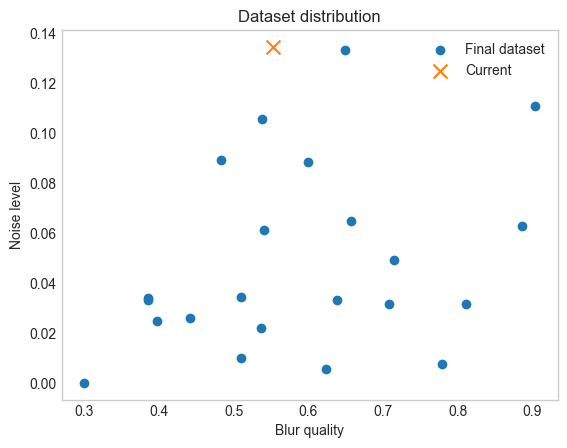

In [114]:
frame.changescale(False)
# frame.read_one('boy.png')
# frame.read_one('cameraman.png')
# frame.read_one('childs.png')
# frame.read_one('drawing.png')
# frame.read_one('airplane.png')
# frame.read_one('clock.png')
# frame.read_one('flags.png')
# frame.read_one('lenna.png')
frame.read_one('monarch.png')
# frame.read_one('street.png')
# frame.read_one('temple.png')

fl_gauss = GaussianNoise(5.0)
fl_pink = Pink_Noise(noise_level=0.02)
fl_brown = Brown_Noise(noise_level=0.05)
fl_poisson = PoissonNoise(param=0.3)
fl_defocus = DefocusBlur(gaussian_distribution, param=2.5,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,500])

fl = fl_bspline5
fl_noise = fl_gauss

frame.filter(fl)
# frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)


frame.clear_input()

In [115]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "s_spiral"
noise = "gauss"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

kernel = get_kernel_from_filter([fl])
kernel_path = kernel_name + "_kernel.png"
save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
# plot_heatmap(final_points)

Готово.


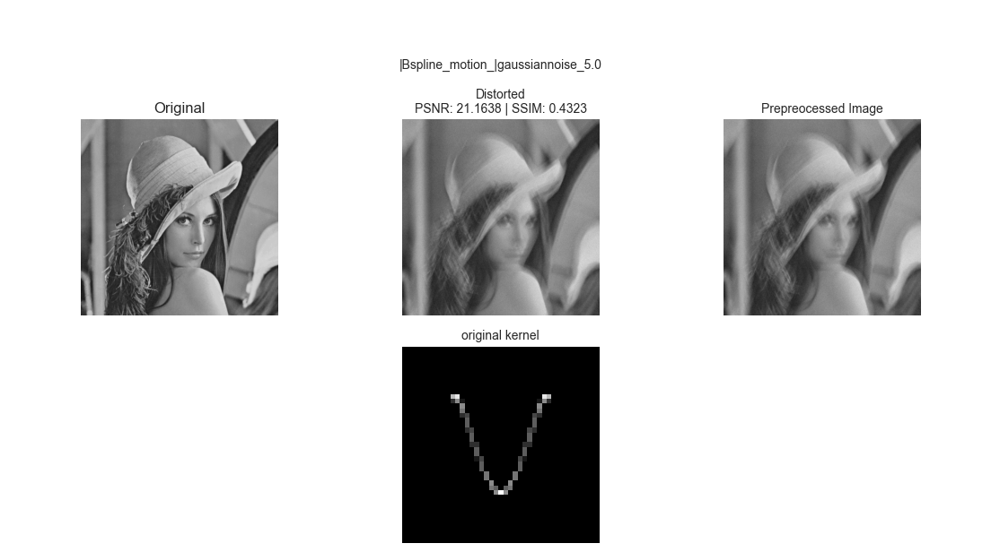

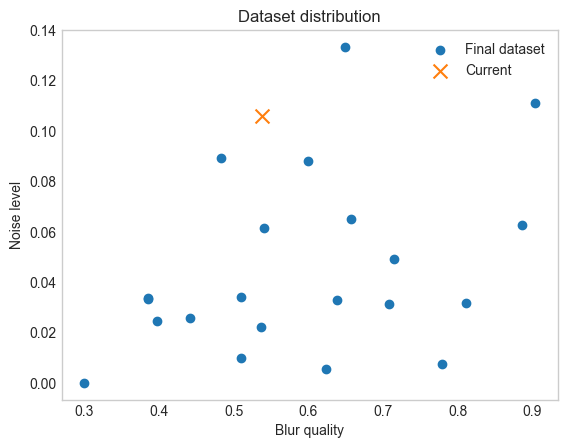

In [109]:
frame.changescale(False)
# frame.read_one('boy.png')
# frame.read_one('cameraman.png')
# frame.read_one('childs.png')
# frame.read_one('drawing.png')
# frame.read_one('airplane.png')
# frame.read_one('clock.png')
# frame.read_one('flags.png')
frame.read_one('lenna.png')
# frame.read_one('monarch.png')
# frame.read_one('street.png')
# frame.read_one('temple.png')

fl_gauss = GaussianNoise(5.0)
fl_pink = Pink_Noise(noise_level=0.02)
fl_brown = Brown_Noise(noise_level=0.05)
fl_poisson = PoissonNoise(param=0.3)
fl_defocus = DefocusBlur(gaussian_distribution, param=2.5,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,500])

fl = fl_bspline
fl_noise = fl_gauss

frame.filter(fl)
# frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)


frame.clear_input()

In [110]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "libra"
noise = "gauss"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

kernel = get_kernel_from_filter([fl])
kernel_path = kernel_name + "_kernel.png"
save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
# plot_heatmap(final_points)

Готово.


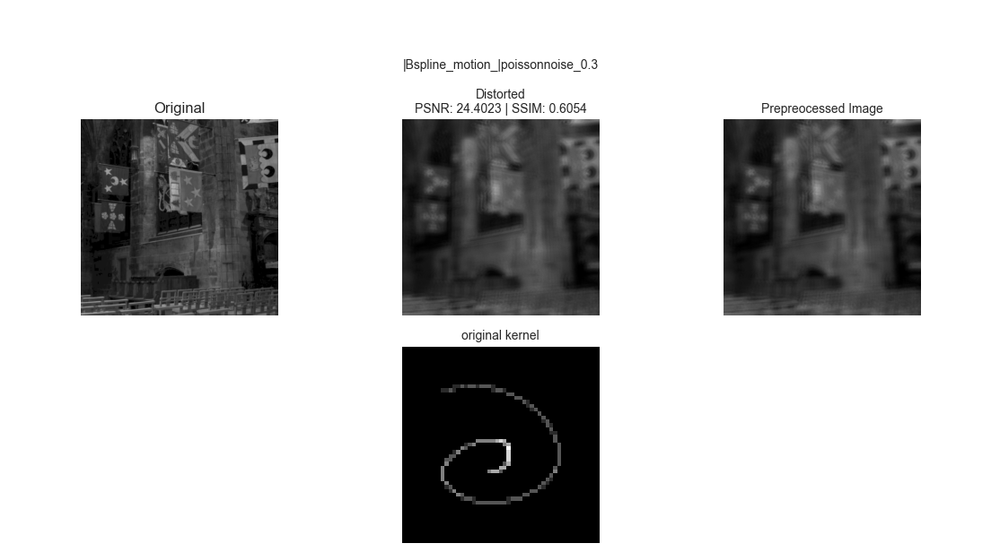

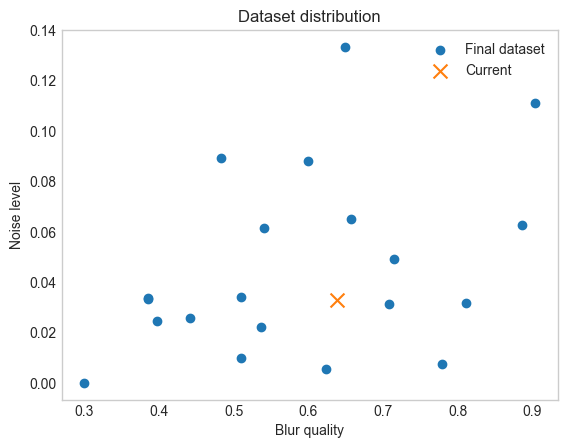

In [107]:
frame.changescale(False)
# frame.read_one('boy.png')
# frame.read_one('cameraman.png')
# frame.read_one('childs.png')
# frame.read_one('drawing.png')
# frame.read_one('airplane.png')
# frame.read_one('clock.png')
frame.read_one('flags.png')
# frame.read_one('lenna.png')
# frame.read_one('monarch.png')
# frame.read_one('street.png')
# frame.read_one('temple.png')

fl_gauss = GaussianNoise(5.0)
fl_pink = Pink_Noise(noise_level=0.02)
fl_brown = Brown_Noise(noise_level=0.05)
fl_poisson = PoissonNoise(param=0.3)
fl_defocus = DefocusBlur(gaussian_distribution, param=2.5,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,500])

fl = fl_bspline11
fl_noise = fl_poisson

frame.filter(fl)
# frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)


frame.clear_input()

In [108]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "spiral"
noise = "poisson"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

kernel = get_kernel_from_filter([fl])
kernel_path = kernel_name + "_kernel.png"
save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
# plot_heatmap(final_points)

Готово.


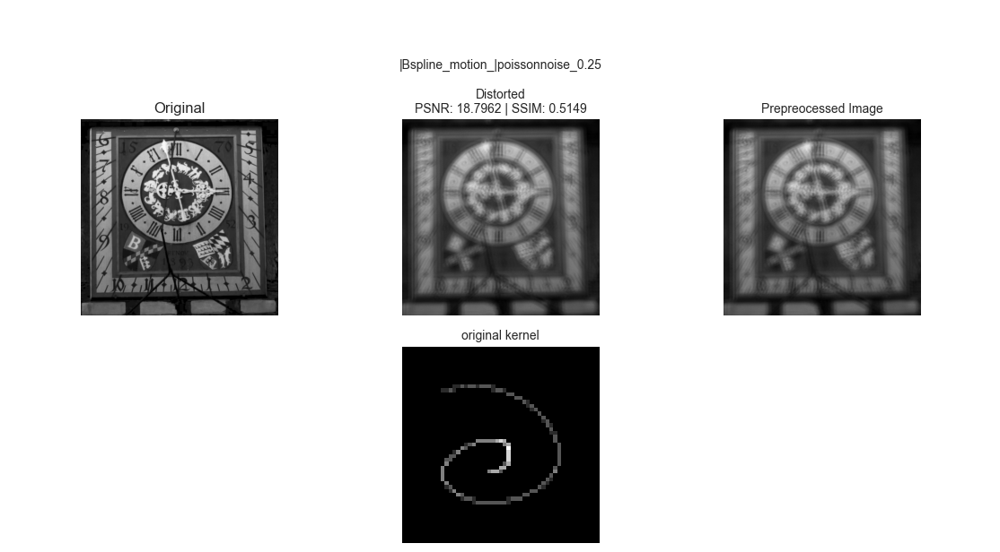

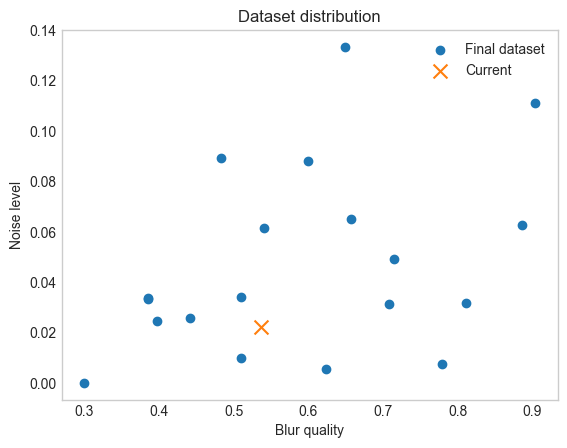

In [102]:
frame.changescale(False)
# frame.read_one('boy.png')
# frame.read_one('cameraman.png')
# frame.read_one('childs.png')
# frame.read_one('drawing.png')
# frame.read_one('airplane.png')
frame.read_one('clock.png')
# frame.read_one('flags.png')
# frame.read_one('lenna.png')
# frame.read_one('monarch.png')
# frame.read_one('street.png')
# frame.read_one('temple.png')

fl_gauss = GaussianNoise(5.0)
fl_pink = Pink_Noise(noise_level=0.02)
fl_brown = Brown_Noise(noise_level=0.05)
fl_poisson = PoissonNoise(param=0.25)
fl_defocus = DefocusBlur(gaussian_distribution, param=2.5,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,500])

fl = fl_bspline11
fl_noise = fl_poisson

frame.filter(fl)
# frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)


frame.clear_input()

Готово.


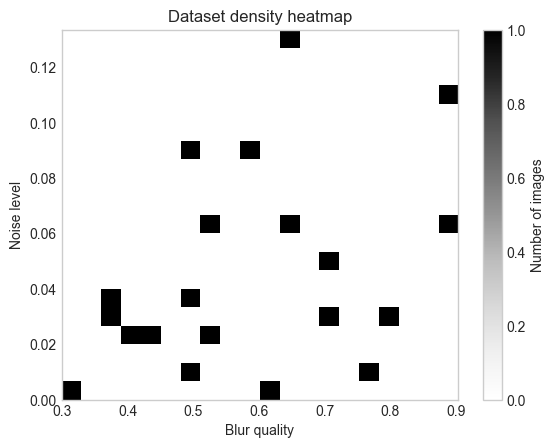

In [103]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "spiral"
noise = "poisson"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

kernel = get_kernel_from_filter([fl])
kernel_path = kernel_name + "_kernel.png"
save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
plot_heatmap(final_points)

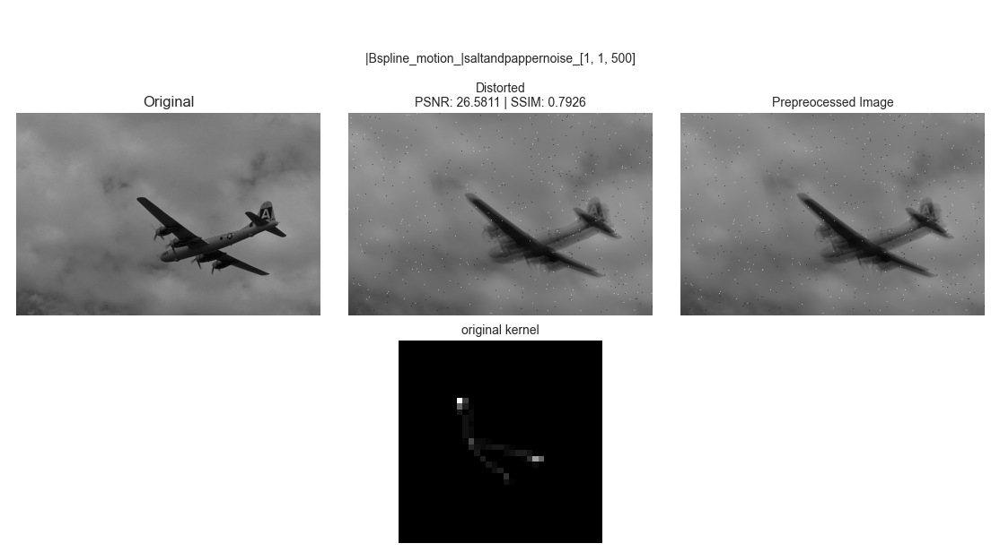

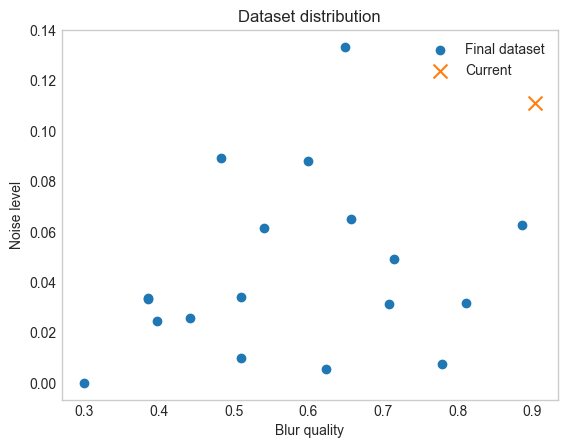

In [96]:
frame.changescale(False)
# frame.read_one('boy.png')
# frame.read_one('cameraman.png')
# frame.read_one('childs.png')
# frame.read_one('drawing.png')
frame.read_one('airplane.png')
# frame.read_one('clock.png')
# frame.read_one('flags.png')
# frame.read_one('lenna.png')
# frame.read_one('monarch.png')
# frame.read_one('street.png')
# frame.read_one('temple.png')

fl_gauss = GaussianNoise(5.0)
fl_pink = Pink_Noise(noise_level=0.02)
fl_brown = Brown_Noise(noise_level=0.05)
fl_poisson = PoissonNoise(param=0.35)
fl_defocus = DefocusBlur(gaussian_distribution, param=2.5,kernel_size = 61)
fl_impulse = SaltAndPepperNoise([1,1,500])

fl = fl_bspline9
fl_noise = fl_impulse

frame.filter(fl)
# frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)


frame.clear_input()

Готово.


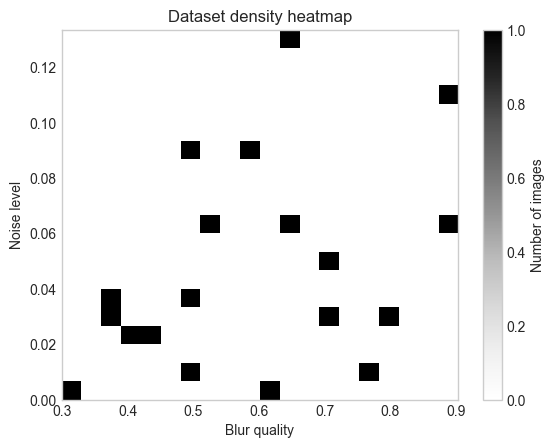

In [97]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "dendric"
noise = "impulse"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

kernel = get_kernel_from_filter([fl])
kernel_path = kernel_name + "_kernel.png"
save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
plot_heatmap(final_points)

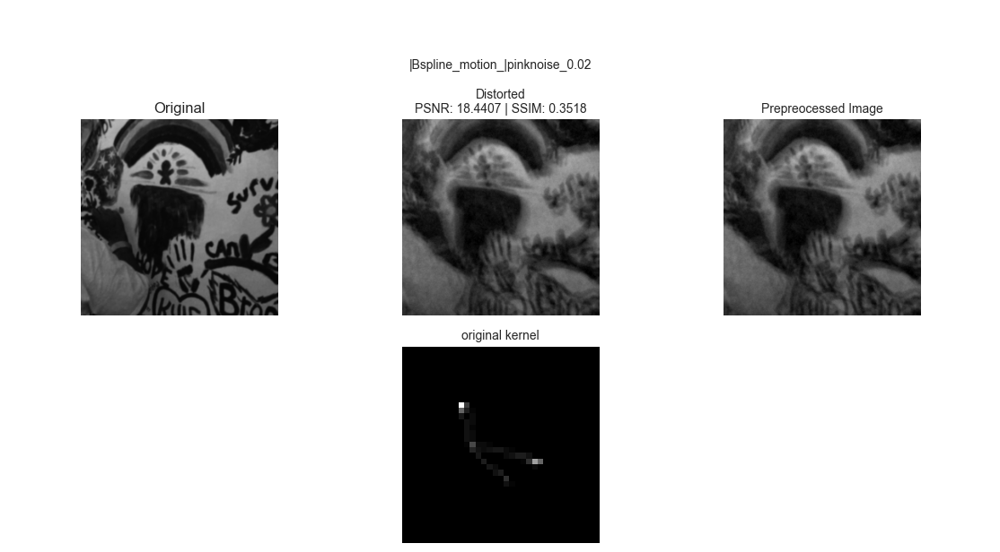

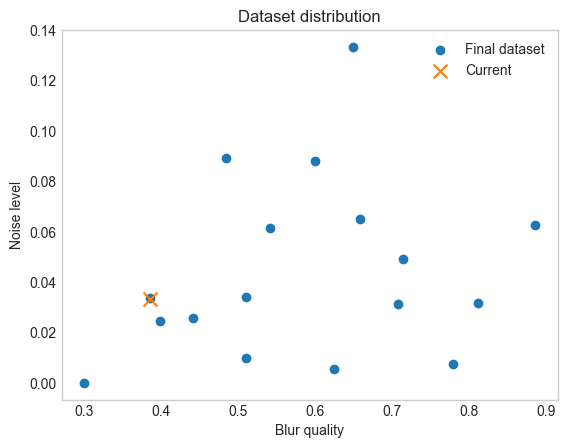

In [93]:
frame.changescale(False)
# frame.read_one('boy.png')
# frame.read_one('cameraman.png')
# frame.read_one('childs.png')
frame.read_one('drawing.png')
# frame.read_one('airplane.png')
# frame.read_one('clock.png')
# frame.read_one('flags.png')
# frame.read_one('lenna.png')
# frame.read_one('monarch.png')
# frame.read_one('street.png')
# frame.read_one('temple.png')

fl_gauss = GaussianNoise(5.0)
fl_pink = Pink_Noise(noise_level=0.02)
fl_brown = Brown_Noise(noise_level=0.05)
fl_poisson = PoissonNoise(param=0.35)
fl_defocus = DefocusBlur(gaussian_distribution, param=2.5,kernel_size = 61)

fl = fl_bspline9
fl_noise = fl_pink

frame.filter(fl)
# frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)


frame.clear_input()

Готово.


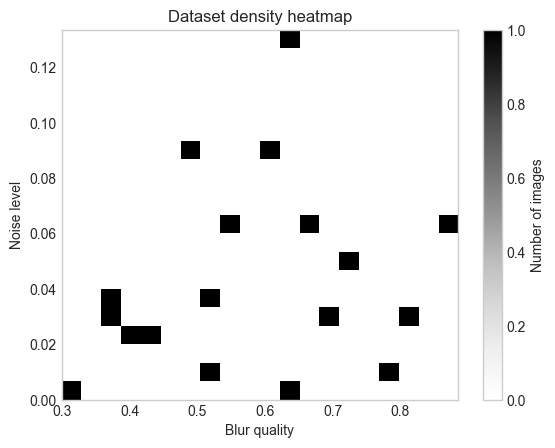

In [94]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "dendric"
noise = "pink"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

kernel = get_kernel_from_filter([fl])
kernel_path = kernel_name + "_kernel.png"
save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
plot_heatmap(final_points)

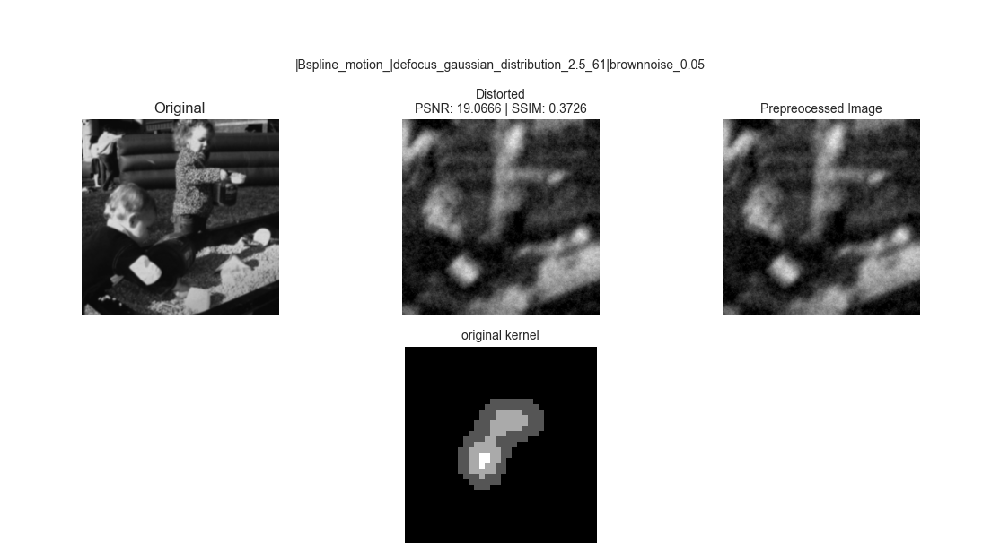

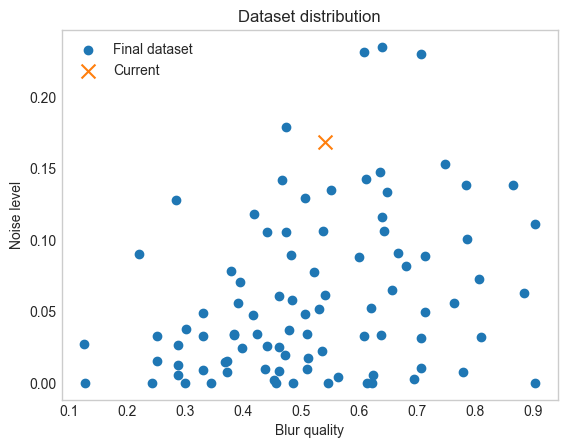

In [41]:
frame.changescale(False)
# frame.read_one('boy.png')
# frame.read_one('cameraman.png')
frame.read_one('childs.png')
# frame.read_one('drawing.png')
# frame.read_one('airplane.png')
# frame.read_one('clock.png')
# frame.read_one('flags.png')
# frame.read_one('lenna.png')
# frame.read_one('monarch.png')
# frame.read_one('street.png')
# frame.read_one('temple.png')

fl_gauss = GaussianNoise(5.0)
fl_pink = Pink_Noise(noise_level=0.02)
fl_brown = Brown_Noise(noise_level=0.05)
fl_poisson = PoissonNoise(param=0.35)
fl_defocus = DefocusBlur(gaussian_distribution, param=2.5,kernel_size = 61)

fl = fl_bspline15
fl_noise = fl_brown

frame.filter(fl)
frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)


frame.clear_input()

Готово.


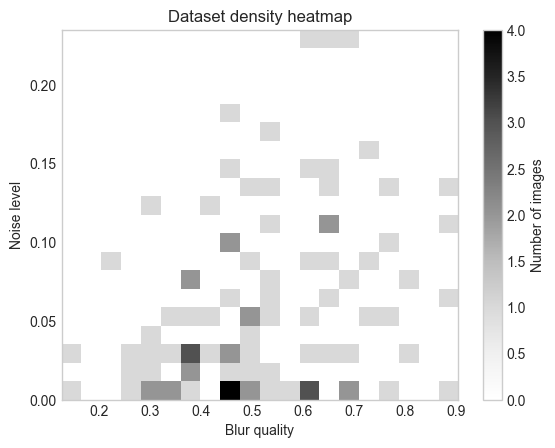

In [42]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "pacman"
noise = "brown"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

kernel = get_kernel_from_filter([fl, fl_defocus])
kernel_path = kernel_name + "_kernel.png"
save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
plot_heatmap(final_points)

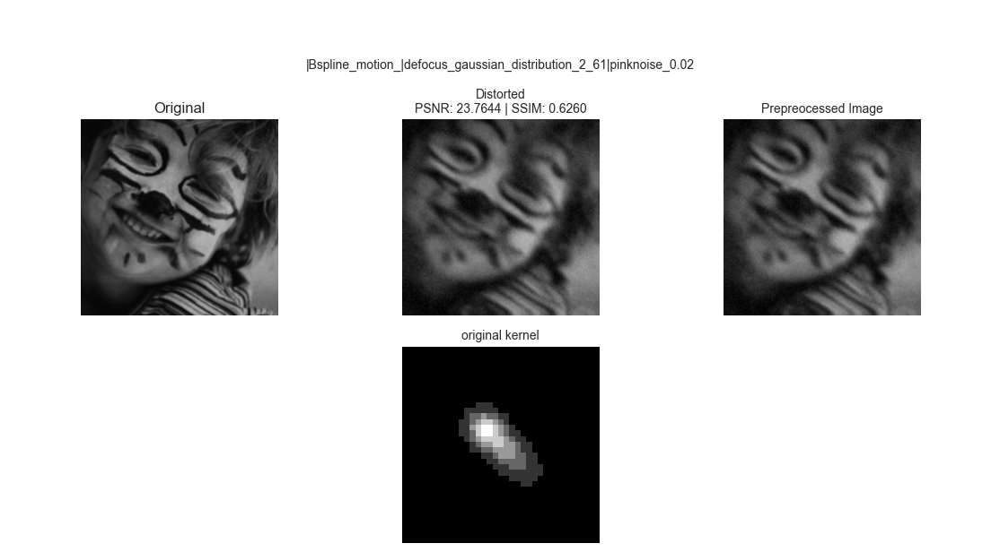

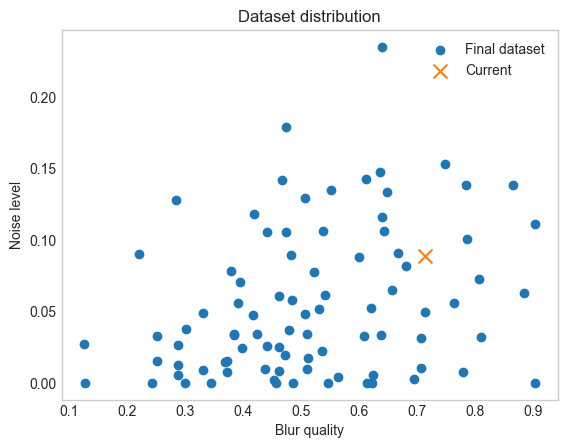

In [33]:
frame.changescale(False)
frame.read_one('boy.png')
# frame.read_one('cameraman.png')
# frame.read_one('childs.png')
# frame.read_one('drawing.png')
# frame.read_one('airplane.png')
# frame.read_one('clock.png')
# frame.read_one('flags.png')
# frame.read_one('lenna.png')
# frame.read_one('monarch.png')
# frame.read_one('street.png')
# frame.read_one('temple.png')

fl_gauss = GaussianNoise(5.0)
fl_pink = Pink_Noise(noise_level=0.02)
fl_brown = Brown_Noise(noise_level=0.05)
fl_poisson = PoissonNoise(param=0.35)
fl_defocus = DefocusBlur(gaussian_distribution, param=2,kernel_size = 61)

fl = fl_bspline14
fl_noise = fl_pink

frame.filter(fl)
frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)


frame.clear_input()

Готово.


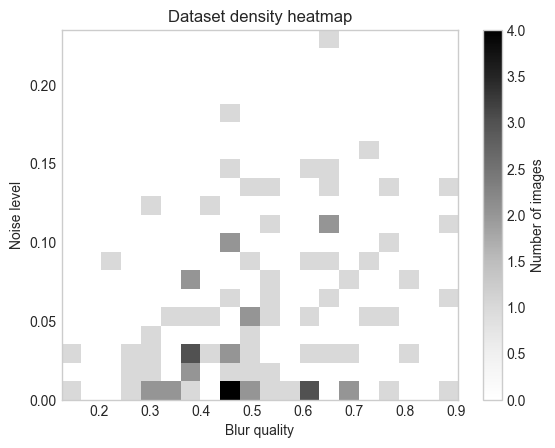

In [34]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "comet"
noise = "pink"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

kernel = get_kernel_from_filter([fl])
kernel_path = kernel_name + "_kernel.png"
save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
plot_heatmap(final_points)

In [59]:
kernel = get_kernel_from_filter([fl, fl_defocus])
kernel_path = kernel_name + "_kernel.png"
save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)

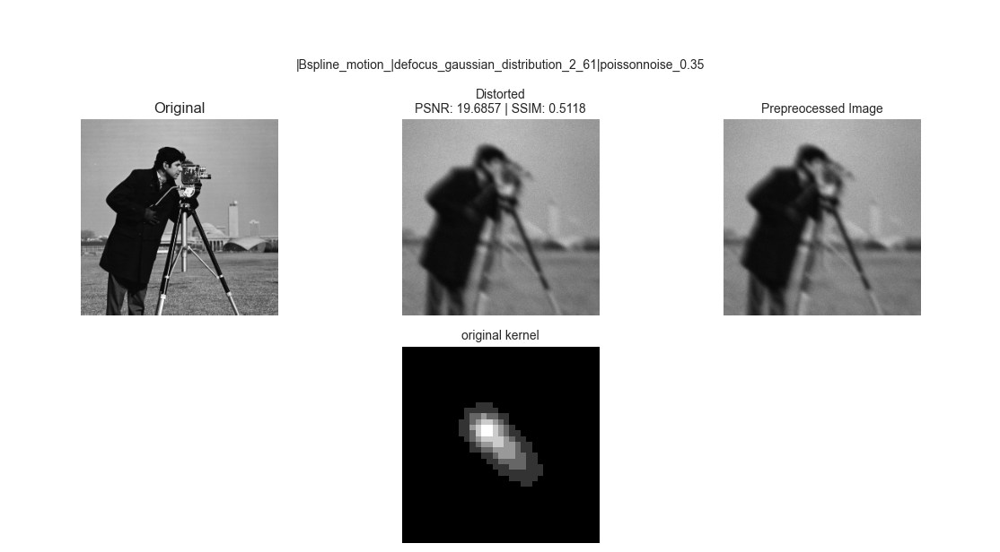

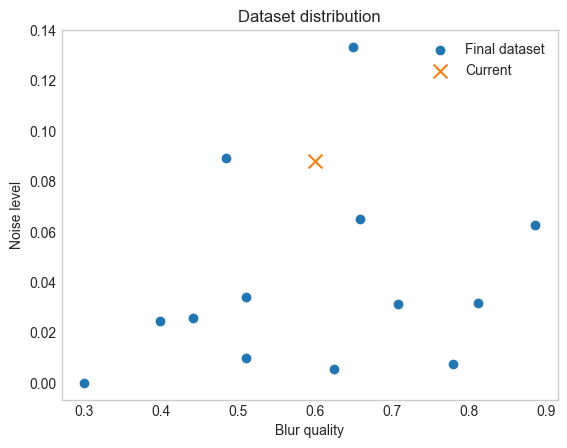

In [49]:
frame.changescale(False)
# frame.read_one('boy.png')
frame.read_one('cameraman.png')
# frame.read_one('childs.png')
# frame.read_one('drawing.png')
# frame.read_one('airplane.png')
# frame.read_one('clock.png')
# frame.read_one('flags.png')
# frame.read_one('lenna.png')
# frame.read_one('monarch.png')
# frame.read_one('street.png')
# frame.read_one('temple.png')

fl_gauss = GaussianNoise(5.0)
fl_pink = Pink_Noise(noise_level=0.015)
fl_brown = Brown_Noise(noise_level=0.05)
fl_poisson = PoissonNoise(param=0.35)
fl_defocus = DefocusBlur(gaussian_distribution, param=2,kernel_size = 61)

fl = fl_bspline14
fl_noise = fl_poisson

frame.filter(fl)
frame.filter(fl_defocus)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)


frame.clear_input()

Готово.


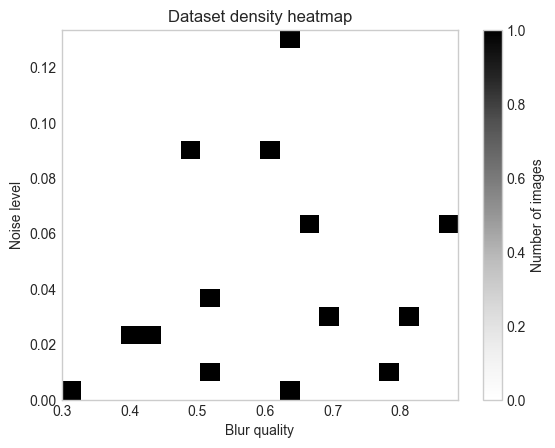

In [50]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "comet"
noise = "poisson"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

kernel = get_kernel_from_filter([fl])
kernel_path = kernel_name + "_kernel.png"
save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
plot_heatmap(final_points)

In [51]:
kernel = get_kernel_from_filter([fl, fl_defocus])
kernel_path = kernel_name + "_kernel.png"
save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)

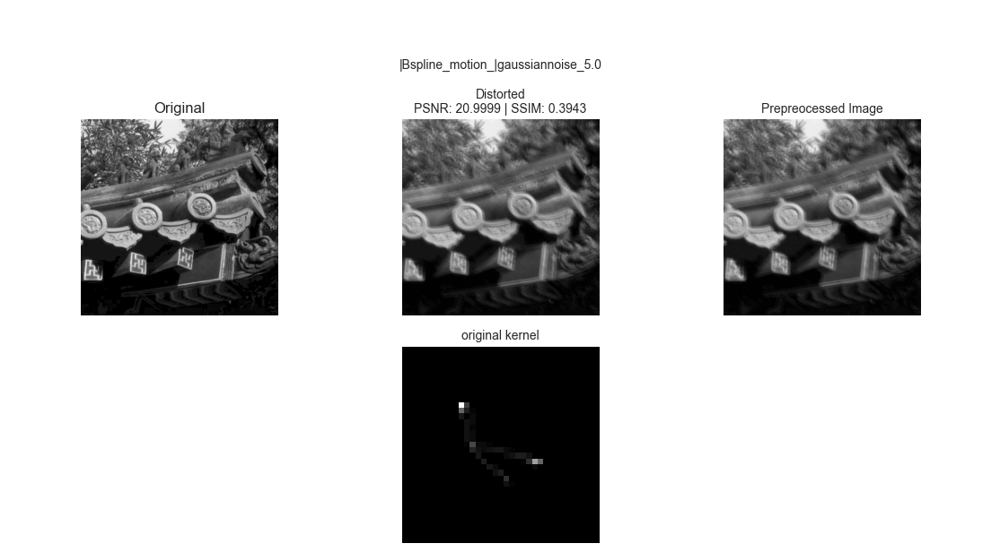

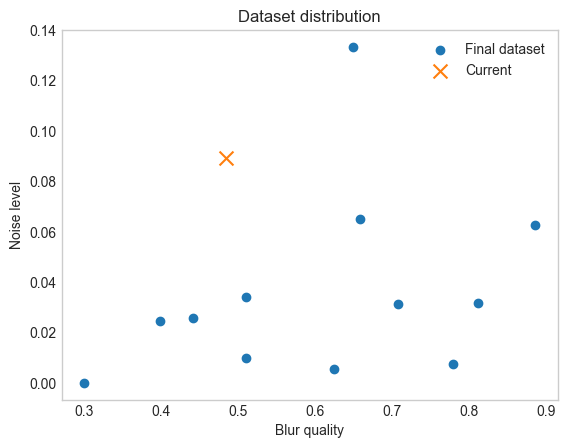

In [39]:
frame.changescale(False)
# frame.read_one('boy.png')
# frame.read_one('cameraman.png')
# frame.read_one('childs.png')
# frame.read_one('drawing.png')
# frame.read_one('airplane.png')
# frame.read_one('clock.png')
# frame.read_one('flags.png')
# frame.read_one('lenna.png')
# frame.read_one('monarch.png')
# frame.read_one('street.png')
frame.read_one('temple.png')

fl_gauss = GaussianNoise(5.0)
fl_pink = Pink_Noise(noise_level=0.015)
fl_brown = Brown_Noise(noise_level=0.05)
fl_poisson = PoissonNoise(param=0.35)
fl_defocus = DefocusBlur(gaussian_distribution, param=2,kernel_size = 61)

fl = fl_bspline9
fl_noise = fl_gauss

frame.filter(fl)
# frame.filter(fl_motion)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)


frame.clear_input()

Готово.


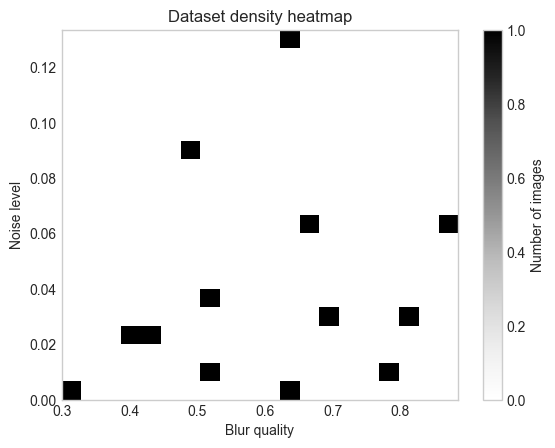

In [40]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "dendric"
noise = "gauss"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

kernel = get_kernel_from_filter([fl])
kernel_path = kernel_name + "_kernel.png"
save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
plot_heatmap(final_points)

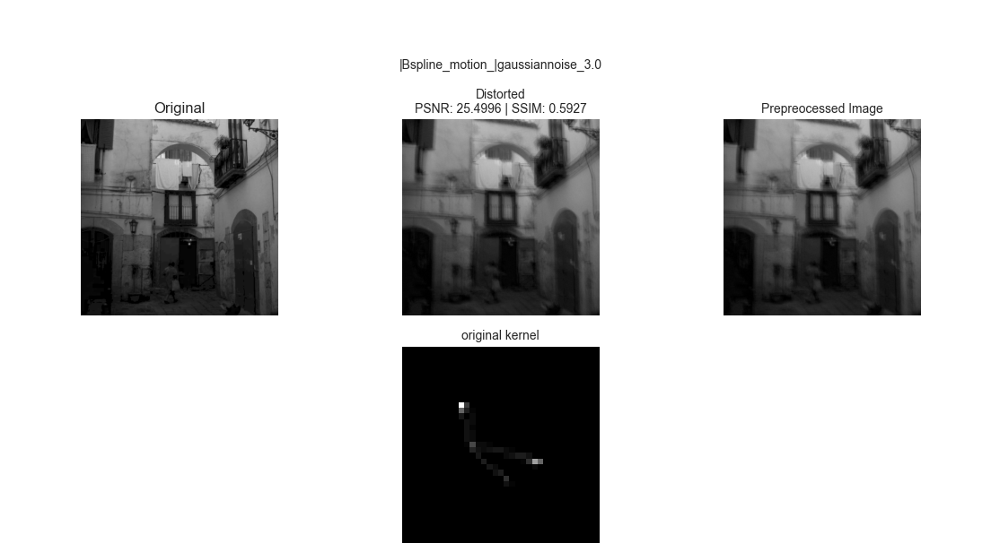

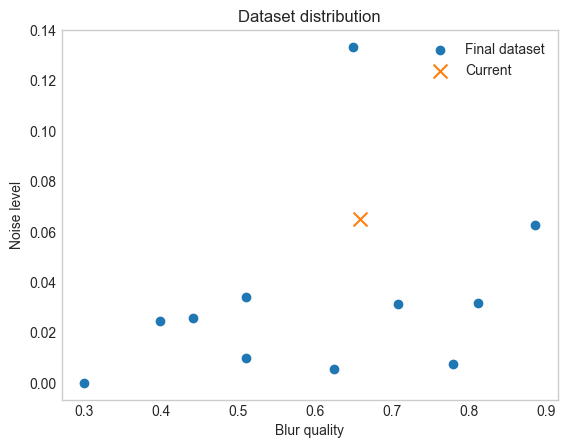

In [34]:
frame.changescale(False)
# frame.read_one('boy.png')
# frame.read_one('cameraman.png')
# frame.read_one('childs.png')
# frame.read_one('drawing.png')
# frame.read_one('airplane.png')
# frame.read_one('clock.png')
# frame.read_one('flags.png')
# frame.read_one('lenna.png')
# frame.read_one('monarch.png')
frame.read_one('street.png')
# frame.read_one('temple.png')

fl_gauss = GaussianNoise(3.0)
fl_pink = Pink_Noise(noise_level=0.015)
fl_brown = Brown_Noise(noise_level=0.05)
fl_poisson = PoissonNoise(param=0.2)
fl_defocus = DefocusBlur(gaussian_distribution, param=2,kernel_size = 61)

fl = fl_bspline9
fl_noise = fl_gauss

frame.filter(fl)
# frame.filter(fl_motion)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)


frame.clear_input()

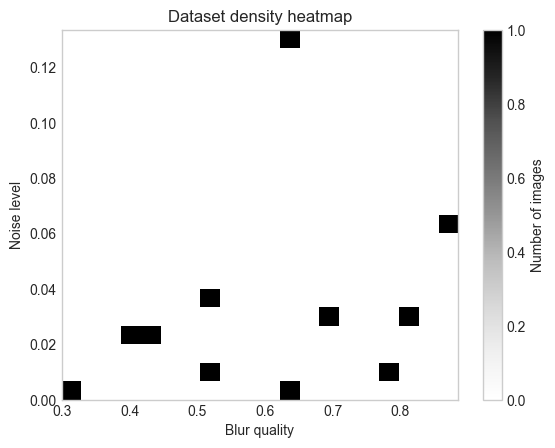

Готово.


In [ ]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "dendric"
noise = "gauss"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

kernel = get_kernel_from_filter([fl])
kernel_path = kernel_name + "_kernel.png"
save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)
plot_heatmap(final_points)

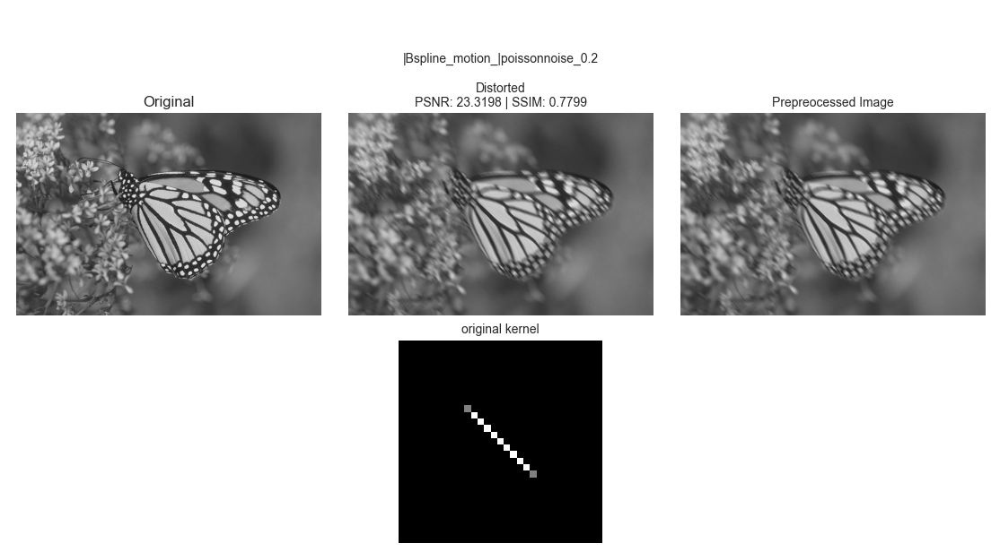

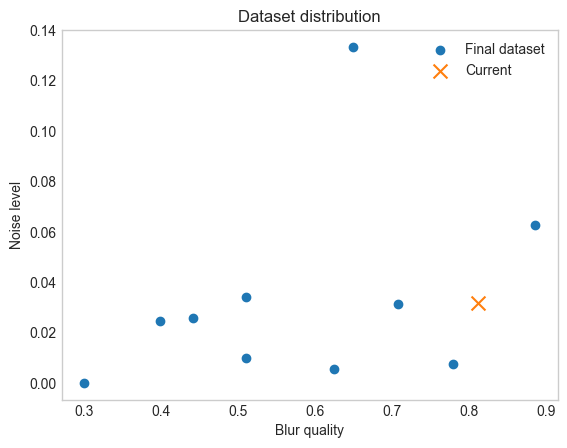

In [39]:
frame.changescale(False)
# frame.read_one('boy.png')
# frame.read_one('cameraman.png')
# frame.read_one('childs.png')
# frame.read_one('drawing.png')
# frame.read_one('airplane.png')
# frame.read_one('clock.png')
# frame.read_one('flags.png')
# frame.read_one('lenna.png')
frame.read_one('monarch.png')
# frame.read_one('street.png')
# frame.read_one('temple.png')

fl_gauss = GaussianNoise(1.0)
fl_pink = Pink_Noise(noise_level=0.015)
fl_brown = Brown_Noise(noise_level=0.1)
fl_poisson = PoissonNoise(param=0.2)
fl_defocus = DefocusBlur(gaussian_distribution, param=2,kernel_size = 61)

fl = fl_bspline12
fl_noise = fl_poisson

frame.filter(fl)
# frame.filter(fl_motion)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)


frame.clear_input()

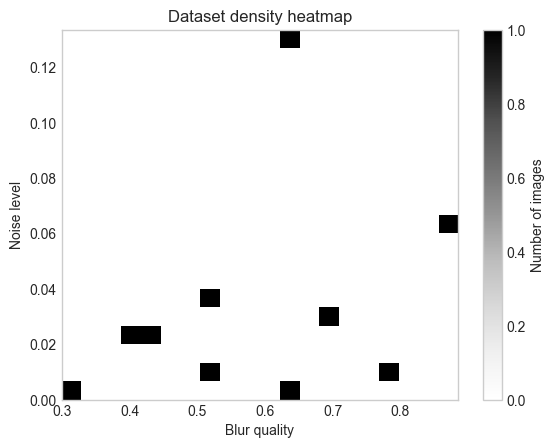

Готово.


In [40]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")
plot_heatmap(final_points)

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "motion"
noise = "poisson"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

kernel = get_kernel_from_filter([fl])
kernel_path = kernel_name + "_kernel.png"
save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)

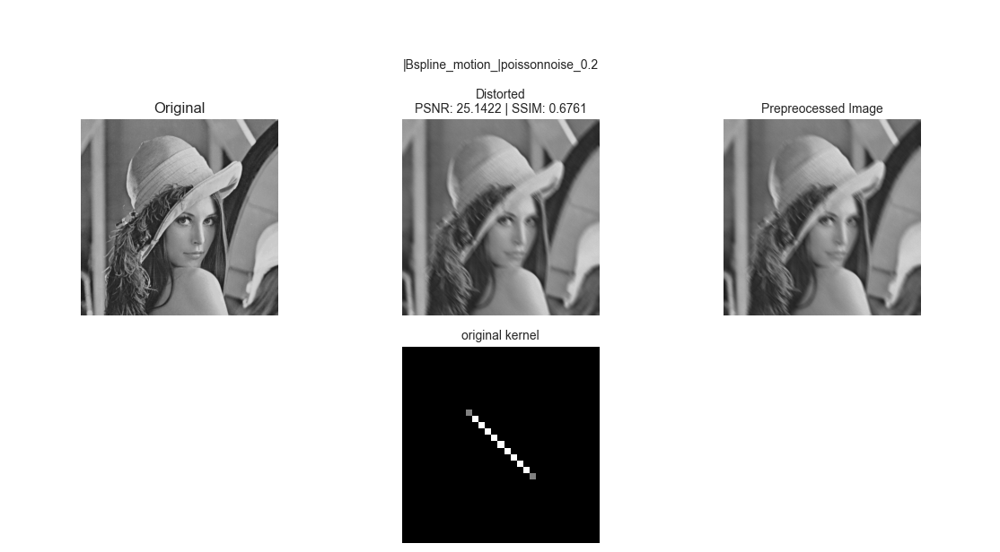

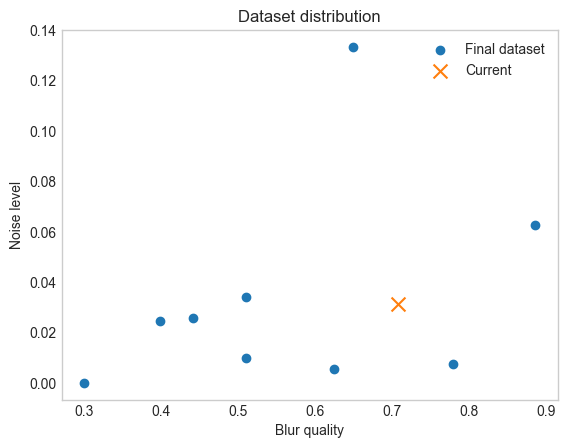

In [37]:
frame.changescale(False)
# frame.read_one('boy.png')
# frame.read_one('cameraman.png')
# frame.read_one('childs.png')
# frame.read_one('drawing.png')
# frame.read_one('airplane.png')
# frame.read_one('clock.png')
# frame.read_one('flags.png')
frame.read_one('lenna.png')
# frame.read_one('monarch.png')
# frame.read_one('street.png')
# frame.read_one('temple.png')

fl_gauss = GaussianNoise(1.0)
fl_pink = Pink_Noise(noise_level=0.015)
fl_brown = Brown_Noise(noise_level=0.1)
fl_poisson = PoissonNoise(param=0.2)
fl_defocus = DefocusBlur(gaussian_distribution, param=2,kernel_size = 61)

fl = fl_bspline12
fl_noise = fl_poisson

frame.filter(fl)
# frame.filter(fl_motion)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)


frame.clear_input()

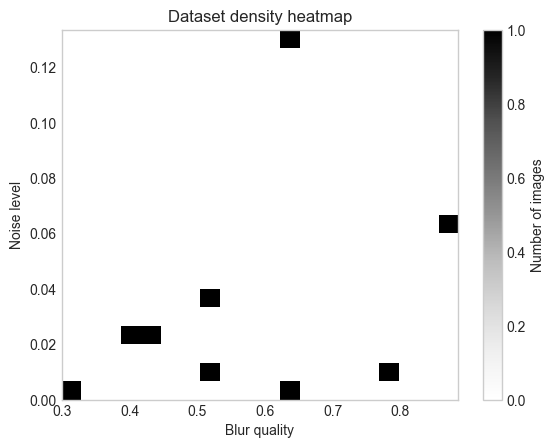

Готово.


In [38]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")
plot_heatmap(final_points)

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "motion"
noise = "poisson"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

kernel = get_kernel_from_filter([fl])
kernel_path = kernel_name + "_kernel.png"
save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)

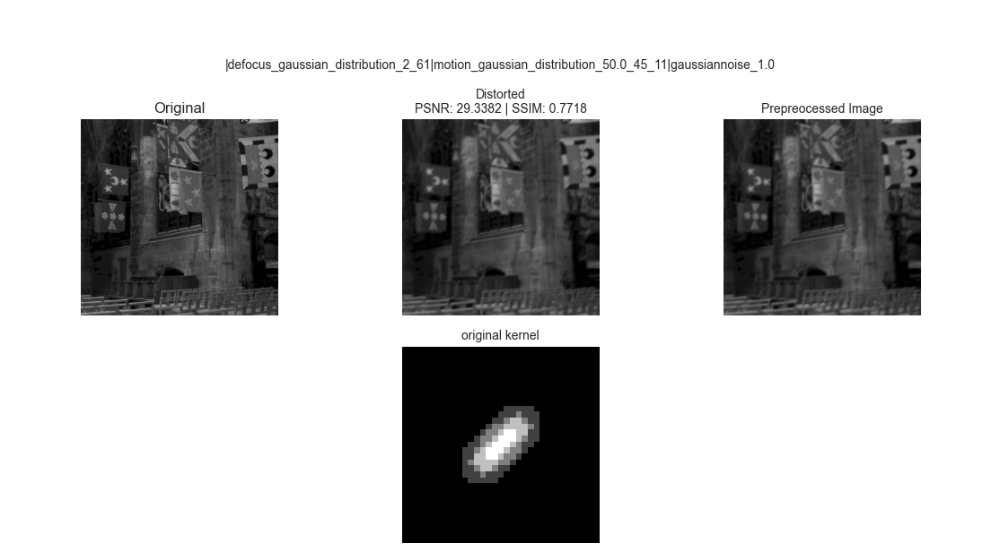

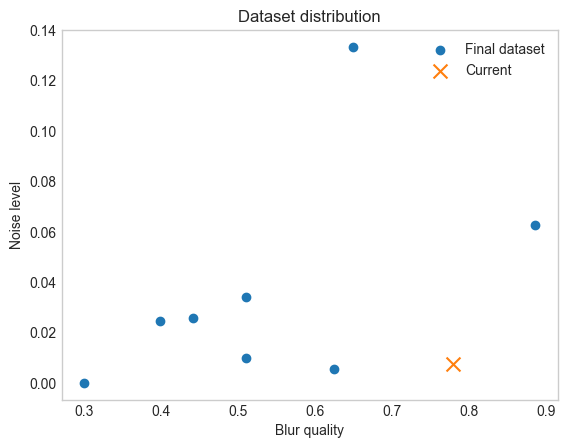

In [35]:
frame.changescale(False)
# frame.read_one('boy.png')
# frame.read_one('cameraman.png')
# frame.read_one('childs.png')
# frame.read_one('drawing.png')
# frame.read_one('airplane.png')
# frame.read_one('clock.png')
frame.read_one('flags.png')
# frame.read_one('lenna.png')
# frame.read_one('monarch.png')
# frame.read_one('street.png')
# frame.read_one('temple.png')

fl_gauss = GaussianNoise(1.0)
fl_pink = Pink_Noise(noise_level=0.015)
fl_brown = Brown_Noise(noise_level=0.1)
fl_poisson = PoissonNoise(param=0.2)
fl_defocus = DefocusBlur(gaussian_distribution, param=2,kernel_size = 61)

fl = fl_defocus
fl_noise = fl_gauss

frame.filter(fl)
frame.filter(fl_motion)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)


frame.clear_input()

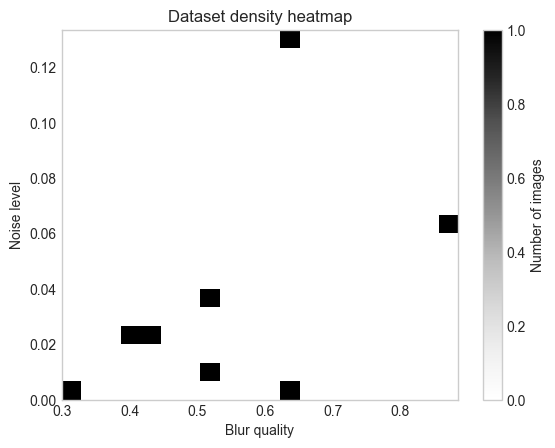

Готово.


In [36]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")
plot_heatmap(final_points)

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "defocusmotion"
noise = "gauss"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

kernel = get_kernel_from_filter([fl])
kernel_path = kernel_name + "_kernel.png"
save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)

In [47]:
kernel_name = "defocusmotion"
kernel = get_kernel_from_filter([fl_defocus, fl_motion])
kernel_path = kernel_name + "_kernel.png"
save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)

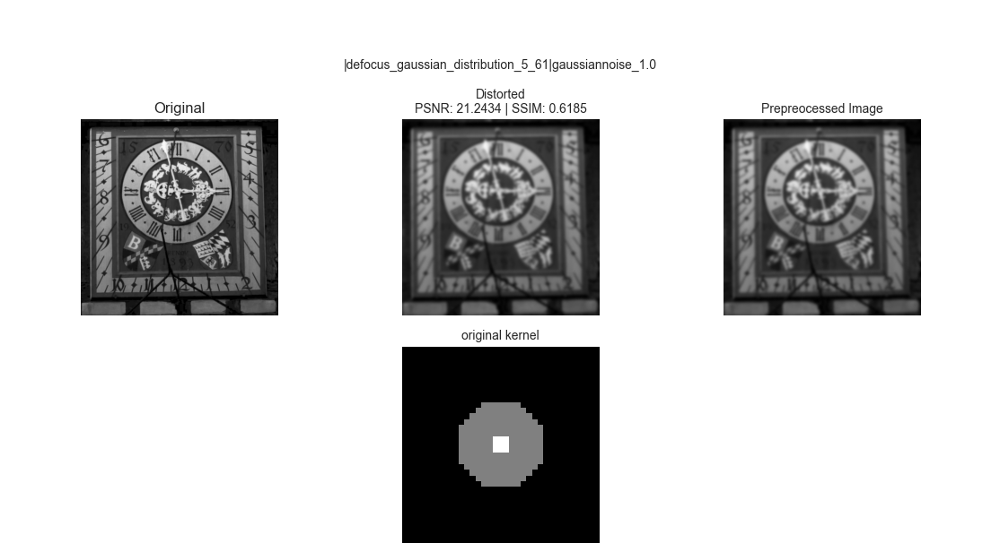

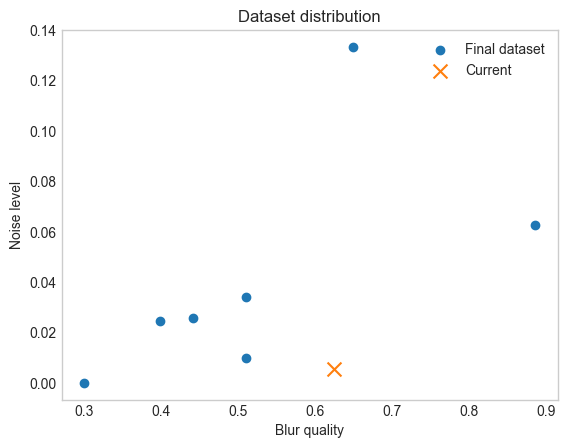

In [33]:
frame.changescale(False)
# frame.read_one('boy.png')
# frame.read_one('cameraman.png')
# frame.read_one('childs.png')
# frame.read_one('drawing.png')
# frame.read_one('airplane.png')
frame.read_one('clock.png')
# frame.read_one('flags.jpg')
# frame.read_one('lenna.png')
# frame.read_one('monarch.png')
# frame.read_one('street.png')
# frame.read_one('temple.png')

fl_gauss = GaussianNoise(1.0)
fl_pink = Pink_Noise(noise_level=0.015)
fl_brown = Brown_Noise(noise_level=0.1)
fl_poisson = PoissonNoise(param=0.2)
fl_defocus = DefocusBlur(gaussian_distribution, param=5,kernel_size = 61)

fl = fl_defocus
fl_noise = fl_gauss

frame.filter(fl)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)


frame.clear_input()

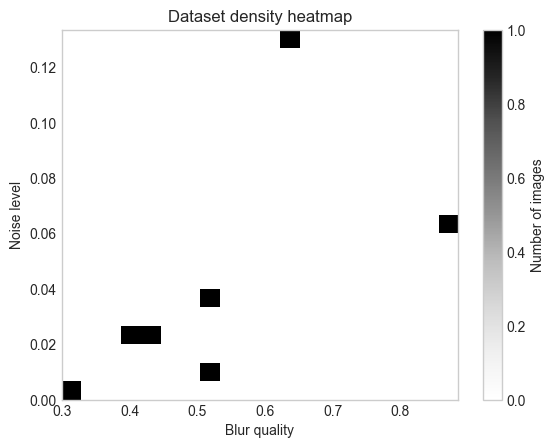

Готово.


In [34]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")
plot_heatmap(final_points)

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "defocus"
noise = "gauss"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

kernel = get_kernel_from_filter([fl])
kernel_path = kernel_name + "_kernel.png"
save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)

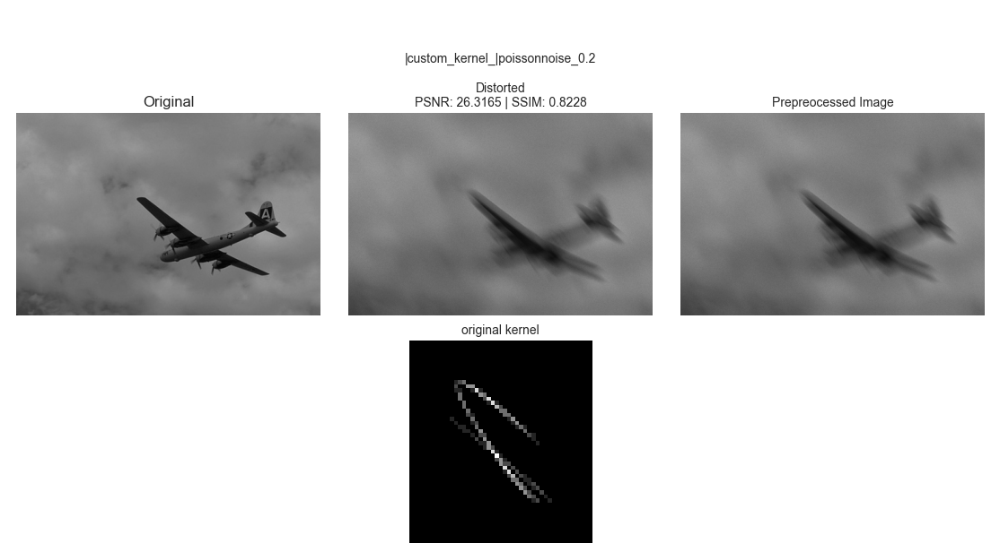

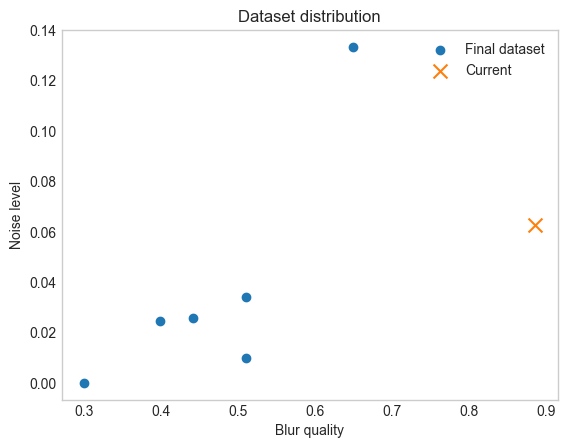

In [31]:
frame.changescale(False)
# frame.read_one('boy.png')
# frame.read_one('cameraman.png')
# frame.read_one('childs.png')
# frame.read_one('drawing.png')
frame.read_one('airplane.png')
# frame.read_one('clock.jpg')
# frame.read_one('flags.jpg')
# frame.read_one('lenna.png')
# frame.read_one('monarch.png')
# frame.read_one('street.png')
# frame.read_one('temple.png')

fl_gauss = GaussianNoise(5.0)
fl_pink = Pink_Noise(noise_level=0.015)
fl_brown = Brown_Noise(noise_level=0.1)
fl_poisson = PoissonNoise(param=0.2)


fl = fl_custom2
fl_noise = fl_poisson

frame.filter(fl)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)


frame.clear_input()

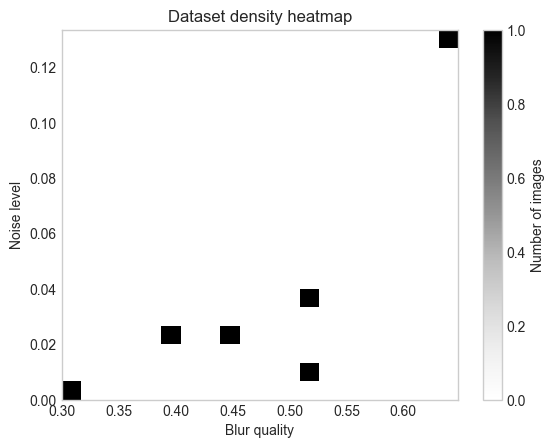

Готово.


In [32]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")
plot_heatmap(final_points)

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "heliod"
noise = "poisson"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

kernel = get_kernel_from_filter([fl])
kernel_path = kernel_name + "_kernel.png"
save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)

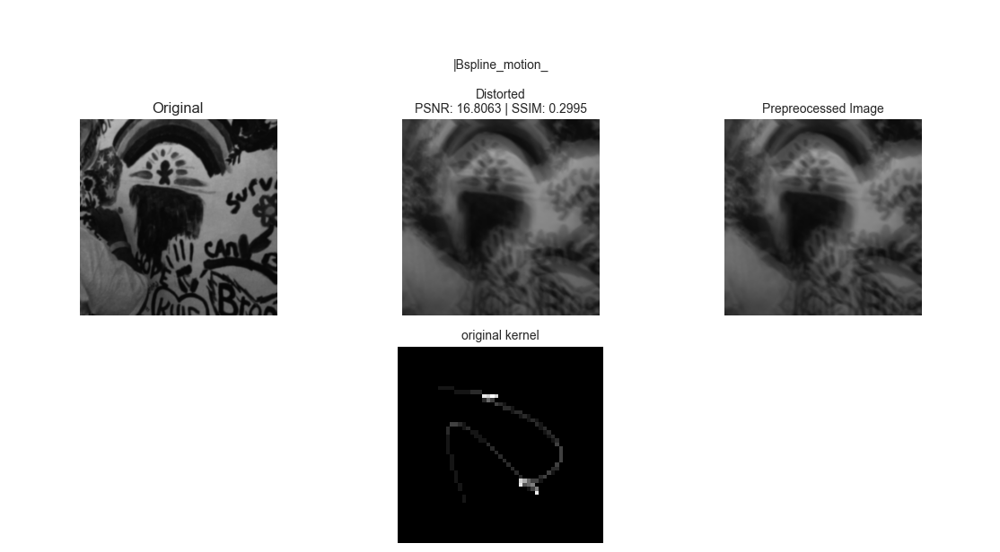

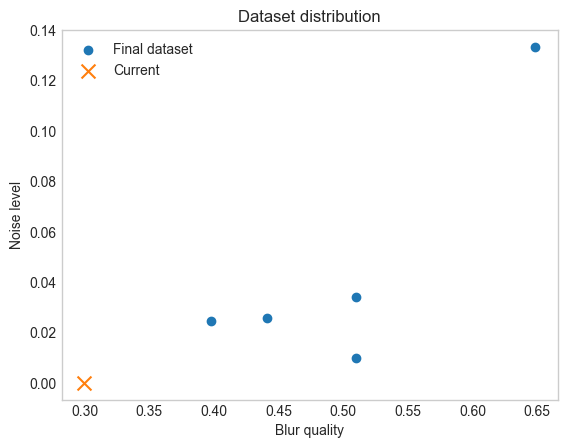

In [29]:
frame.changescale(False)
# frame.read_one('boy.png')
# frame.read_one('cameraman.png')
# frame.read_one('childs.png')
frame.read_one('drawing.png')
# frame.read_one('airplane.png')
# frame.read_one('clock.jpg')
# frame.read_one('flags.jpg')
# frame.read_one('lenna.png')
# frame.read_one('monarch.png')
# frame.read_one('street.png')
# frame.read_one('temple.png')

fl_gauss = GaussianNoise(5.0)
fl_pink = Pink_Noise(noise_level=0.015)
fl_brown = Brown_Noise(noise_level=0.1)
fl_poisson = PoissonNoise(param=0.4)


fl = fl_bspline5
fl_noise = fl_gauss

frame.filter(fl)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
# frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)


frame.clear_input()

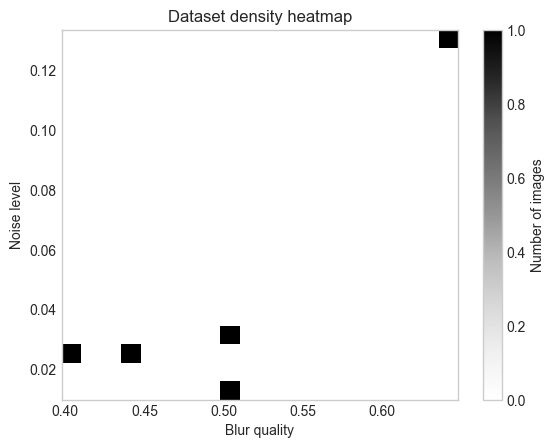

Готово.


In [30]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")
plot_heatmap(final_points)

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "s_spiral"
noise = ""
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

kernel = get_kernel_from_filter([fl])
kernel_path = kernel_name + "_kernel.png"
save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)

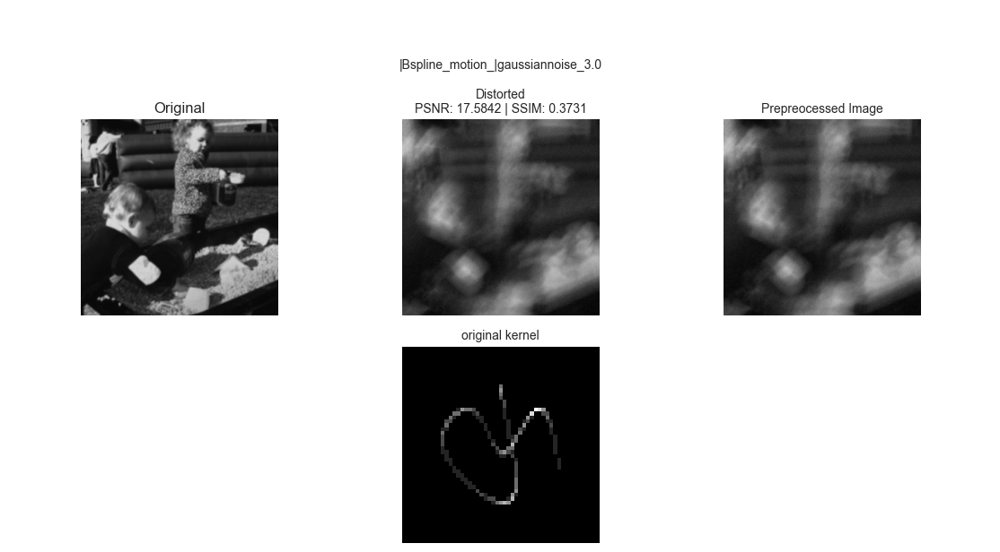

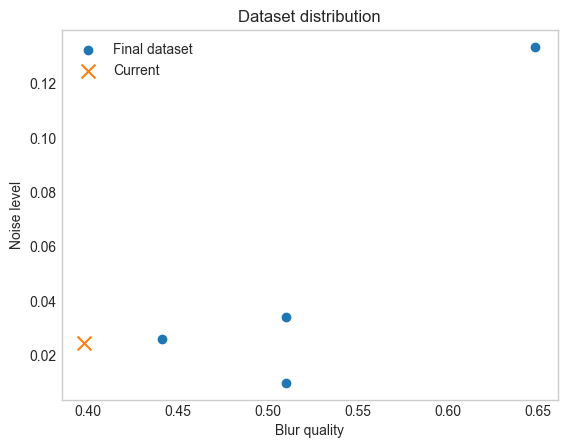

In [27]:
frame.changescale(False)
# frame.read_one('boy.png')
# frame.read_one('cameraman.png')
frame.read_one('childs.png')
# frame.read_one('drawing.png')
# frame.read_one('airplane.png')
# frame.read_one('clock.jpg')
# frame.read_one('flags.jpg')
# frame.read_one('lenna.png')
# frame.read_one('monarch.png')
# frame.read_one('street.png')
# frame.read_one('temple.png')

fl_gauss = GaussianNoise(3.0)
fl_pink = Pink_Noise(noise_level=0.015)
fl_brown = Brown_Noise(noise_level=0.1)
fl_poisson = PoissonNoise(param=0.4)


fl = fl_bspline3
fl_noise = fl_gauss

frame.filter(fl)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)


frame.clear_input()

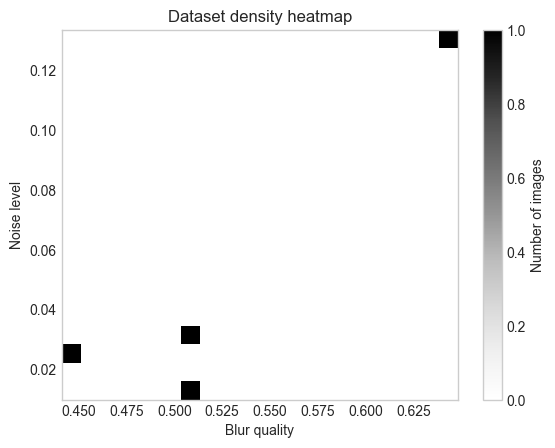

Готово.


In [28]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")
plot_heatmap(final_points)

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "w_spiral"
noise = "gauss"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

kernel = get_kernel_from_filter([fl])
kernel_path = kernel_name + "_kernel.png"
save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)

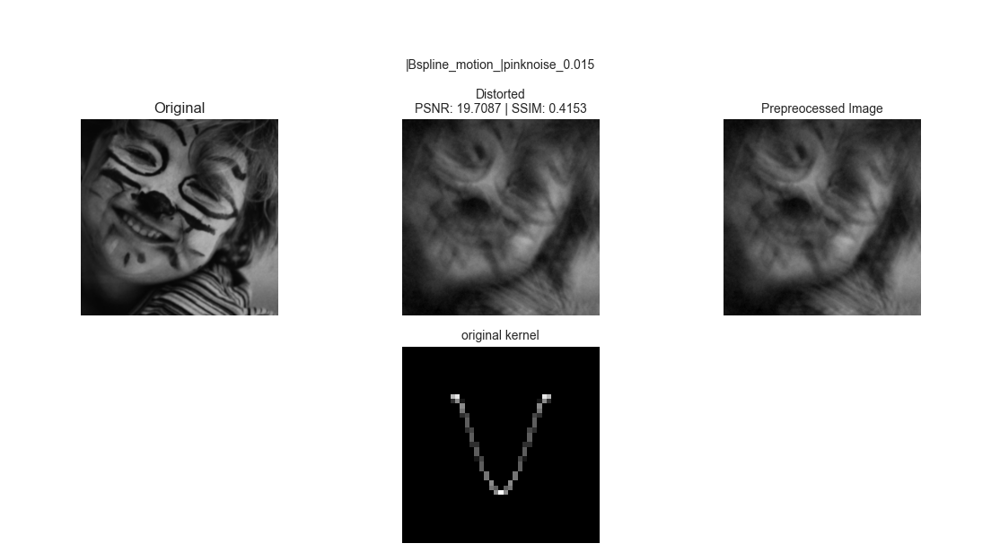

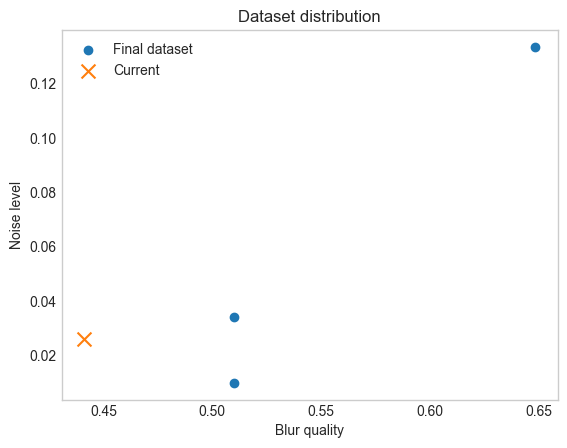

In [25]:
frame.changescale(False)
frame.read_one('boy.png')
# frame.read_one('cameraman.png')
# frame.read_one('childs.png')
# frame.read_one('drawing.png')
# frame.read_one('airplane.png')
# frame.read_one('clock.jpg')
# frame.read_one('flags.jpg')
# frame.read_one('lenna.png')
# frame.read_one('monarch.png')
# frame.read_one('street.png')
# frame.read_one('temple.png')

fl_gauss = GaussianNoise(1.5)
fl_pink = Pink_Noise(noise_level=0.015)
fl_brown = Brown_Noise(noise_level=0.1)
fl_poisson = PoissonNoise(param=0.4)


fl = fl_bspline
fl_noise = fl_pink

frame.filter(fl)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.75)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)


frame.clear_input()

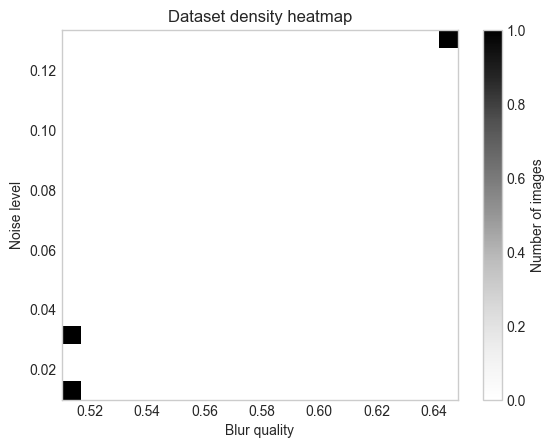

Готово.


In [26]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")
plot_heatmap(final_points)

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "libra"
noise = "pink"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

kernel = get_kernel_from_filter([fl])
kernel_path = kernel_name + "_kernel.png"
save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)

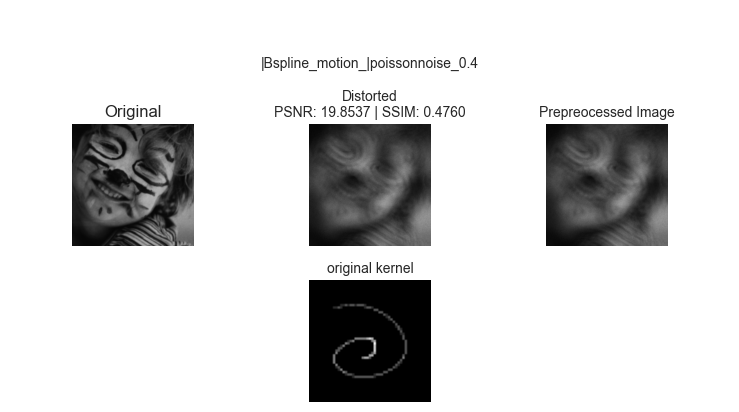

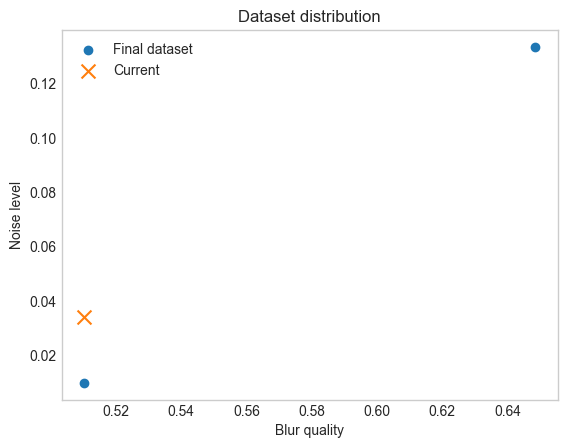

In [23]:
frame.changescale(False)
frame.read_one('boy.png')
# frame.read_one('cameraman.png')
# frame.read_one('childs.png')
# frame.read_one('drawing.png')
# frame.read_one('airplane.png')
# frame.read_one('clock.jpg')
# frame.read_one('flags.jpg')
# frame.read_one('lenna.png')
# frame.read_one('monarch.png')
# frame.read_one('street.png')
# frame.read_one('temple.png')

fl_gauss = GaussianNoise(1.5)
fl_colored_1 = Pink_Noise(noise_level=0.05)
fl_colored_3 = Brown_Noise(noise_level=0.1)
fl_poisson = PoissonNoise(param=0.4)


fl = fl_bspline11
fl_noise = fl_poisson

frame.filter(fl)
# frame.show(size=0.5)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.5)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)


frame.clear_input()

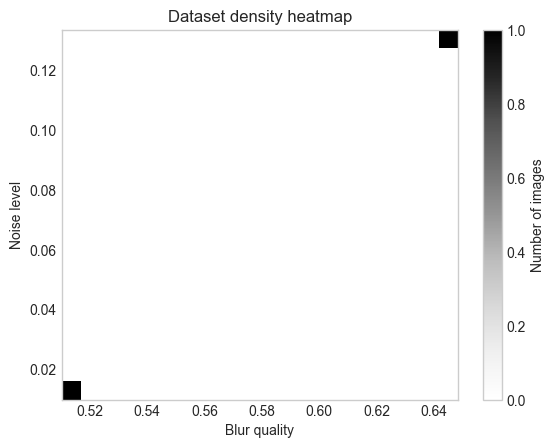

Готово.


In [24]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")
plot_heatmap(final_points)

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "spiral"
noise = "poisson"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

kernel = get_kernel_from_filter([fl])
kernel_path = kernel_name + "_kernel.png"
save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)

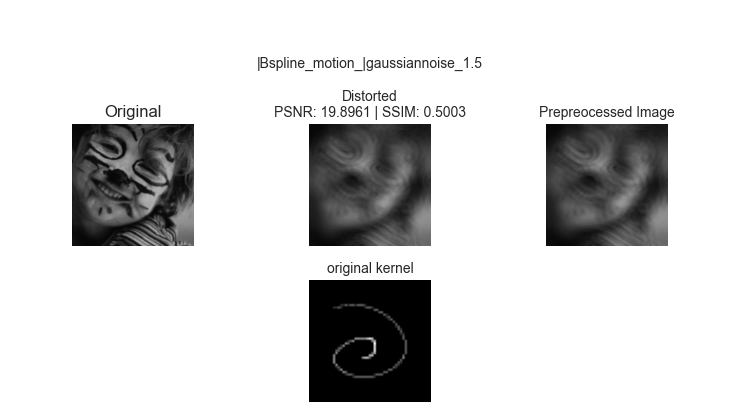

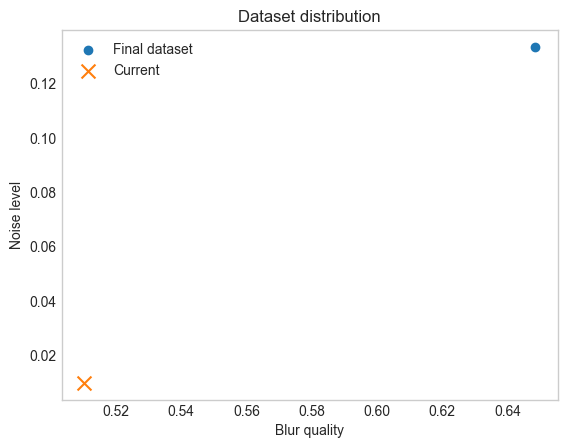

In [20]:
frame.changescale(False)
frame.read_one('boy.png')
# frame.read_one('cameraman.png')
# frame.read_one('childs.png')
# frame.read_one('drawing.png')
# frame.read_one('airplane.png')
# frame.read_one('clock.jpg')
# frame.read_one('flags.jpg')
# frame.read_one('lenna.png')
# frame.read_one('monarch.png')
# frame.read_one('street.png')
# frame.read_one('temple.png')

fl_gauss = GaussianNoise(1.5)
fl_colored_1 = Pink_Noise(noise_level=0.05)
fl_colored_3 = Brown_Noise(noise_level=0.1)
fl_poisson = PoissonNoise(param=0.4)


fl = fl_bspline11
fl_noise = fl_gauss

frame.filter(fl)
# frame.show(size=0.5)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.5)
ssim_noised = (frame.images[0].blurred_ssim).copy()

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)


frame.clear_input()

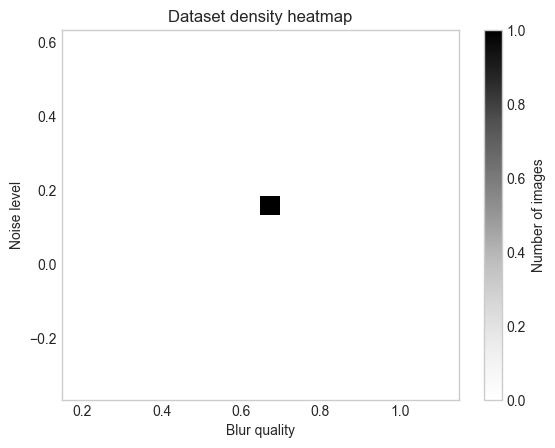

Готово.


In [21]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")
plot_heatmap(final_points)

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "spiral"
noise = "gaussian"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

kernel = get_kernel_from_filter([fl])
kernel_path = kernel_name + "_kernel.png"
save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)

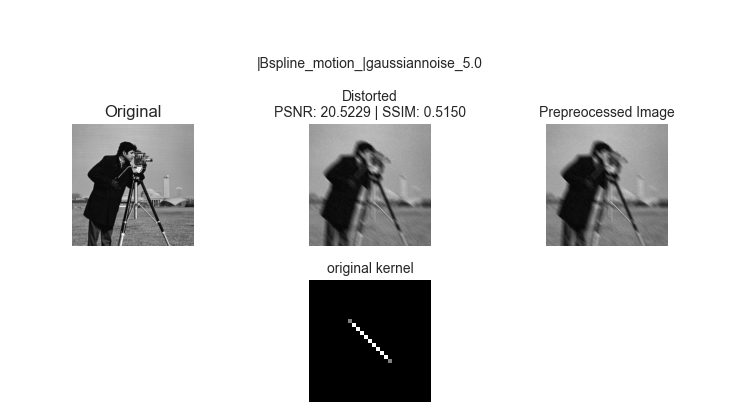

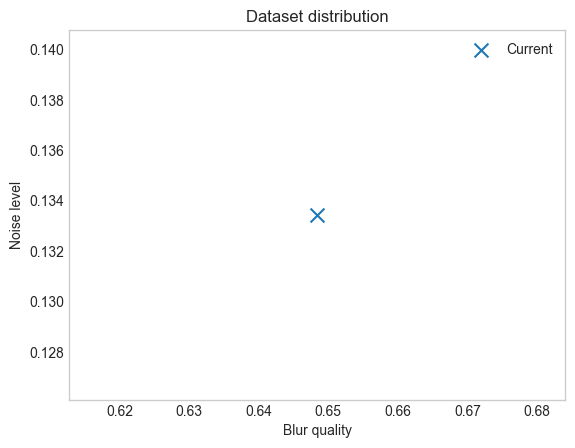

In [18]:
fl = fl_bspline12
fl_noise = fl_gauss

frame.changescale(False)

# frame.read_one('boy.png')
frame.read_one('cameraman.png')
# frame.read_one('childs.png')
# frame.read_one('drawing.png')

frame.filter(fl)
# frame.show(size=0.5)
ssim_blurred = (frame.images[0].blurred_ssim).copy()
frame.filter(fl_noise)
frame.show(size=0.5)
ssim_noised = frame.images[0].blurred_ssim

x, y = show_current_point(ssim_blurred, ssim_noised, final_points)


frame.clear_input()

In [19]:
# save_point(final_points, x, y)
# save_points_to_file(final_points, "points.json")
plot_heatmap(final_points)

folder_in = "images\\new_datasete\\tmp"
folder_out = "images\\new_datasete\\distorted"
kernel_name = "linear"
noise = "gaussian"
distorted_image_path = rename_files(folder_in, folder_out, kernel_name, noise)

save_all(final_points, dataset_points, distorted_image_path, x, y)
save_all_to_files(final_points, dataset_points)

kernel = get_kernel_from_filter([fl])
kernel_path = kernel_name + "_kernel.png"
save_kernel(kernel, "images\\new_datasete\\ground_truth_filters", kernel_path)

Готово.
